<a href="https://colab.research.google.com/github/interngithub2020/RF_modulation_classification/blob/master/model_evaluation_matlab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction and aims of this notebook

This notebook evaluates the effectiveness of the Resnet-iq model and the constellation model on the Matlab datasets. These models have performed well on the radioML dataset, but the question is do they work well on different types of noise? There is also the question of how well a model trained on an easier dataset can adapt to another harder dataset.

The main dataset we are focusing on is the Matlab hard dataset which is the one that contains the most realistic Rician fading, Doppler effect and local oscillator shift, and as a result, is the most distorted. Refer to dataset_visualisation notebook for a more in-depth description of the datasets. Therefore, we expect classification models to perform worse on this hard dataset. 

I also created two other datasets containing less distortion to assess how well a model trained on one dataset adapts to another, especially when the typical scenario is training on relatively clean signals and deploying in a noisy environemnt.

In [1]:
from google.colab import drive
drive.mount("/content/gdrive/")
root_path = "/content/gdrive/My Drive/mod_rec/"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [2]:
#%reset
%tensorflow_version 1.x
from sklearn.externals import joblib
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import keras
from keras.models import Sequential, Model, load_model
from keras.layers import Dense, Dropout, Activation, Flatten, Reshape, BatchNormalization, LSTM, Conv1D, MaxPooling1D, Conv2D, Input, Concatenate, Add, PReLU
from keras.layers.convolutional import Convolution1D ,Convolution2D, MaxPooling2D, ZeroPadding2D, AveragePooling2D
from keras.initializers import glorot_uniform, Constant
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.callbacks import EarlyStopping, Callback, ModelCheckpoint
from scipy.interpolate import UnivariateSpline
from keras.utils import to_categorical
from sklearn import preprocessing
from keras.optimizers import Adam
from keras import regularizers


plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

TensorFlow 1.x selected.


/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.


# Training parameters and helper functions

Here I set training parameters and helper functions used in common across all models. 

## Variables used for training the models



In [3]:
EPOCHS = 100
NUM_CLASSES = 8
BATCH_SIZE = 64
PATIENCE = 10

## Helper function for dataset splitting

In [4]:
def split_data(data, labels, percentage):
  np.random.seed(7)
  perm_idx = np.random.permutation(labels.shape[0])
  data_perm = data[perm_idx]
  labels_perm = labels[perm_idx]
  split_point = int((1-percentage)*data_perm.shape[0])
  data_train = data_perm[0:split_point]
  data_test = data_perm[split_point:]
  labels_train = labels_perm[0:split_point]
  labels_test = labels_perm[split_point:]
  y_train = labels_train[:,0]
  y_test = labels_test[:,0]
  return data_train, data_test, labels_train, labels_test, y_train, y_test

## Functions for data conversion

In [5]:
#Normalisation is very important
def iq2ampphase(inphase, quad):
    amplitude = np.sqrt(np.square(inphase) + np.square(quad))
    amp_norm = np.linalg.norm(amplitude) #L2 norm
    amplitude = amplitude/amp_norm #normalise
    phase = np.arctan(np.divide(quad, inphase))
    phase = 2.*(phase - np.min(phase))/np.ptp(phase)-1 #rescale phase to range [-1, 1]
    return amplitude, phase

#convert array of multiple iq samples into array of multiple ampphase samples
def arr_iq2ap(X):
  X_ap = []
  for k in range(X.shape[0]):
    I = X[k][0,:]
    Q = X[k][1,:]
    amp, phase = iq2ampphase(I, Q)
    ap = np.array([amp, phase])
    X_ap.append(ap)
  X_ap = np.array(X_ap)
  return X_ap

In [6]:
def arr2img(arr, chnum):
  norm = plt.Normalize(vmin=arr.min(), vmax=arr.max())
  if chnum == 1:
      cmap = plt.cm.gray
      image4d = cmap(norm(arr)) #RGBA
      img = image4d[:,:,0] #All RGBA channels identical
      
  elif chnum == 3:
      cmap = plt.cm.hot #or can choose any other colormap
      image4d = cmap(norm(arr)) #RGBA
      img = image4d[:,:,:3] #ignore A channel
    
  return img

## Functions for generating and plotting confusion matrices


In [7]:
def generate_confusion_matrix(model, X,y, one_hot_transformer, batch_size):
    """
      y is the one hot encoded label vector passed to the model.evaluate
    """
    mod_to_idx = {mod:idx for idx,mod in enumerate(one_hot_transformer.classes_)} # use this to map modulation name to index
    y_hat = model.predict(X, batch_size)
    y_hat_onehot = np.zeros_like(y_hat)
    y_hat_onehot[np.arange(len(y_hat)), y_hat.argmax(1)] = 1 # convert the probabilities to one-hot format
    y_hat_mod = one_hot_transformer.inverse_transform(y_hat_onehot) # transform predictions to strings
    y_mod = one_hot_transformer.inverse_transform(y) # transform ground truth back to strings
    confusion_mat = np.zeros([NUM_CLASSES,NUM_CLASSES])

    acc = np.mean(y_mod == y_hat_mod)
    # fill in the confusion matrix
    for i in range(y.shape[0]):
        
        true_idx = mod_to_idx[y_mod[i]]
        pred_idx = mod_to_idx[y_hat_mod[i]]          
        confusion_mat[pred_idx,true_idx] += 1

    # normalize the matrix column wise
    for i in range(NUM_CLASSES):
        if np.sum(confusion_mat[:,i]) > 0:
          confusion_mat[:,i] /= np.sum(confusion_mat[:,i])
    
    return confusion_mat,acc

 
import seaborn as sns
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues, labels=[]):
  ax= plt.subplot()
  sns.heatmap(cm, annot=True, ax = ax, cmap=cmap); #annot=True to annotate cells
  
  plt.title(title)
  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels, rotation=45)
  plt.yticks(tick_marks, labels)
  plt.tight_layout()
  plt.ylabel('Predicted label')
  plt.xlabel('True label')

## Label encoder class of functions

In [8]:
#created my own LabelBinarizer class so can encode both 2-class and multiclass cases
class MyLabelBinarizer(preprocessing.LabelBinarizer):
    def transform(self, y):
        Y = super().transform(y)
        if self.y_type_ == 'binary':
            return np.hstack((Y, 1-Y))
        else:
            return Y

    def inverse_transform(self, Y, threshold=None):
        if self.y_type_ == 'binary':
            return super().inverse_transform(Y[:, 0], threshold)
        else:
            return super().inverse_transform(Y, threshold)

## ModelEvaluater Class of functions for training and evaluation
(1) formatting label data into one-hot format,  

(2) fitting model with training data,

(3) evaluating model using accuracy plots and confusion matrices

During fitting, Model Checkpoints are set so that weights files are automatically saved when validation loss decreases. There is also earlystopping, for which the default patience is 10 epochs. 

During print_summary(), the model is evaluated on the test set and prints out the confusion matrices for different SNRs and a graph showing accuracy over different SNRs.

Example on using ModelEvaluater class: 

    fc_model = build_fc_net(X_test.shape[1],X_teat.shape[2])
    fc_model_evaluater = ModelEvaluater(fc_model, X_train, y_train, X_val, y_val, X_test, y_test, labels_test, BATCH_SIZE,  'fc-net' )
    fc_model_evaluater.fit(EPOCHS, patience=10)
    fc_model_evaluater.print_summary()


In [9]:
class ModelEvaluater:
  def __init__(self, model, X_train, y_train, X_val, y_val, X_test, y_test,
               labels_test, batch_size, model_name, channels_first=True, feature_type=1):
    if channels_first:
      self.X_train = X_train
      self.X_val = X_val
      self.X_test = X_test
    else:
      self.X_train = X_train.reshape([X_train.shape[0], X_train.shape[2], X_train.shape[1]])
      self.X_val = X_val.reshape([X_val.shape[0], X_val.shape[2], X_val.shape[1]])
      self.X_test = X_test.reshape([X_test.shape[0], X_test.shape[2], X_test.shape[1]])
    
    self.feature_type = feature_type
      
    self.model = model
    self.y_train = y_train
    self.y_val = y_val
    self.y_test = y_test
    self.labels_test = labels_test
    self.model_name = model_name
    self._checkpoint_callback = ModelCheckpoint(filepath=root_path + '%s-weights-{epoch}.hdf5' % self.model_name,
                                                verbose=1, save_best_only=True)
    self._train_accs = []
    self._val_accs = []
    self._snr_accs = []
    
    self.batch_size = batch_size
    
    # get the modulation types into an array
    self.mod_types = np.unique(labels_test[:,0])
  
    # fit a label binarizer 
    self.mod_to_onehot = MyLabelBinarizer()
    self.mod_to_onehot.fit(self.mod_types)

    # transform the y values to one-hot encoding
    self.y_train = self.mod_to_onehot.transform(y_train)
    self.y_val = self.mod_to_onehot.transform(y_val)
    self.y_test = self.mod_to_onehot.transform(y_test)
  
    print('y_train %s' %(y_train.shape))
    print('y_val %s' %(y_val.shape))
    print('y_test %s' %(y_test.shape))
    

    
  def fit(self, epochs, patience=10):
    curr_X, curr_y = self.X_train, self.y_train
    val_X, val_y = self.X_val, self.y_val
    callbacks = [self._checkpoint_callback, EarlyStopping(patience=patience)]
   
     # train the model
    model_info = self.model.fit(curr_X, curr_y,
                                batch_size=self.batch_size,
                                epochs=epochs,
                                verbose=1,
                                validation_data=(val_X, val_y),
                                callbacks=callbacks)

    self._train_accs.extend(model_info.history['accuracy'])
    self._val_accs.extend(model_info.history['val_accuracy'])



  def print_summary(self):
    # plot validation accuracy vs training accuracy
    plt.plot(np.arange(len(self._train_accs)), self._train_accs, '-o', label='training accuracy')
    plt.plot(np.arange(len(self._val_accs)), self._val_accs, '-o', label='validation accuracy')
    plt.legend()
    plt.xlabel('epochs')
    plt.title('%s -validation vs training accuracy' %(self.model_name))
    display(plt.show())

    #plot confusion matrix for all, low, med and high SNR
    snr_ranges = [(-10, 30), (4, 16), (18, 30), (26,30)]
    for snr_rng in snr_ranges:
      labels_test = np.array([int(lbl) for lbl in self.labels_test[:,1]])
      idx = np.where((labels_test >= snr_rng[0]) & (labels_test <=snr_rng[1]))
      if self.feature_type==2:
        tmp_img = self.X_test[0]
        tmp_time = self.X_test[1]
        X_snr = [tmp_img[idx], tmp_time[idx]]
      elif self.feature_type==1:
        X_snr = self.X_test[idx]
      y_snr = self.y_test[idx]
      conf_mat, acc = generate_confusion_matrix(self.model, X_snr, y_snr, self.mod_to_onehot, self.batch_size)
      plot_confusion_matrix(conf_mat, labels=self.mod_to_onehot.classes_, 
                            title='%s- Confusion Matrix (SNR in range %s) - acc=%s' %(self.model_name, snr_rng, acc*100))
      plt.show()

    # get accuracy per snr
    snr_accs = {}
    snrs = np.unique(np.unique(self.labels_test,axis=0)[:,1]).astype('int32')
    for snr in sorted(snrs):
      labels_test = np.array([int(lbl) for lbl in self.labels_test[:,1]])
      idx = np.where(labels_test == snr)

      if self.feature_type==2:
        tmp_img = self.X_test[0]
        tmp_time = self.X_test[1]
        X_snr = [tmp_img[idx], tmp_time[idx]]
      elif self.feature_type==1:
        X_snr = self.X_test[idx]

      y_snr = self.y_test[idx]

      #calculate acc for each snr
      mod_to_idx = {mod:idx for idx,mod in enumerate(self.mod_to_onehot.classes_)} # use this to map modulation name to index
      y_hat = self.model.predict(X_snr, self.batch_size)
      y_hat_onehot = np.zeros_like(y_hat)
      y_hat_onehot[np.arange(len(y_hat)), y_hat.argmax(1)] = 1 # convert the probabilities to one-hot format
      y_hat_mod = self.mod_to_onehot.inverse_transform(y_hat_onehot) # transform predictions to strings
      y_mod = self.mod_to_onehot.inverse_transform(y_snr) # transform ground truth back to strings

      acc = np.mean(y_mod == y_hat_mod)
      snr_accs[snr] = acc

    # plot the accuracy against the snr
    plt.plot(list(snr_accs.keys()),list(snr_accs.values()))
    plt.xlabel("Signal to Noise Ratio")
    plt.ylabel("Classification Accuracy")
    plt.xticks(list(snr_accs.keys()))
    plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
    plt.grid(True)
    plt.show()


  def accpersnr_model(self):
    snr_accs = {}
    snrs = np.unique(np.unique(self.labels_test,axis=0)[:,1]).astype('int32')
    for snr in sorted(snrs):
      labels_test = np.array([int(lbl) for lbl in self.labels_test[:,1]])
      idx = np.where(labels_test == snr)

      if self.feature_type==2:
        tmp_img = self.X_test[0]
        tmp_time = self.X_test[1]
        X_snr = [tmp_img[idx], tmp_time[idx]]
      elif self.feature_type==1:
        X_snr = self.X_test[idx]
      y_snr = self.y_test[idx]

      #calculate acc for each snr
      mod_to_idx = {mod:idx for idx,mod in enumerate(self.mod_to_onehot.classes_)} # use this to map modulation name to index
      y_hat = self.model.predict(X_snr, self.batch_size)
      y_hat_onehot = np.zeros_like(y_hat)
      y_hat_onehot[np.arange(len(y_hat)), y_hat.argmax(1)] = 1 # convert the probabilities to one-hot format
      y_hat_mod = self.mod_to_onehot.inverse_transform(y_hat_onehot) # transform predictions to strings
      y_mod = self.mod_to_onehot.inverse_transform(y_snr) # transform ground truth back to strings

      acc = np.mean(y_mod == y_hat_mod)
      snr_accs[snr] = acc

    return snr_accs

  
  def confmat_snr(self, snr_rng):
      labels_test = np.array([int(lbl) for lbl in self.labels_test[:,1]])
      idx = np.where((labels_test >= snr_rng[0]) & (labels_test <=snr_rng[1]))
      if self.feature_type==2:
        tmp_img = self.X_test[0]
        tmp_time = self.X_test[1]
        X_snr = [tmp_img[idx], tmp_time[idx]]
      elif self.feature_type==1:
        X_snr = self.X_test[idx]
      y_snr = self.y_test[idx]
      conf_mat, acc = generate_confusion_matrix(self.model, X_snr, y_snr, self.mod_to_onehot, self.batch_size)
      plot_confusion_matrix(conf_mat, labels=self.mod_to_onehot.classes_, 
                            title='%s- Confusion Matrix (SNR in range %s) - acc=%s' %(self.model_name, snr_rng, acc*100))
      plt.show()

#HARD DATASET
This section utilises almost the entire dataset for training, and analyses the performance of models on the hard dataset in more detail.

## Loading and formatting of data

In a python script, I divided the Matlab hard dataset into a train-val-test split of 0.67 - 0.13 - 0.2, and stored them in 'rml_trainvaltest.hdf5'. They have already been shuffled, so simply load them as below.

Refer to [this Matlab tutorial](https://www.mathworks.com/help/deeplearning/ug/modulation-classification-with-deep-learning.html) for more information on the dataset.

In [10]:
from sklearn.externals import joblib
data = joblib.load(root_path + 'data/hard_trainvaltest.hdf5')

In [ ]:
#quick understanding of data
print(data.keys())
print('Train val test size: ', data['train']['X'].shape, data['val']['X'].shape, data['test']['X'].shape)
print('Check if data is shuffled: ', data['val']['labels'][:10])

uniq, counts = np.unique(data['train']['labels'][:,1], return_counts = True)
print('Check snr range: ', uniq)
print('Check distribution of samples across SNR: ', counts)

uniq, counts = np.unique(data['train']['labels'][:,0], return_counts = True)
print('Check modulation types: ', uniq)
print('Check distribution of samples across modulation types: ', counts)

dict_keys(['train', 'test', 'val'])
Train val test size:  (112560, 2, 1024) (21840, 2, 1024) (33600, 2, 1024)
Check if data is shuffled:  [['dBPSK' '-4']
 ['cCPFSK' '10']
 ['cCPFSK' '26']
 ['b8PSK' '4']
 ['cGFSK' '2']
 ['cGFSK' '18']
 ['b8PSK' '18']
 ['a64QAM' '28']
 ['bQPSK' '28']
 ['dBPSK' '12']]
Check snr range:  ['-10' '-2' '-4' '-6' '-8' '0' '10' '12' '14' '16' '18' '2' '20' '22' '24'
 '26' '28' '30' '4' '6' '8']
Check distribution of samples across SNR:  [5462 5355 5308 5344 5265 5372 5393 5303 5382 5363 5339 5392 5431 5353
 5399 5333 5387 5380 5375 5354 5270]
Check modulation types:  ['a16QAM' 'a64QAM' 'b8PSK' 'bQPSK' 'cCPFSK' 'cGFSK' 'd4PAM' 'dBPSK']
Check distribution of samples across modulation types:  [14097 14010 14043 14083 14090 14149 13945 14143]


### Load raw IQ train, val, test data

In [11]:
#load data
X_train = data['train']['X']
labels_train = data['train']['labels'] 
y_train = labels_train[:,0]

X_val = data['val']['X']
labels_val = data['val']['labels'] 
y_val = labels_val[:,0]

X_test = data['test']['X']
labels_test = data['test']['labels'] 
y_test = labels_test[:,0]

#### Convert to ampphase

In [12]:
#convert to ampphase
X_ap_train = arr_iq2ap(X_train)
X_ap_val = arr_iq2ap(X_val)
X_ap_test = arr_iq2ap(X_test)

### Quick data visualisation of time-series
Here we do a quick visualisation of the amplitude-phase data and I/Q data to get a feel of what the time-series look like.

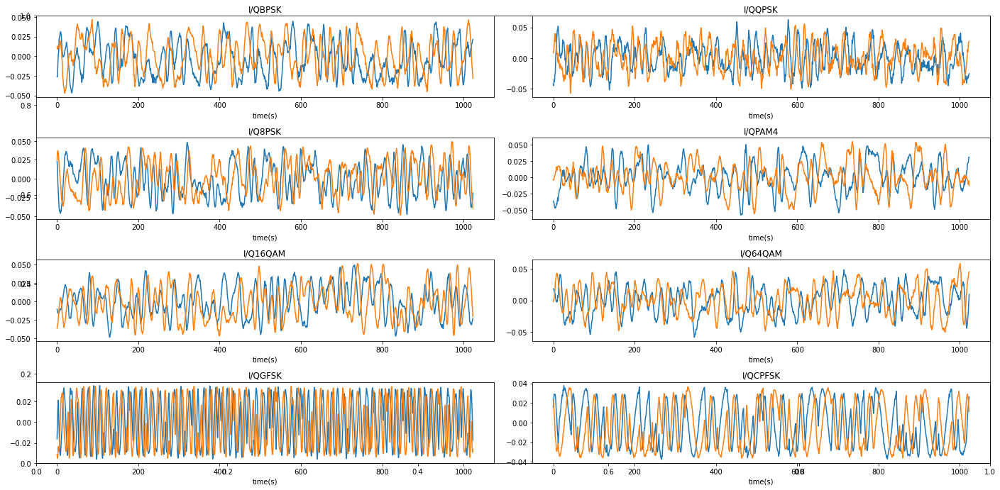

In [ ]:
_snr = 30
offset = 100
modtypes = ['BPSK', 'QPSK', '8PSK', 'PAM4', '16QAM', '64QAM', 'GFSK', 'CPFSK']


fig, ax = plt.subplots(figsize=(20, 10)) 
for i, mod in enumerate(modtypes):
    I = data[(mod, _snr)][offset][0]
    Q = data[(mod, _snr)][offset][1]
    ax = fig.add_subplot(4, 2, i+1)
    ax.set_xlabel('time(s)')
    ax.plot(I)
    ax.plot(Q)
    plt.title('I/Q' + str(mod))
    plt.tight_layout()
plt.show()

In [ ]:
NUM_CLASSES = 8
# 1d conv resnet
def residual_stack(x, f):
    # 1x1 conv linear
    x = Conv1D(f, 1, strides=1, padding='same', data_format='channels_last')(x)
    x = Activation('linear')(x)
    
    # residual unit 1    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # residual unit 2    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides = 1, padding = "same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # max pooling layer
    x = MaxPooling1D(pool_size=2, strides=None, padding='valid', data_format='channels_last')(x)
    return x

# define resnet model
def build_ResNet(input_shape, classes):   
    # create input tensor
    x_input = Input(input_shape)
    x = x_input
    # residual stack
    num_filters = 40
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    
    # output layer
    x = Flatten()(x)
    x = Dense(128, activation="selu", kernel_initializer="he_normal")(x)
    x = Dropout(.5)(x)
    x = Dense(128, activation="selu", kernel_initializer="he_normal")(x)
    x = Dropout(.5)(x)
    x = Dense(classes , activation='softmax', kernel_initializer = glorot_uniform(seed=0))(x)
    
    # Create model
    model = Model(inputs = x_input, outputs = x)

    adm = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0, amsgrad=False)
    model.compile(optimizer=adm, loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()

    return model

### Load train, val, test constellation data

In [2]:
from sklearn.externals import joblib
import numpy as np
from matplotlib import pyplot as plt 

#function to apply colormap to array and return the array in colour form
def arr2img(arr, chnum):
  norm = plt.Normalize(vmin=arr.min(), vmax=arr.max())
  if chnum == 1:
      cmap = plt.cm.gray
      image4d = cmap(norm(arr)) #RGBA
      img = image4d[:,:,0] #All RGBA channels identical
      
  elif chnum == 3:
      cmap = plt.cm.hot #or can choose any other colormap
      image4d = cmap(norm(arr)) #RGBA
      img = image4d[:,:,:3] #ignore A channel
  
  return img

#root_path = ''
dataset = 'hard'
data = joblib.load(root_path + 'data/' + dataset + '_trainvaltest.hdf5')

#load data
X_train = data['train']['X']
labels_train = data['train']['labels'] 

X_val = data['val']['X']
labels_val = data['val']['labels'] 

X_test = data['test']['X']
labels_test = data['test']['labels'] 


snrthresh = 4
snrs = labels_train[:,1]
snrs = np.array([int(snr) for snr in snrs])
y = np.array([str(mod) for mod in labels_train[:,0]])
idx = np.where((snrs >= snrthresh) & ((y =='a16QAM') | (y =='a64QAM') | (y=='bQPSK') | (y=='b8PSK')))
X_train = X_train[idx]
labels_train = labels_train[idx]
idx = np.where(labels_train )

snrs = labels_val[:,1]
snrs = np.array([int(snr) for snr in snrs])
y = np.array([str(mod) for mod in labels_val[:,0]])
idx = np.where((snrs >= snrthresh) & ((y =='a16QAM') | (y =='a64QAM')| (y=='bQPSK') | (y=='b8PSK')))
X_val = X_val[idx]
labels_val = labels_val[idx]

snrs = labels_test[:,1]
snrs = np.array([int(snr) for snr in snrs])
y = np.array([str(mod) for mod in labels_test[:,0]])
idx = np.where((snrs >= snrthresh) & ((y =='a16QAM') | (y =='a64QAM')| (y=='bQPSK') | (y=='b8PSK')))
X_test = X_test[idx]
labels_test = labels_test[idx]


nbins = [64] #set the ones you want
ch = [3]
xyrange = 0.05 #0.02 for radioml

for b in nbins:
    for c in ch:
        filename = root_path + 'data/QAMPSK' + dataset + '_trainvaltest_constel' + str(b) + '_' + str(c) + '.hdf5'
        constel_train = []
        constel_val = []
        constel_test = []

        print(b,c, 'train')
        for i, samp in enumerate(X_train):
            counts, xedges, yedges = np.histogram2d(samp[0], samp[1], bins=b,range = [[-xyrange, xyrange], [-xyrange, xyrange]])
            img = arr2img(counts, c)
            constel_train.append(img)
        constel_train = np.array(constel_train)

        print(b,c, 'val')
        for i, samp in enumerate(X_val):
            counts, xedges, yedges = np.histogram2d(samp[0], samp[1], bins=b,range = [[-xyrange, xyrange], [-xyrange, xyrange]])
            img = arr2img(counts, c)
            constel_val.append(img)
        constel_val = np.array(constel_val)

        print(b,c, 'test')
        for i, samp in enumerate(X_test):
            counts, xedges, yedges = np.histogram2d(samp[0], samp[1], bins=b,range = [[-xyrange, xyrange], [-xyrange, xyrange]])
            img = arr2img(counts, c)
            constel_test.append(img)
        constel_test = np.array(constel_test)

        trainvaltest = {}
        trainvaltest['train'] = {}
        trainvaltest['train']['X'] = constel_train
        trainvaltest['train']['labels'] = labels_train

        trainvaltest['val'] = {}
        trainvaltest['val']['X'] = constel_val
        trainvaltest['val']['labels'] = labels_val

        trainvaltest['test'] = {}
        trainvaltest['test']['X'] = constel_test
        trainvaltest['test']['labels'] = labels_test

        joblib.dump(trainvaltest, filename)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


64 3 train
64 3 val
64 3 test


In [11]:
from sklearn.externals import joblib
data_constel = joblib.load(root_path + 'data/QAMPSKhard_trainvaltest_constel64_3.hdf5')

In [12]:
#load data
X_img_train = data_constel['train']['X']
y_img_train = data_constel['train']['labels'][:,0]
labels_img_train = data_constel['train']['labels'] 

X_img_val = data_constel['val']['X']
y_img_val = data_constel['val']['labels'][:,0]
labels_img_val = data_constel['val']['labels'] 

X_img_test = data_constel['test']['X']
y_img_test = data_constel['test']['labels'][:,0]
labels_img_test = data_constel['test']['labels'] 

In [13]:
del data_constel

In [14]:
nbins = X_img_train.shape[1]
c = 3
X_img_train = X_img_train.reshape(-1, nbins, nbins, c)
X_img_val = X_img_val.reshape(-1, nbins, nbins, c)
X_img_test = X_img_test.reshape(-1, nbins, nbins, c)

## Training using ResNet model on I/Q time-series features

### Resnet CNN
From [Over-the-Air Deep Learning Based Radio
Signal Classification](https://arxiv.org/pdf/1712.04578.pdf)

Followed: https://medium.com/gsi-technology/residual-neural-networks-in-python-1796a57c2d7 

This CNN is based on ResNet which includes skip connections between convolution layers. Skip connections allow features to operate at multiple scales and depths through the network. This has led to significant improvements for both
CV and time-series audio tasks. 
The network used here contains 5 residual stacks.


In [13]:
# 1d conv resnet
def residual_stack(x, f):
    # 1x1 conv linear
    x = Conv1D(f, 1, strides=1, padding='same', data_format='channels_last')(x)
    x = Activation('linear')(x)
    
    # residual unit 1    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # residual unit 2    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides = 1, padding = "same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # max pooling layer
    x = MaxPooling1D(pool_size=2, strides=None, padding='valid', data_format='channels_last')(x)
    return x

# define resnet model
def build_ResNet(input_shape, classes):   
    # create input tensor
    x_input = Input(input_shape)
    x = x_input
    # residual stack
    num_filters = 40
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    x = residual_stack(x, num_filters)
    
    # output layer
    x = Flatten()(x)
    x = Dense(128, activation="selu", kernel_initializer="he_normal")(x)
    x = Dropout(.5)(x)
    x = Dense(128, activation="selu", kernel_initializer="he_normal")(x)
    x = Dropout(.5)(x)
    x = Dense(classes , activation='softmax', kernel_initializer = glorot_uniform(seed=0))(x)
    
    # Create model
    model = Model(inputs = x_input, outputs = x)

    adm = keras.optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-07, decay=0.0, amsgrad=False)
    model.compile(optimizer=adm, loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()

    return model

### Train resnet-iq

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_51 (Conv1D)              (None, 1024, 40)     120         input_3[0][0]                    
__________________________________________________________________________________________________
activation_51 (Activation)      (None, 1024, 40)     0           conv1d_51[0][0]                  
__________________________________________________________________________________________________
conv1d_52 (Conv1D)              (None, 1024, 40)     4840        activation_51[0][0]              
____________________________________________________________________________________________

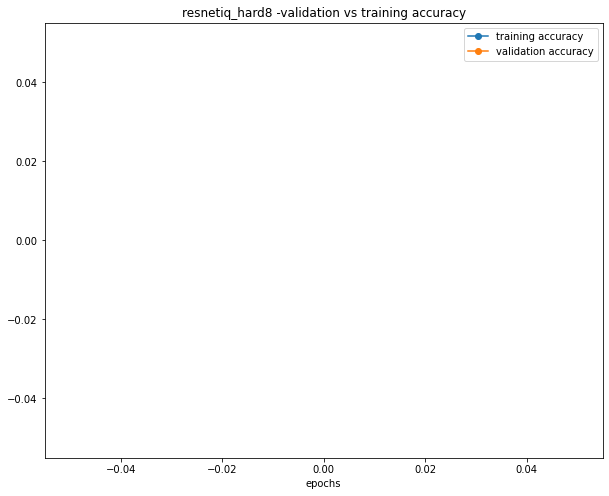

None

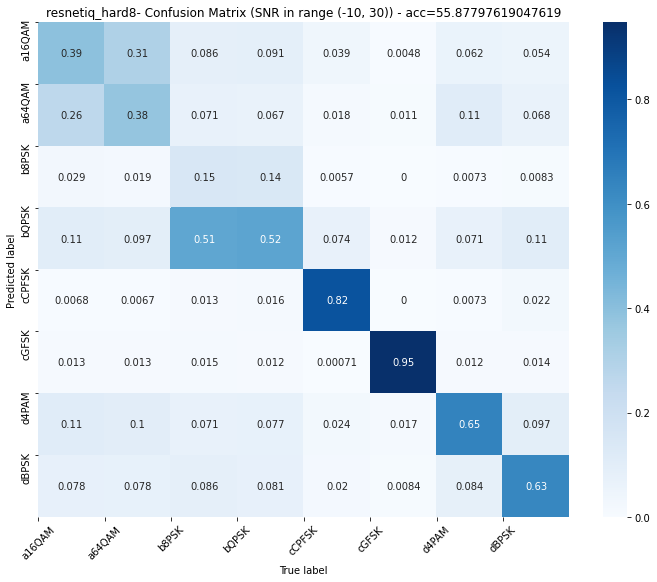

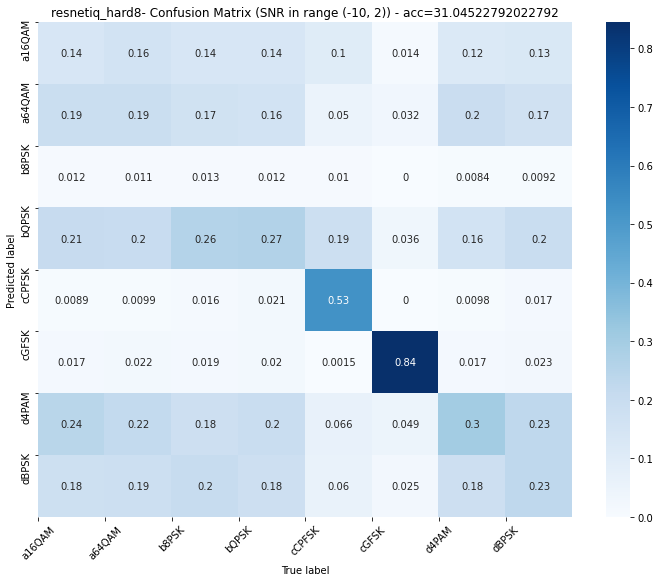

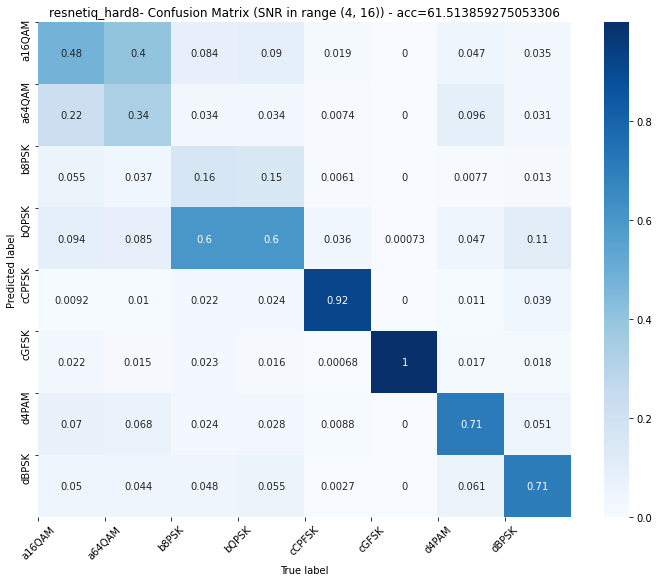

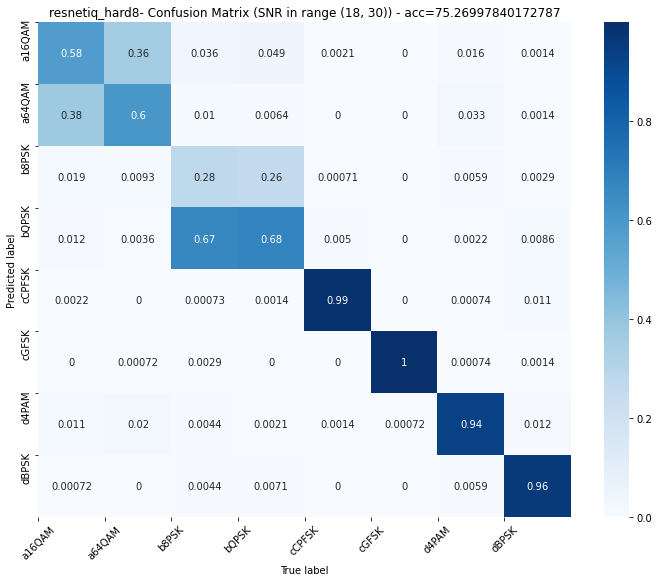

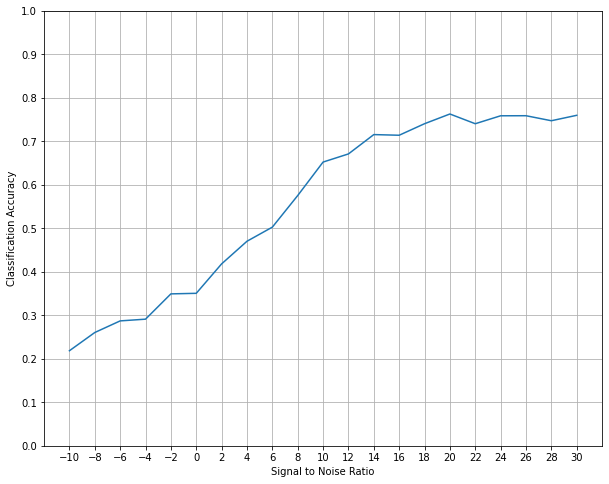

In [ ]:
resnet_iq_model = build_ResNet((X_train.shape[2],X_train.shape[1]), NUM_CLASSES)
resnet_iq_model.load_weights(root_path + 'resnetiq_hard8-weights-22.hdf5')
resnet_iq_model_evaluater = ModelEvaluater(resnet_iq_model, X_train, y_train, X_val, y_val, X_test, y_test, labels_test, BATCH_SIZE, 'resnetiq_hard8', channels_first=False)
#resnet_iq_model_evaluater.fit(EPOCHS, patience=PATIENCE)
resnet_iq_model_evaluater.print_summary()

At high SNRs, Resnet is quite good at telling apart BPSK, PAM4, CPFSK, GFSK, but terrible at telling the rest apart. This is similar to the trend in radioML, and actually surprisingly good considering the amount of noise.

### Train resnet-ap

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1024, 40)     120         input_1[0][0]                    
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 1024, 40)     0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
conv1d_2 (Conv1

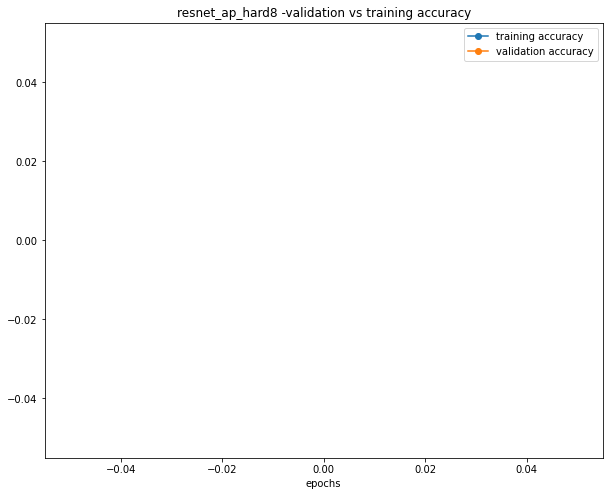

None

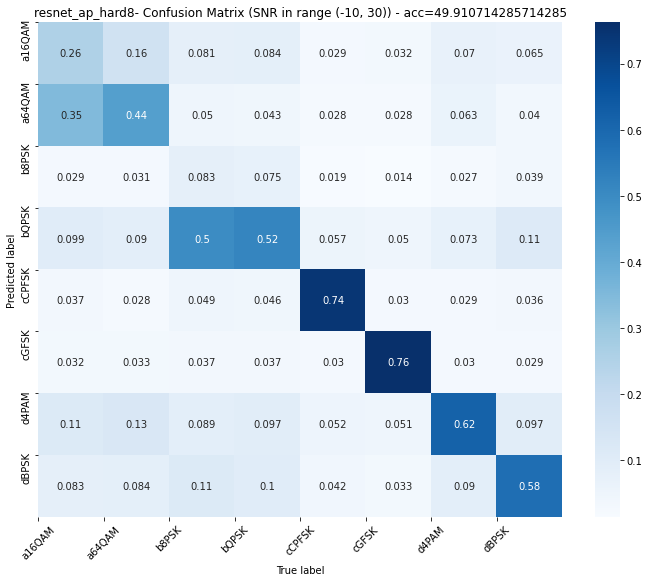

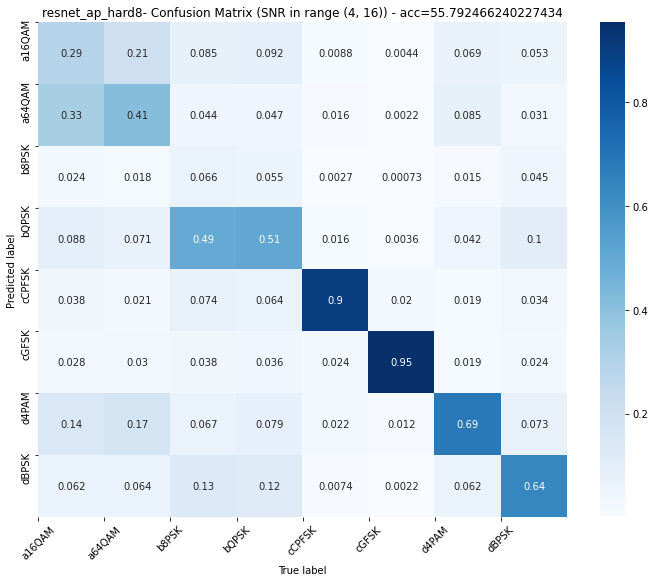

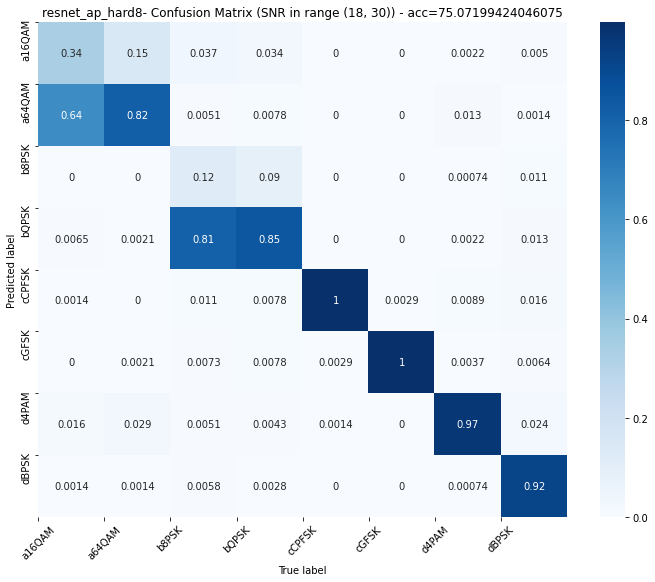

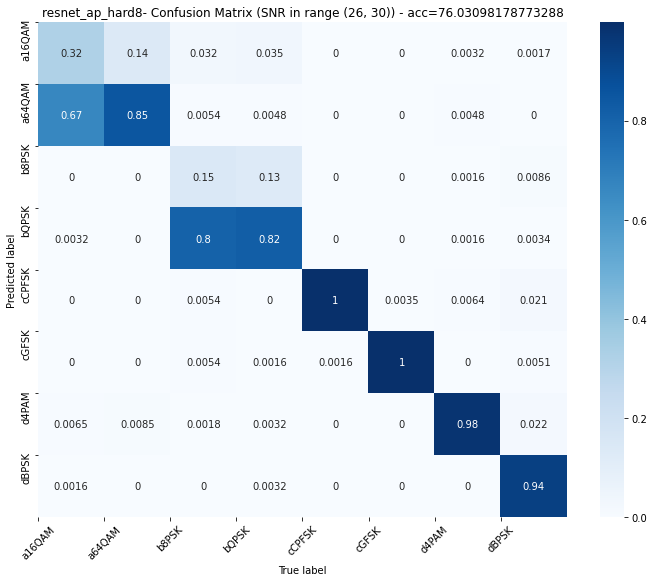

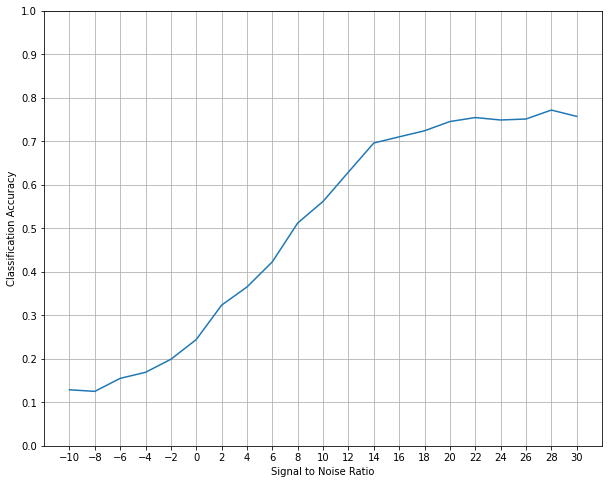

In [14]:
resnet_ap_model = build_ResNet((X_ap_test.shape[2], X_ap_test.shape[1]), NUM_CLASSES)
resnet_ap_model.load_weights(root_path + 'resnet_ap_hard8-weights-14.hdf5')
resnet_ap_model_evaluater = ModelEvaluater(resnet_ap_model, X_ap_train, y_train, X_ap_val, y_val, X_ap_test, y_test, labels_test, BATCH_SIZE, 'resnet_ap_hard8', channels_first=False)
#resnet_ap_model_evaluater.fit(EPOCHS, patience=PATIENCE)
resnet_ap_model_evaluater.print_summary()

AP results in a slight improvement in resnet performance, but nowhere as significant as in the radioML dataset, and this time resnet-ap still has trouble differentiating QAMs and also higher order PSKs.

### Train using CLDNN_AP

In [ ]:
def build_cldnn_net(X1, X2):
  dr = 0.5  # dropout rate l

  # Reshape [N,2,128] to [N,1,2,128] on input
  input_x = Input(shape=(1, X1, X2))

  # channels_first corresponds to inputs with shape (batch, channels, height, width).
  # Build our model
  input_x_padding = ZeroPadding2D((0, 2), data_format="channels_first")(input_x)

  layer1 = Conv2D(50, (1, 8), padding='valid', activation="relu", name="conv1", init='glorot_uniform', data_format="channels_first")(input_x_padding)
  layer1 = Dropout(dr)(layer1)
  layer1_padding = ZeroPadding2D((0, 2), data_format="channels_first")(layer1)

  layer2 = Conv2D(50, (1, 8), padding="valid", activation="relu", name="conv2", init='glorot_uniform', data_format="channels_first")(layer1_padding)
  layer2 = Dropout(dr)(layer2)
  layer2 = ZeroPadding2D((0, 2), data_format="channels_first")(layer2)

  layer3 = Conv2D(50, (1, 8), padding='valid', activation="relu", name="conv3", init='glorot_uniform', data_format="channels_first")(layer2)
  layer3 = Dropout(dr)(layer3)

  concat = keras.layers.concatenate([layer1, layer3])
  concat_size = list(np.shape(concat))
  input_dim = int(concat_size[-1] * concat_size[-2])
  timesteps = int(concat_size[-3])
  concat = Reshape((timesteps, input_dim))(concat)
  lstm_out = LSTM(50, input_dim=input_dim, input_length=timesteps)(concat)
  layer_dense1 = Dense(256, activation='relu', init='he_normal', name="dense1")(lstm_out)
  layer_dropout = Dropout(dr)(layer_dense1)
  layer_dense2 = Dense(NUM_CLASSES, init='he_normal', name="dense2")(layer_dropout)
  layer_softmax = Activation('softmax')(layer_dense2)

  output = Reshape([NUM_CLASSES])(layer_softmax)
  model = Model(inputs=input_x, outputs=output)

  model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
  model.summary()
  return model

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(50, (1, 8), padding="valid", activation="relu", name="conv1", data_format="channels_first", kernel_initializer="glorot_uniform")`
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(50, (1, 8), padding="valid", activation="relu", name="conv2", data_format="channels_first", kernel_initializer="glorot_uniform")`
  from ipykernel import kernelapp as app
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(50, (1, 8), padding="valid", activation="relu", name="conv3", data_format="channels_first", kernel_initializer="glorot_uniform")`
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: UserWarning: The `input_dim` and `input_length` ar

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 1, 2, 1024)   0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, 1, 2, 1028)   0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 50, 2, 1021)  450         zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
dropout_7 (Dropout)             (None, 50, 2, 1021)  0           conv1[0][0]                      
____________________________________________________________________________________________

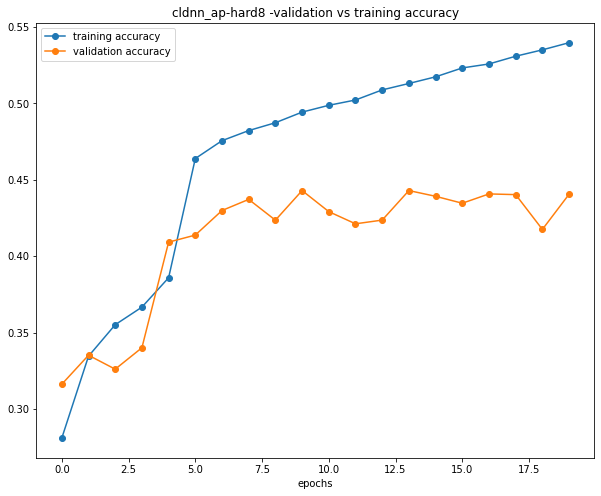

None

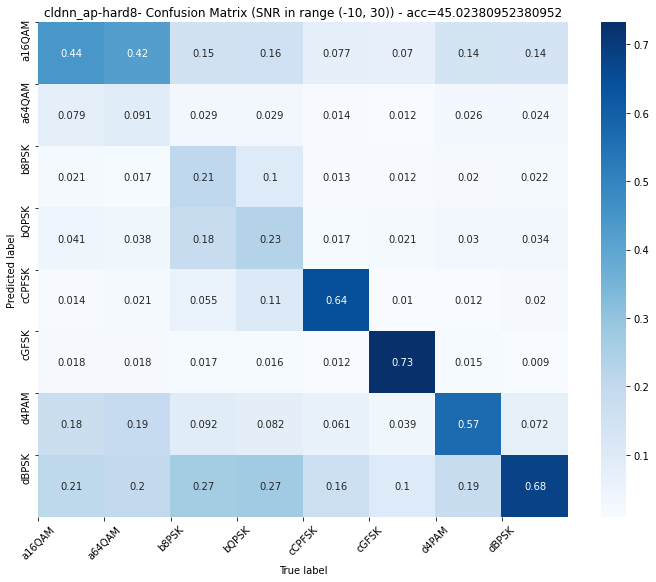

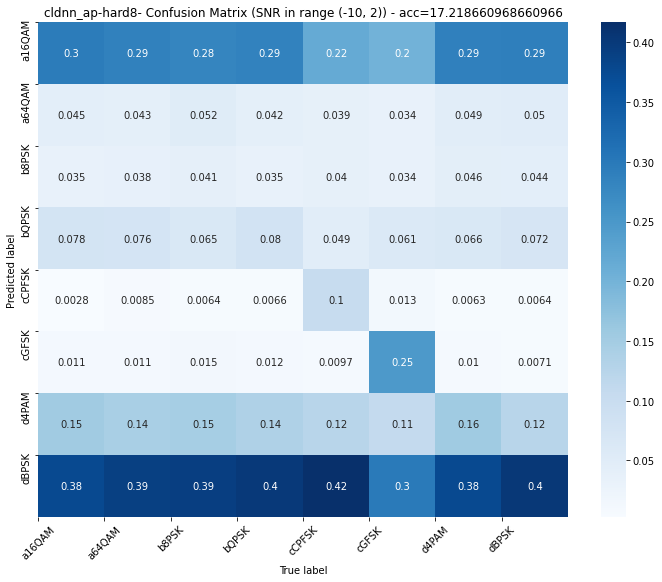

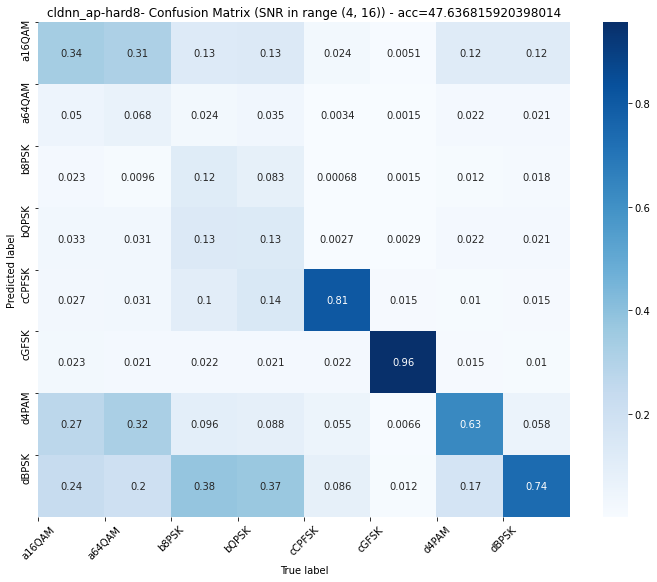

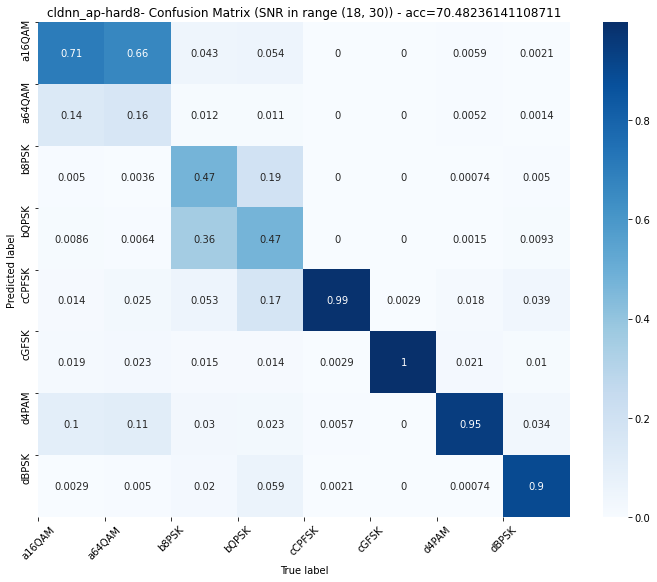

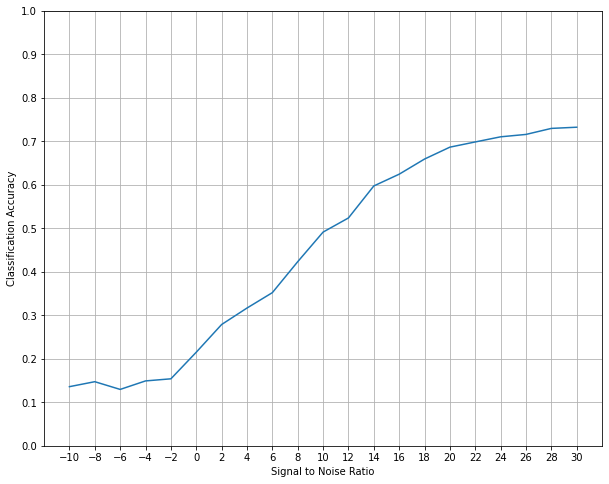

In [ ]:
#Need to reshape I/Q data from 3D into 4D to input into model
X_ap_train2 = X_ap_train.reshape(X_ap_train.shape[0], 1, X_ap_train.shape[1], X_ap_train.shape[2])
X_ap_val2 = X_ap_val.reshape(X_ap_val.shape[0], 1, X_ap_val.shape[1], X_ap_val.shape[2])
X_ap_test2 = X_ap_test.reshape(X_ap_test.shape[0], 1, X_ap_test.shape[1], X_ap_test.shape[2])

cldnn_ap_model = build_cldnn_net(X_ap_test.shape[1], X_ap_test.shape[2])
cldnn_ap_model_evaluater = ModelEvaluater(cldnn_ap_model, X_ap_train2, y_train, X_ap_val2, y_val, X_ap_test2, y_test, labels_test, BATCH_SIZE, 'cldnn_ap-hard8' )
cldnn_ap_model_evaluater.fit(EPOCHS, patience=PATIENCE)
cldnn_ap_model_evaluater.print_summary()

Seems like cldnn does not perform as well as resnet for this dataset.

## Training using constellation model on grayscale image

Classifying by coloured constellation images have shown great accuracy in: [Data-Driven Deep Learning for Automatic Modulation Recognition in Cognitive Radios](https://ieeexplore.ieee.org/document/8645696). From human eye, we are able to recognise the modulation from the I/Q constellation at high SNR, and presumably a CNN would be able to do the same as it has been proven to work well on image classification. I have shown in previous notebooks that the coloured constellation model can achieve close to 100% accuracy at high SNRs on the radioML dataset. 

Here, I assess how the constellation model performs on the hard dataset. 

### Model architecture of constellation classifier

[Data-Driven Deep Learning for Automatic Modulation Recognition in Cognitive Radios](https://ieeexplore.ieee.org/document/8645696) This model consists of five convolutional layers and three dense layers, similar to a standard AlexNet. 

In [15]:
def build_constellation_net(X1, X2, X3):
  model = Sequential()
  model.add(Reshape((X1, X2, X3), input_shape=(X1, X2, X3)))
  model.add(Conv2D(128, (5,5), padding='valid', data_format="channels_last"))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(AveragePooling2D(pool_size=(2, 2), strides=2))
  model.add(Conv2D(64, (3,3), padding='same'))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(Conv2D(64, (3,3), padding='same'))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(AveragePooling2D(pool_size=(2, 2), strides=2))
  model.add(Conv2D(32, (3,3), padding='same'))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))  
  model.add(Conv2D(32, (3,3), padding='same'))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(AveragePooling2D(pool_size=(2, 2), strides=2))
  model.add(Flatten())
  model.add(Dense(1024))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(Dropout(0.5))
  model.add(Dense(512))
  model.add(PReLU(alpha_initializer=Constant(value=0.25)))
  model.add(Dropout(0.5))
  model.add(Dense(NUM_CLASSES, activation='softmax'))
  model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy']) #smaller loss better for images
  model.summary()
  return model

### Quick visualisation of 64x64x1 constellation data


In [ ]:
data = joblib.load(root_path + 'data/matlab_dict_hard.hdf5')

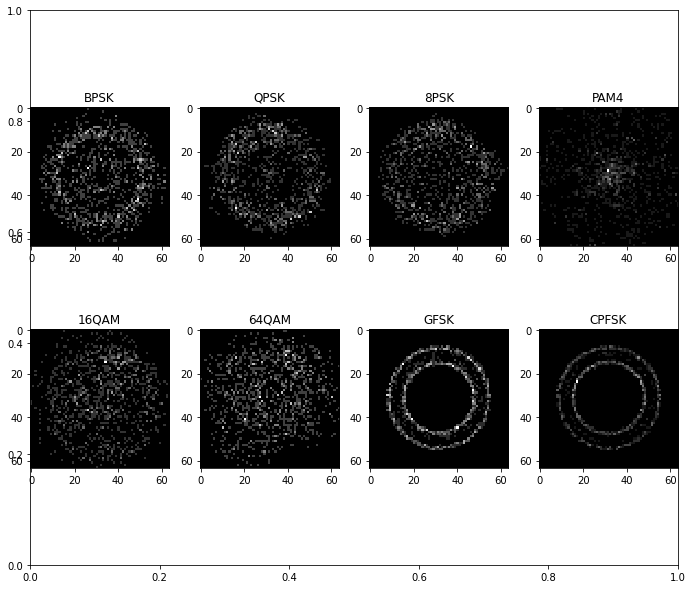

In [ ]:
_snr = 30
modtypes = ['BPSK', 'QPSK', '8PSK', 'PAM4', '16QAM', '64QAM', 'GFSK', 'CPFSK']
samp = 10

fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(2,4,i+1)
    counts, xedges, yedges = np.histogram2d(data[(mod, _snr)][samp][0], data[(mod, _snr)][samp][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
    ax.imshow(counts)
    ax.set_title(mod)
    plt.tight_layout()
plt.show()

Very very noisy constellations compared to radioML. A lot of the modulation patterns are unrecognisable even at the highest SNR. This is because local oscillator shift and Doppler rotates phase and distort the modulations greatly, and this is supposed to simulate realistic situations.

### Train constellation model on 48x48x1 images of SNR > 4dB for 8 classes
Due to memory issues I restricted the data to only SNR>4dB.

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 48, 48, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 128)       3328      
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 44, 44, 128)       247808    
_________________________________________________________________
average_pooling2d_1 (Average (None, 22, 22, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 64)        73792     
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, 22, 22, 64)        30976     
______________________________________

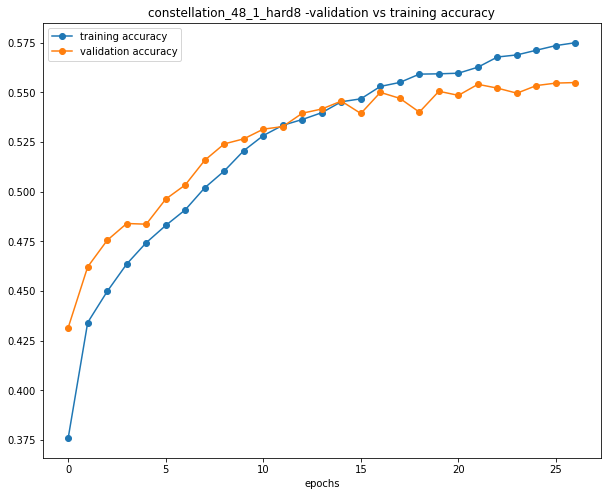

None

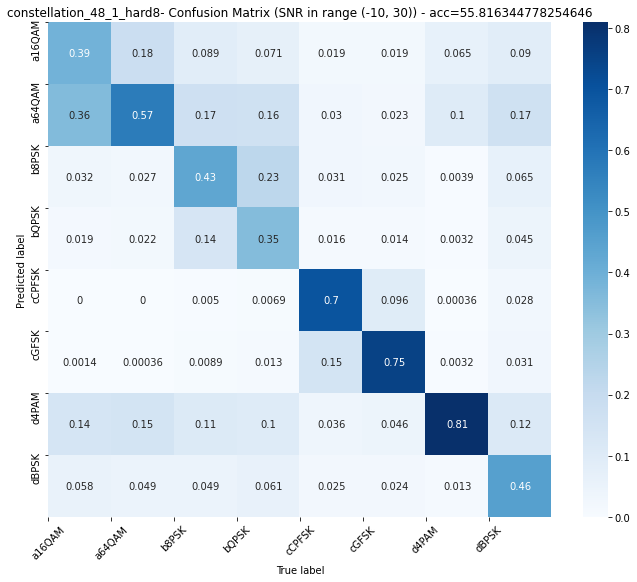

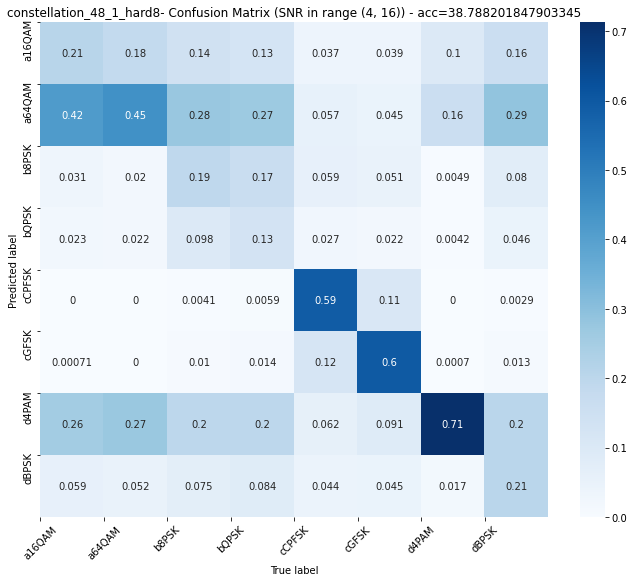

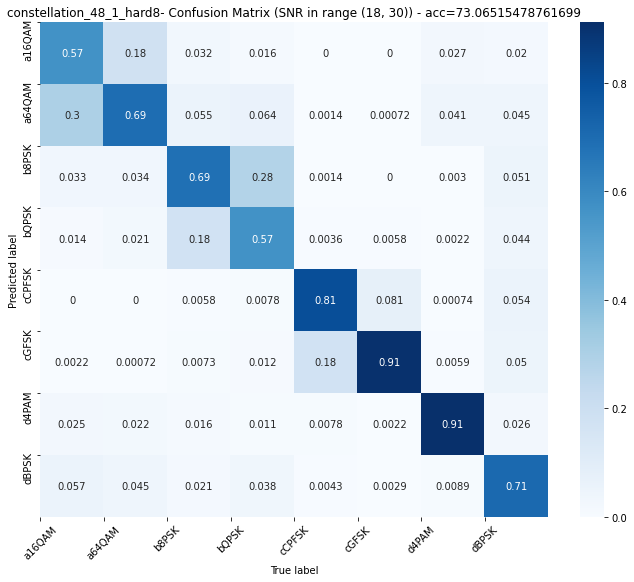

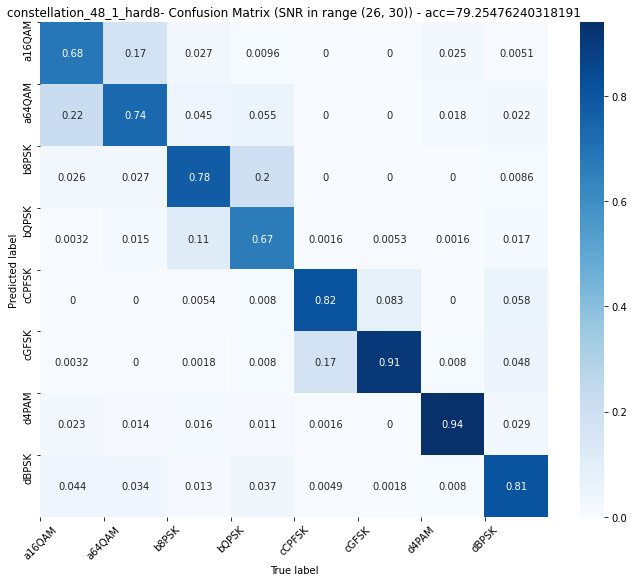

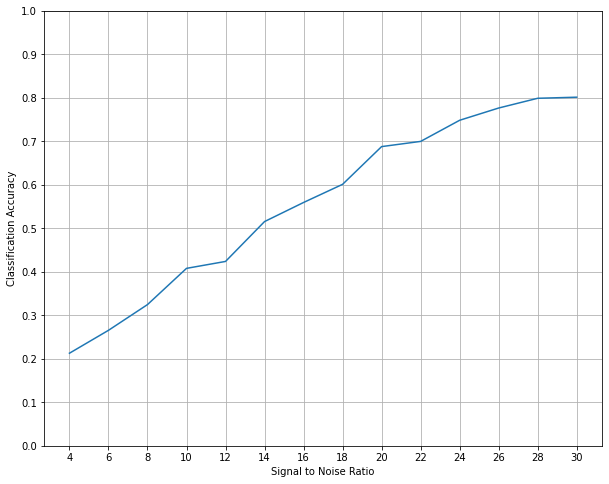

In [18]:
BATCH_SIZE=64 #Cannot be too big otherwise will exceed memory
NUM_CLASSES = 8
constellation_model = build_constellation_net(X_img_train.shape[1], X_img_train.shape[2], X_img_train.shape[3])
constellation_model_evaluater = ModelEvaluater(constellation_model, X_img_train, y_img_train, X_img_val, y_img_val, X_img_test, y_img_test, labels_img_test, BATCH_SIZE, 'constellation_48_1_hard8' )
constellation_model_evaluater.fit(EPOCHS,patience=4)
constellation_model_evaluater.print_summary()

Constellation model gives slightly better performance than resnet-iq at high SNRs only. Similar trend to radioML, we find the constellation model slightly better at differentiating QAMs and PSKs but worse at differentiating the easy classes. 

This suggests that the constellation image and IQ time-series are complementary and would work well together.

### Train constellation model on 64x64x1 images of SNR > 4dB and only on QAM classes
Here I observe if a higher resolution in constellation image would give a much better performance. But I only do it on four classes because of memory constraints.


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_2 (Reshape)          (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 60, 128)       3328      
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 60, 60, 128)       460800    
_________________________________________________________________
average_pooling2d_1 (Average (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 30, 30, 64)        73792     
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, 30, 30, 64)        57600     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 30, 30, 64)      

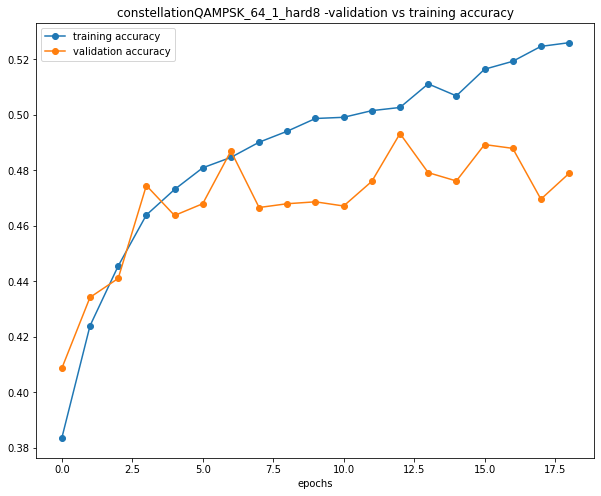

None

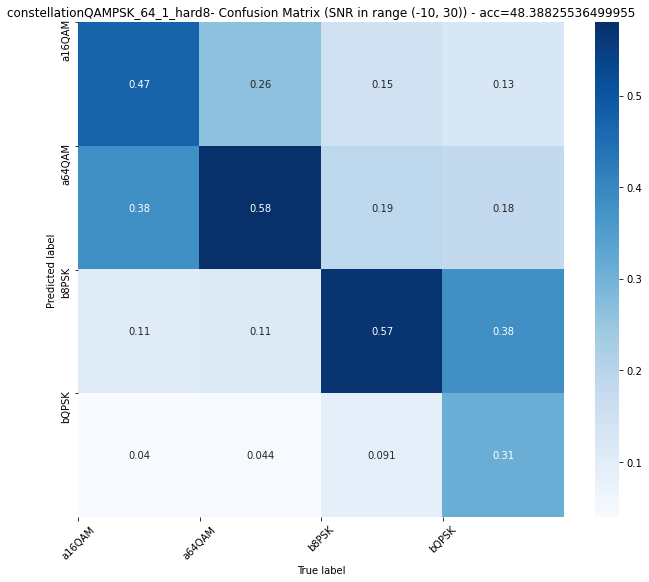

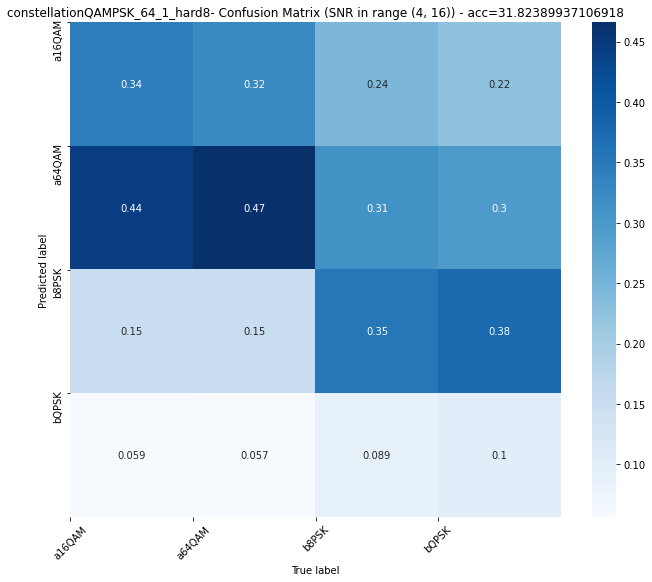

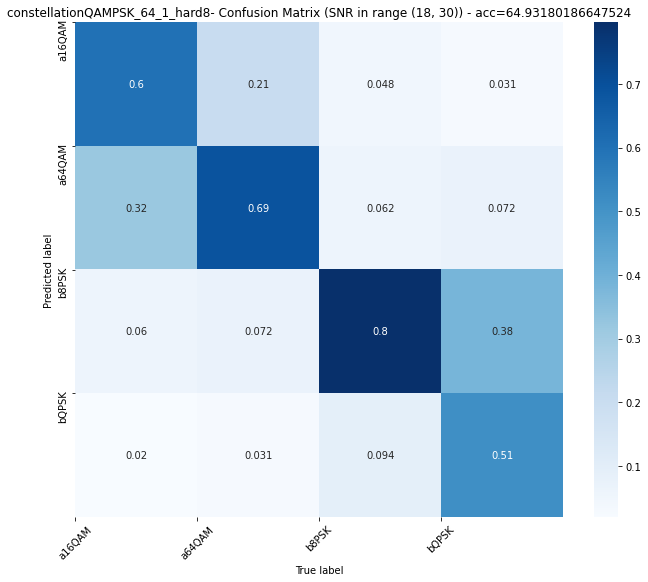

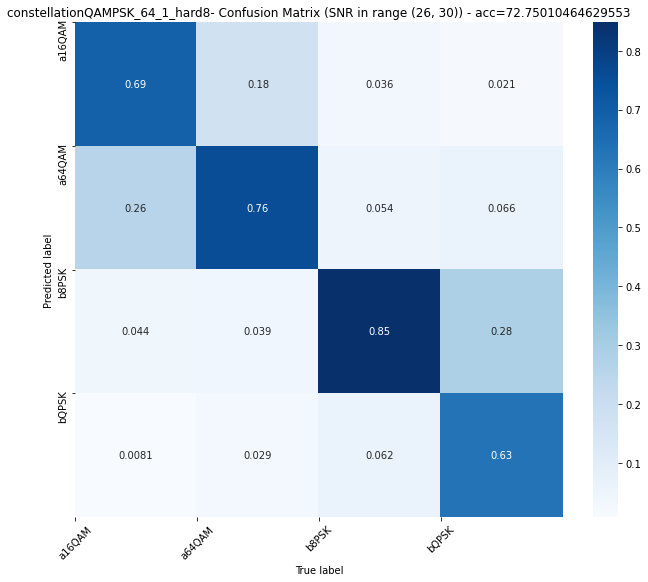

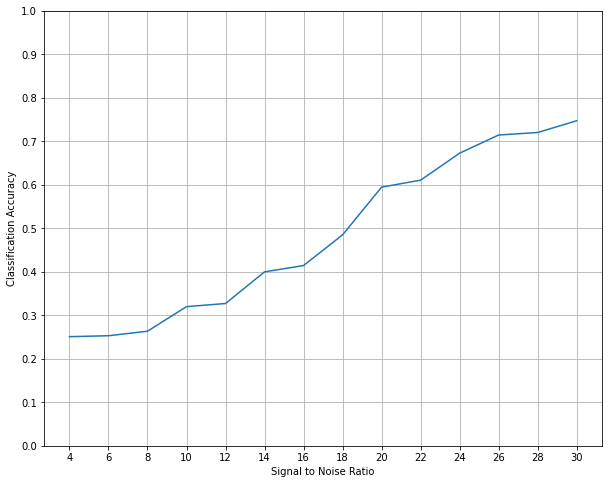

In [17]:
BATCH_SIZE=64 #Cannot be too big otherwise will exceed memory
NUM_CLASSES = 4
constellation_model = build_constellation_net(X_img_train.shape[1], X_img_train.shape[2], X_img_train.shape[3])
constellation_model_evaluater = ModelEvaluater(constellation_model, X_img_train, y_img_train, X_img_val, y_img_val, X_img_test, y_img_test, labels_img_test, BATCH_SIZE, 'constellationQAMPSK_64_1_hard8' )
constellation_model_evaluater.fit(EPOCHS,patience=4)
constellation_model_evaluater.print_summary()

Resolution 64 is only slightly better than resolution 48.

Despite having more data points in each constellation, the constellation model still doesn't achieve perfect accuracy, but its ability in differentiating QAMs and PSKs at high SNR is still much better than that of the resnet-iq model, so this suggests that the two-model cascade is probably quite applicable here.

### Train constellation model on 64x64x3 colour images of SNR > 4dB and only on QAM classes
Here I observe if a higher resolution in constellation image would give a much better performance. But I only do it on four classes because of memory constraints.

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 64, 64, 3)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 60, 60, 128)       9728      
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 60, 60, 128)       460800    
_________________________________________________________________
average_pooling2d_1 (Average (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 64)        73792     
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, 30, 30, 64)        57600     
______________________________________

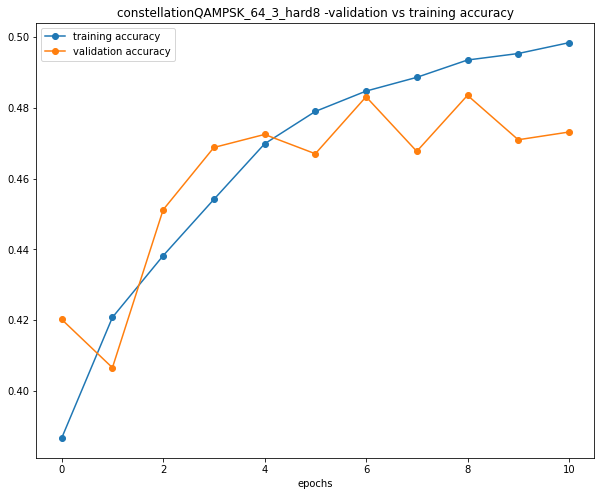

None

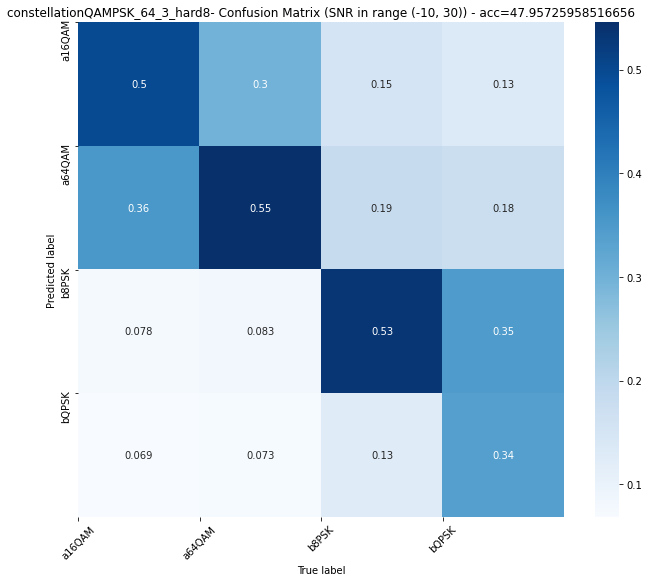

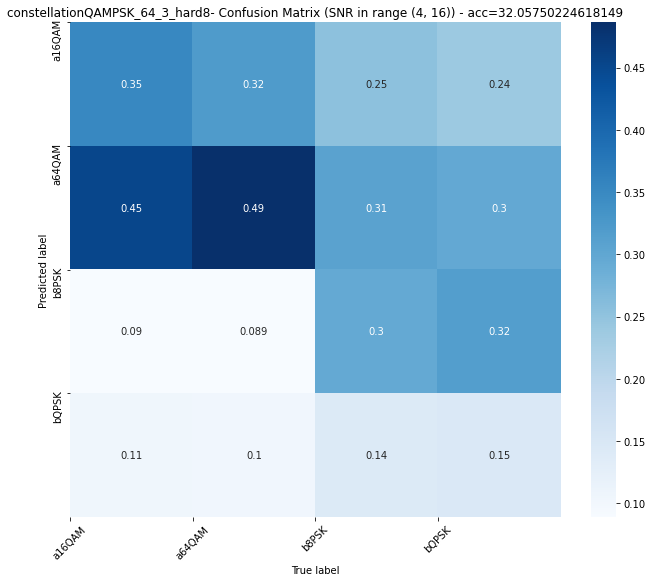

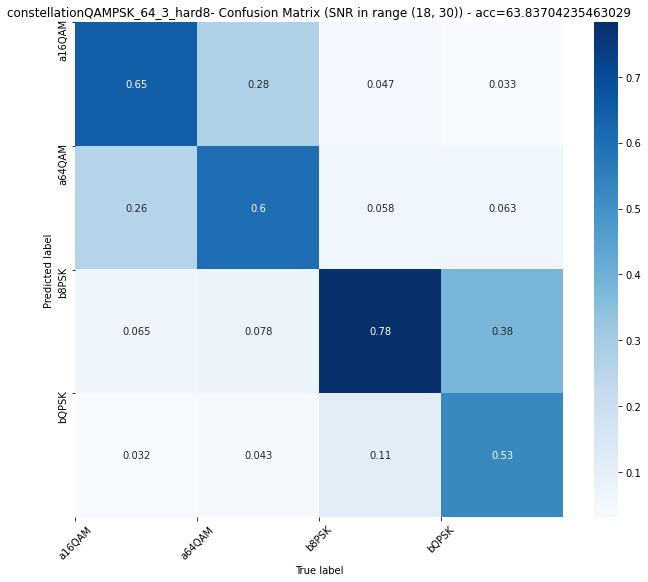

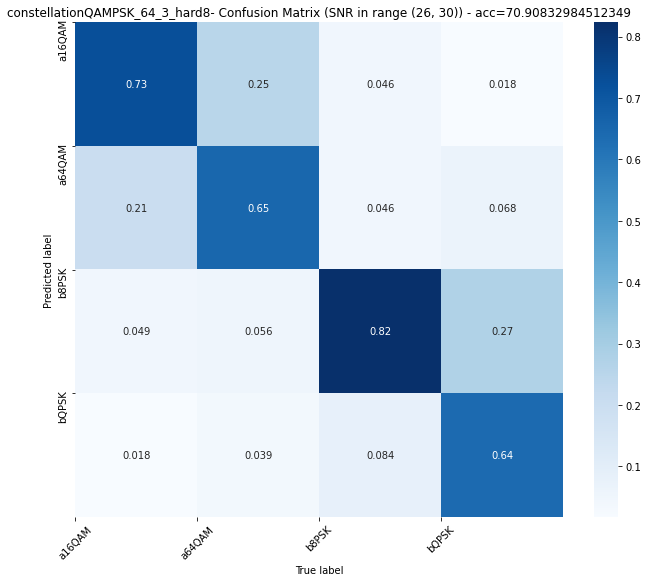

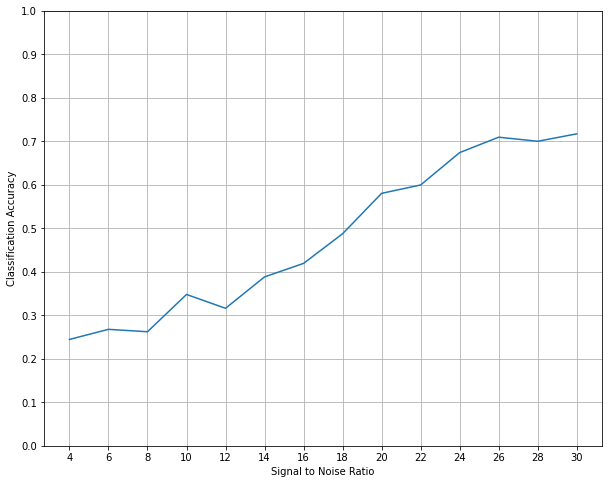

In [16]:
BATCH_SIZE=64 #Cannot be too big otherwise will exceed memory
NUM_CLASSES = 4
constellation_model = build_constellation_net(X_img_train.shape[1], X_img_train.shape[2], X_img_train.shape[3])
constellation_model_evaluater = ModelEvaluater(constellation_model, X_img_train, y_img_train, X_img_val, y_img_val, X_img_test, y_img_test, labels_img_test, BATCH_SIZE, 'constellationQAMPSK_64_3_hard8' )
constellation_model_evaluater.fit(EPOCHS,patience=4)
constellation_model_evaluater.print_summary()

Again, no significant improvement with colouration.

## Comparing resnet-iq and constellation model performance

In [23]:
#build and get accspersnr for each model

constel_model = build_constellation_net(X_img_test.shape[1], X_img_test.shape[2], X_img_test.shape[3])
constel_model.load_weights(root_path + 'constellation_48_1_hard8-weights-23.hdf5')
constel_model_evaluater = ModelEvaluater(constel_model, X_img_test, y_img_test, X_img_test, y_img_test, X_img_test, y_img_test, labels_img_test, 64, 'constel48')
constel_accpersnr = constel_model_evaluater.accpersnr_model()

resnet_iq_model = build_ResNet((X_test.shape[2],X_test.shape[1]), NUM_CLASSES)
resnet_iq_model.load_weights(root_path + 'resnetiq_hard8-weights-22.hdf5')
resnet_iq_model_evaluater = ModelEvaluater(resnet_iq_model, X_test, y_test, X_test, y_test, X_test, y_test, labels_test, 1024, 'resiq', channels_first=False)
resnet_iq_model_accpersnr = resnet_iq_model_evaluater.accpersnr_model()

resnet_ap_model = build_ResNet((X_ap_test.shape[2], X_ap_test.shape[1]), NUM_CLASSES)
resnet_ap_model.load_weights(root_path + 'resnet_ap_hard8-weights-14.hdf5')
resnet_ap_model_evaluater = ModelEvaluater(resnet_ap_model, X_ap_test, y_test,X_ap_test, y_test, X_ap_test, y_test, labels_test, 1024, 'resap', channels_first=False)
resnet_ap_accpersnr = resnet_ap_model_evaluater.accpersnr_model()



Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1 (Reshape)          (None, 48, 48, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 128)       3328      
_________________________________________________________________
p_re_lu_1 (PReLU)            (None, 44, 44, 128)       247808    
_________________________________________________________________
average_pooling2d_1 (Average (None, 22, 22, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 64)        73792     
_________________________________________________________________
p_re_lu_2 (PReLU)            (None, 22, 22, 64)        30976     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 22, 22, 64)      

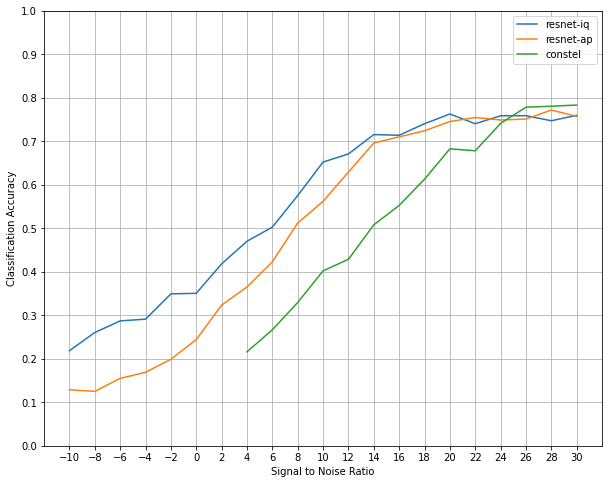

In [25]:
# plot acc-vs-snr graphs for different models
resnetiq,  = plt.plot(list(resnet_iq_model_accpersnr.keys()),list(resnet_iq_model_accpersnr.values()), label='resnet-iq')
resnetap,  = plt.plot(list(resnet_ap_accpersnr.keys()),list(resnet_ap_accpersnr.values()), label='resnet-ap')
constel,  = plt.plot(list(constel_accpersnr.keys()),list(constel_accpersnr.values()), label='constel')

plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Classification Accuracy")
plt.xticks(list(resnet_iq_model_accpersnr.keys()))
plt.legend(handles = [resnetiq, resnetap, constel])
plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.grid(True)
plt.show()

# COMBINED MODEL ON HARD, MEDIUM, EASY DATASETS
Note that this section uses only a smaller portion of the dataset (0.25) due to time and memory constraints, so training and evaluation might not be extremely fair and accurate. The medium and easy dataset are aso not analysed to as much detail as the hard dataset.

## Combine constellation image and I/Q time series into one feature

The idea is we are trying to get the model to pick the best weighted average of both spatial (i, q coordinates) and temporal (iq time series) features, which is achieved in the last few dense layers. This is especially useful when we see that both constellation image model and time-series model are complementary in their strengths and weaknesses: constellation image only works well at high SNR and has very low tolerance to noise, while resnet is more noise-tolerant. Resnet never confuses between FSKs but confuse QAMs a lot, while constellation-net confuses between FSKs significantly.

### Model architecture combining resnet and constellation model into one

The new model takes in [img time] as the input. The img input goes through the standard constellation model, and simultaneously the time input goes through the resnet model. The dense layer output from each model is then concatenated and flattened, and then connected to a few more dense layers to get the final classification probabilities.


In [ ]:
# 1d conv resnet
def residual_stack(x, f):
    # 1x1 conv linear
    x = Conv1D(f, 1, strides=1, padding='same', data_format='channels_last')(x)
    x = Activation('linear')(x)
    
    # residual unit 1    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # residual unit 2    
    x_shortcut = x
    x = Conv1D(f, 3, strides=1, padding="same", data_format='channels_last')(x)
    x = Activation('relu')(x)
    x = Conv1D(f, 3, strides = 1, padding = "same", data_format='channels_last')(x)
    x = Activation('linear')(x)
    # add skip connection
    if x.shape[1:] == x_shortcut.shape[1:]:
      x = Add()([x, x_shortcut])
    else:
      raise Exception('Skip Connection Failure!')
      
    # max pooling layer
    x = MaxPooling1D(pool_size=2, strides=None, padding='valid', data_format='channels_last')(x)
    return x
    

def build_imgtime_net(imgside, timesteps, timefeats):
  img_in = Input(shape=(imgside, imgside, 1))
  time_in = Input(shape=(timesteps, timefeats))

  #top layers of constellation model
  imgconv = Conv2D(128, (5,5), padding='valid', activation='relu', data_format="channels_last")(img_in)
  imgconv = AveragePooling2D(pool_size=(2, 2), strides=2)(imgconv)
  imgconv = Conv2D(64, (3,3), padding='same', activation='relu')(imgconv)
  imgconv = Conv2D(64, (3,3), padding='same', activation='relu')(imgconv)
  imgconv = AveragePooling2D(pool_size=(2, 2), strides=2)(imgconv)
  imgconv = Conv2D(32, (3,3), padding='same', activation='relu')(imgconv)
  imgconv = Conv2D(32, (3,3), padding='same', activation='relu')(imgconv)
  imgconv = AveragePooling2D(pool_size=(2, 2), strides=2)(imgconv)
  imgconv = Flatten()(imgconv)
  imgconv = Dense(1024, activation='relu')(imgconv)
  imgconv = Dropout(0.5)(imgconv)
  imgconv = Dense(128, activation='relu')(imgconv)
  imgconv = Dropout(0.5)(imgconv)

  #top layers of resnet model
  # residual stack
  num_filters = 40
  time = residual_stack(time_in, num_filters)
  time = residual_stack(time, num_filters)
  time = residual_stack(time, num_filters)
  time = residual_stack(time, num_filters)
  time = residual_stack(time, num_filters)
  # output layer
  time = Flatten()(time)
  time = Dense(128, activation="selu", kernel_initializer="he_normal")(time)
  time = Dropout(.5)(time)
  time = Dense(128, activation="selu", kernel_initializer="he_normal")(time)
  time = Dropout(0.5)(time)

  #concat spatial features extracted by constellation model and temporal features extracted by resnet model
  concat = keras.layers.concatenate([imgconv, time])
  concat = Reshape((2, 128))(concat)
  concat = Flatten()(concat)
  concat = Dense(64, activation='relu')(concat)
  concat = Dense(NUM_CLASSES, init='he_normal', activation='softmax')(concat)

  model = Model(inputs=[img_in, time_in], outputs=concat)
  model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.0001), metrics=['accuracy'])
  model.summary()
  return model

### Loading both i/q and constellation data for combination

In [ ]:
data = joblib.load(root_path + 'data/matlab_dict_hard.hdf5')

In [ ]:
X = []
X_imgs = []
labels = [] # label each example by a pair (modulation type, snr)
total_examples = 0
nbins =64
for mod_type, snr in data.keys():
  #if mod_type not in [b'WBFM', b'AM-DSB', b'AM-SSB']:
  #if mod_type in ['QPSK', '8PSK', '16QAM', '64QAM']:
    current_matrix = data[(mod_type, snr)]
    total_examples += current_matrix.shape[0]
    for i in range(current_matrix.shape[0]):
      if (i<250):
        X.append(current_matrix[i])
        counts, xedges, yedges = np.histogram2d(current_matrix[i][0], current_matrix[i][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
        X_imgs.append(counts)
        labels.append((mod_type, snr)) # mod_type is of type byte
    
X = np.array(X).reshape(-1, 1024, 2)
X_imgs = np.array(X_imgs).reshape(-1, nbins,nbins, 1)
labels = np.array(labels) 
print('loaded %d signal vectors into X %s and their corresponding %d labels into labels %s' %(total_examples, X.shape, labels.shape[0], labels.shape))
print(X_imgs.shape)

loaded 168000 signal vectors into X (42000, 1024, 2) and their corresponding 42000 labels into labels (42000, 2)
(42000, 64, 64, 1)


In [ ]:
TEST_PERCENTAGE = 0.2
X_train, X_test, labels_train, labels_test, y_train, y_test = split_data(X,labels, TEST_PERCENTAGE)
X_img_train, X_img_test, labels_img_train, labels_img_test, y_img_train, y_img_test = split_data(X_imgs,labels, TEST_PERCENTAGE)

print('shapes after train test split:\n X_train %s, \n X_test %s, \n labels_train %s, \n labels_test %s, \n y_train %s, \n y_test %s' %(X_train.shape, X_test.shape, labels_train.shape, labels_test.shape, y_train.shape, y_test.shape))
print(np.count_nonzero(y_train == y_img_train))

shapes after train test split:
 X_train (33600, 1024, 2), 
 X_test (8400, 1024, 2), 
 labels_train (33600, 2), 
 labels_test (8400, 2), 
 y_train (33600,), 
 y_test (8400,)
33600


In [ ]:
print(np.unique(y_test))

['16QAM' '64QAM' '8PSK' 'BPSK' 'CPFSK' 'GFSK' 'PAM4' 'QPSK']


### Train combined img-time model

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:72: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1024, 40)     120         input_2[0][0]                    
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 1024, 40)     0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 1024, 40)     4840        activation_1[0][0]               
____________________________________________________________________________________________

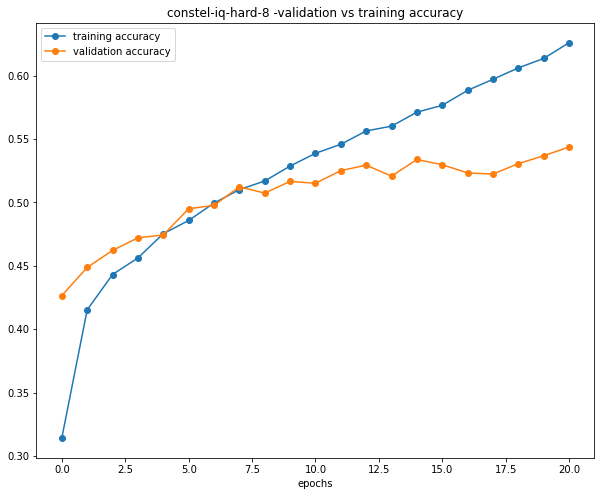

None

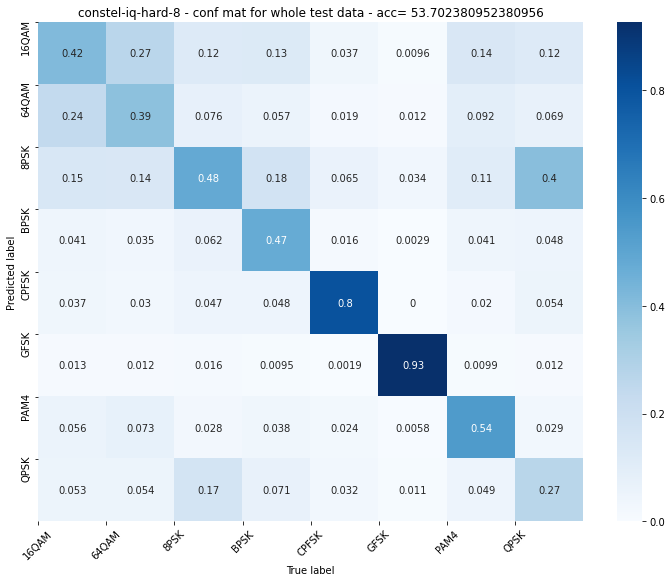

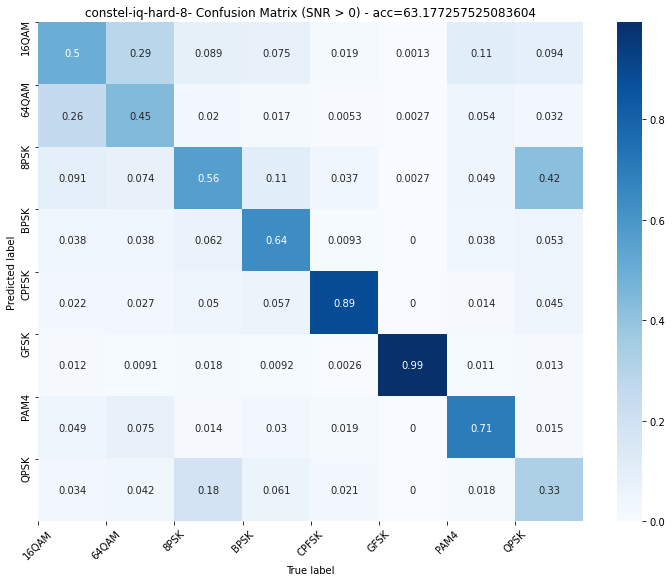

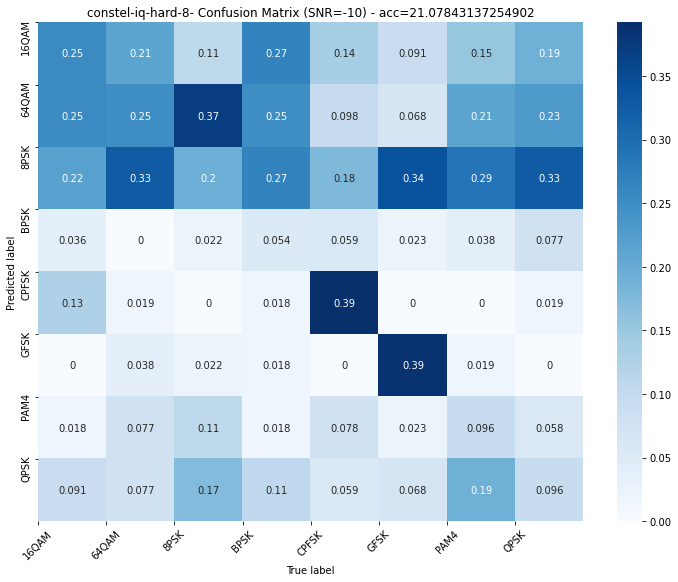

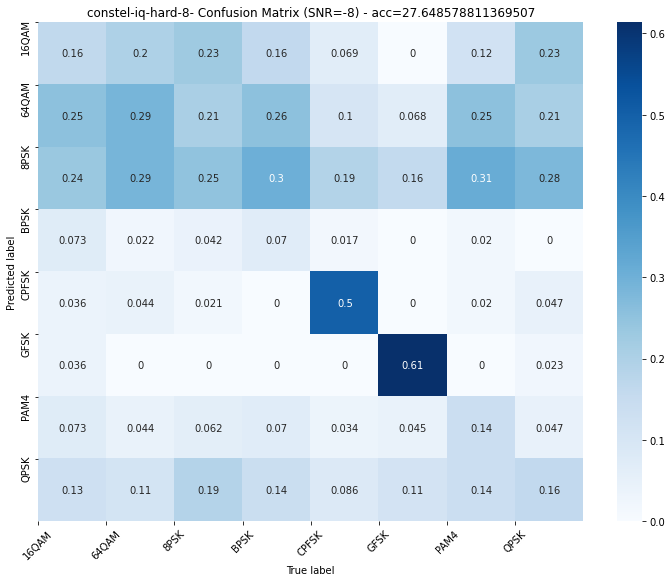

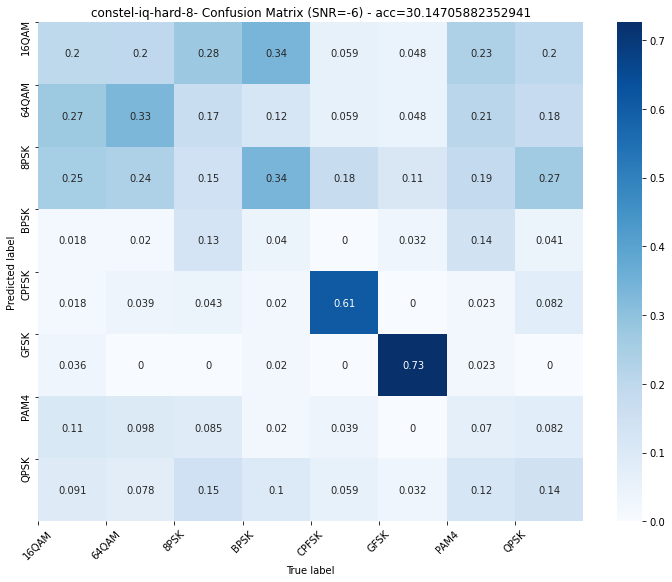

...

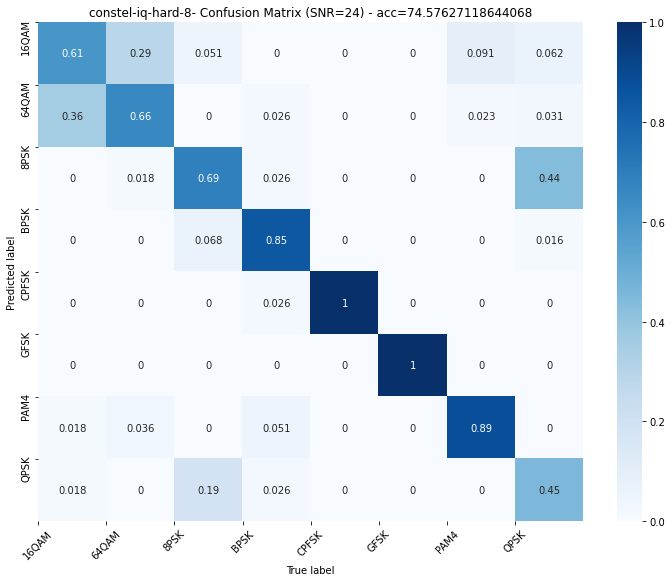

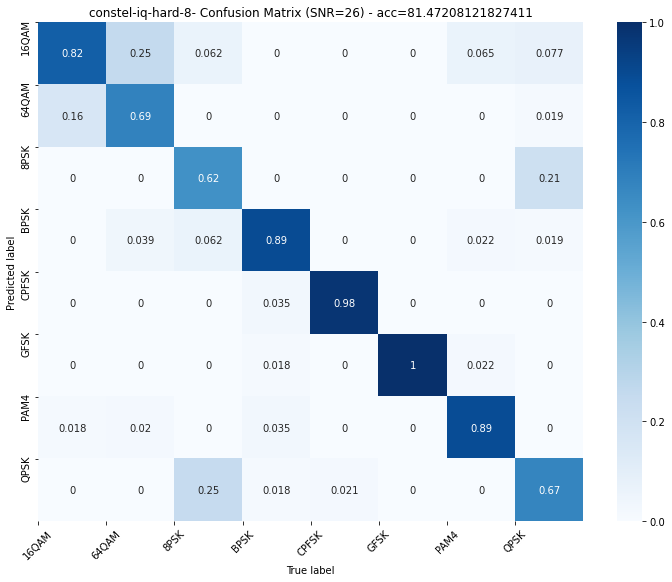

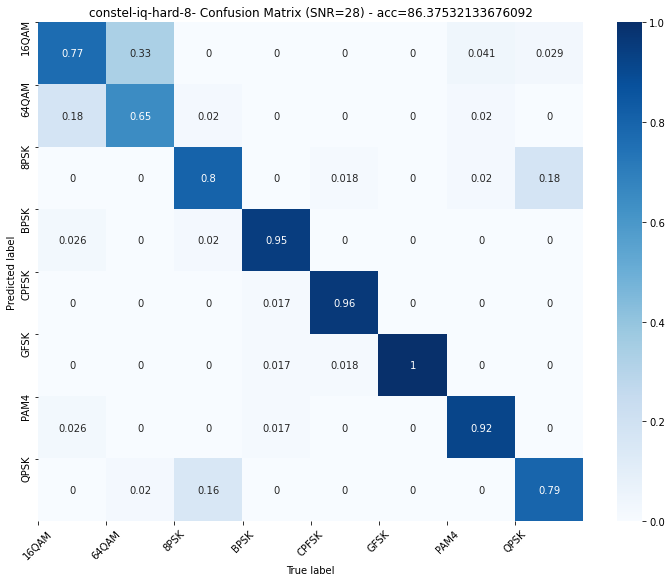

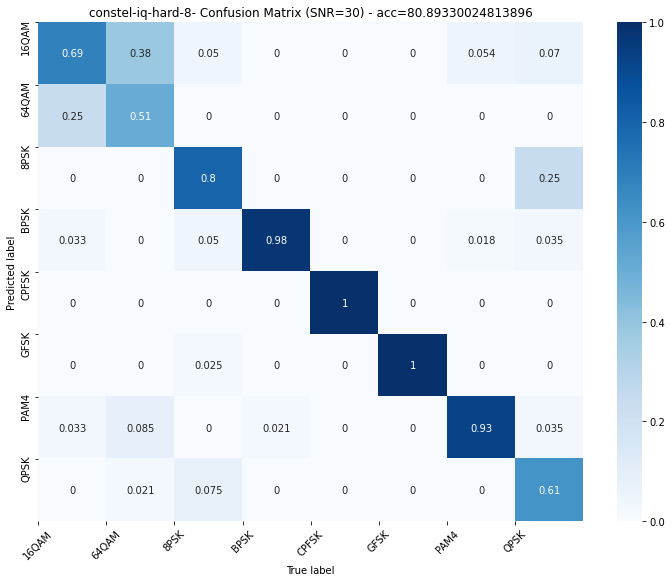

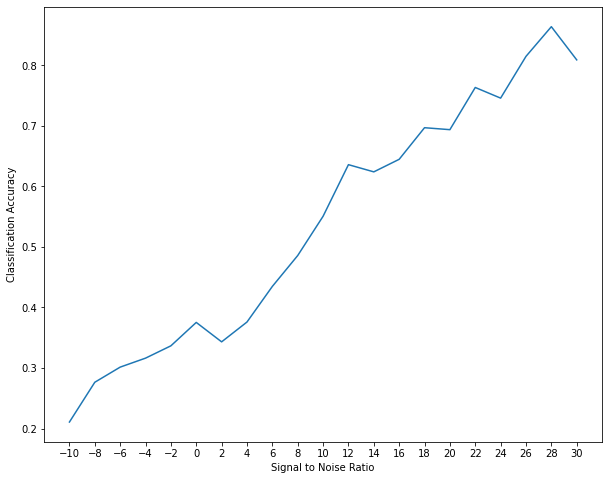

In [ ]:
NUM_CLASSES = 8
BATCH_SIZE=32 #Cannot be too big otherwise will exceed memory
imgtime_model = build_imgtime_net(X_img_train.shape[-2], X_train.shape[-2], X_train.shape[-1])
imgtime_model_evaluater = ModelEvaluater(imgtime_model, [X_img_train, X_train], y_train, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 10, 'constel-iq-hard-8', feature_type=2)
imgtime_model_evaluater.fit(EPOCHS,patience=6)
imgtime_model_evaluater.print_summary()

I think this hybrid model does combine the advantages of both time and constellation image models. The 4 classes that were well idenitfied by resnet (BPSK, GFSK, CPFSK, PAM4) were also well-identified here, and less error were made between QAMs and PSKs.
The high SNR accuracy increased by 5% resnet's high SNR accuracy. But QAMs are still not well identified.

Anyway this shows there is some merit in combining both features, probably other methods would have to be exploited to distinguish between QAMs.

### Show that combined time-img model works better than both resnet and constellation on time-img model

In [ ]:
#build and get accspersnr for each model
resnet_iq_model = build_ResNet((X_test.shape[1],X_test.shape[2]), NUM_CLASSES)
resnet_iq_model.load_weights(root_path + 'reshard-weights-69.hdf5')
resnet_iq_model_evaluater = ModelEvaluater(resnet_iq_model, X_test, y_test, X_test, y_test, labels_test, labels, 1024, 'reshard')
resnet_iq_model_accpersnr = resnet_iq_model_evaluater.accpersnr_model()

constel_model = build_constellation_net(X_img_test.shape[1], X_img_test.shape[2], X_img_test.shape[3])
constel_model.load_weights(root_path + 'constellation64x64_hard8-weights-12.hdf5')
constel_model_evaluater = ModelEvaluater(constel_model, X_img_test, y_img_test, X_img_test, y_img_test, labels_img_test, labels, 1024, 10, 'constel64x64')
constel_accpersnr = constel_model_evaluater.accpersnr_model()

imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
imgtime_model.load_weights(root_path + 'constel-iq-hard-8-weights-15.hdf5')
imgtime_model_evaluater = ModelEvaluater(imgtime_model, [X_img_test, X_test], y_test, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 'constel-iq-hard-8', feature_type=2)
imgtime_accpersnr = imgtime_model_evaluater.accpersnr_model()

Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_286 (Conv1D)             (None, 1024, 40)     120         input_22[0][0]                   
__________________________________________________________________________________________________
activation_286 (Activation)     (None, 1024, 40)     0           conv1d_286[0][0]                 
__________________________________________________________________________________________________
conv1d_287 (Conv1D)             (None, 1024, 40)     4840        activation_286[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_311 (Conv1D)             (None, 1024, 40)     120         input_24[0][0]                   
__________________________________________________________________________________________________
activation_311 (Activation)     (None, 1024, 40)     0           conv1d_311[0][0]                 
__________________________________________________________________________________________________
conv1d_312 (Conv1D)             (None, 1024, 40)     4840        activation_311[0][0]             
___________________________________________________________________________________________

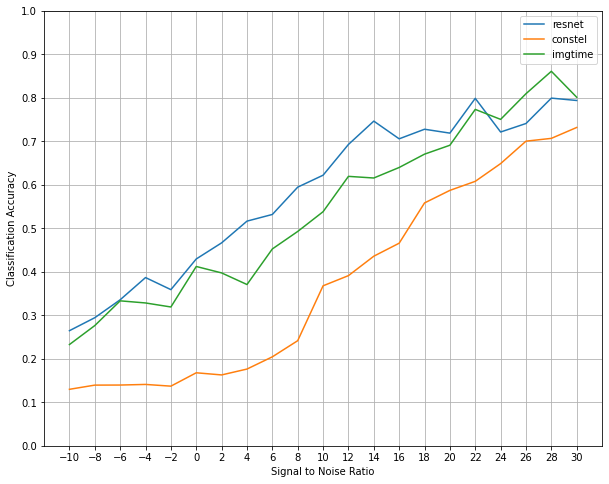

In [ ]:
# plot acc-vs-snr graphs for different models
resnet,  = plt.plot(list(resnet_iq_model_accpersnr.keys()),list(resnet_iq_model_accpersnr.values()), label='resnet')
constel,  = plt.plot(list(constel_accpersnr.keys()),list(constel_accpersnr.values()), label='constel')
imgtime,  = plt.plot(list(imgtime_accpersnr.keys()),list(imgtime_accpersnr.values()), label='imgtime')

plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Classification Accuracy")
plt.xticks(list(resnet_iq_model_accpersnr.keys()))
plt.legend(handles = [resnet, constel, imgtime])
plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.grid(True)
plt.show()

Actually combined model works slightly worse than resnet at low SNR.

Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_511 (Conv1D)             (None, 1024, 40)     120         input_37[0][0]                   
__________________________________________________________________________________________________
activation_511 (Activation)     (None, 1024, 40)     0           conv1d_511[0][0]                 
__________________________________________________________________________________________________
conv1d_512 (Conv1D)             (None, 1024, 40)     4840        activation_511[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_22"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_536 (Conv1D)             (None, 1024, 40)     120         input_39[0][0]                   
__________________________________________________________________________________________________
activation_536 (Activation)     (None, 1024, 40)     0           conv1d_536[0][0]                 
__________________________________________________________________________________________________
conv1d_537 (Conv1D)             (None, 1024, 40)     4840        activation_536[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_24"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_42 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_586 (Conv1D)             (None, 1024, 40)     120         input_42[0][0]                   
__________________________________________________________________________________________________
activation_586 (Activation)     (None, 1024, 40)     0           conv1d_586[0][0]                 
__________________________________________________________________________________________________
conv1d_587 (Conv1D)             (None, 1024, 40)     4840        activation_586[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_45 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_636 (Conv1D)             (None, 1024, 40)     120         input_45[0][0]                   
__________________________________________________________________________________________________
activation_636 (Activation)     (None, 1024, 40)     0           conv1d_636[0][0]                 
__________________________________________________________________________________________________
conv1d_637 (Conv1D)             (None, 1024, 40)     4840        activation_636[0][0]             
___________________________________________________________________________________________

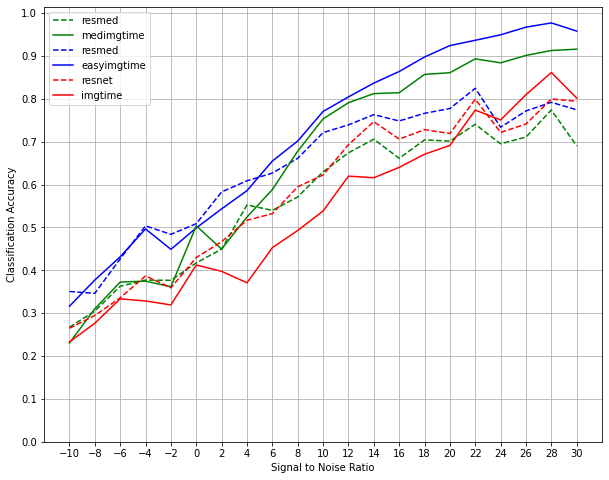

In [ ]:
#build and get accspersnr for each model
resnet_med_model = build_ResNet((X_test.shape[1],X_test.shape[2]), NUM_CLASSES)
resnet_med_model.load_weights(root_path + 'resmed-weights-66.hdf5')
resnet_med_model_evaluater = ModelEvaluater(resnet_med_model, X_med_test, y_med_test, X_med_test, y_med_test, labels_med_test, labels, 1024, 'resmed')
resnet_med_accpersnr = resnet_med_model_evaluater.accpersnr_model()

med_imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
med_imgtime_model.load_weights(root_path + 'constel-iq-med-8-weights-13.hdf5')
med_imgtime_model_evaluater = ModelEvaluater(med_imgtime_model, [X_img_test, X_test], y_test, [X_med_img_test, X_med_test], y_med_test, labels_med_test, labels_med, BATCH_SIZE, 'constel-iq-med-8', feature_type=2)
med_imgtime_accpersnr = med_imgtime_model_evaluater.accpersnr_model()


#build and get accspersnr for each model
resnet_easy_model = build_ResNet((X_test.shape[1],X_test.shape[2]), NUM_CLASSES)
resnet_easy_model.load_weights(root_path + 'reseasy-weights-55.hdf5')
resnet_easy_model_evaluater = ModelEvaluater(resnet_easy_model, X_easy_test, y_easy_test, X_easy_test, y_easy_test, labels_easy_test, labels, 1024, 'reeasy')
resnet_easy_accpersnr = resnet_easy_model_evaluater.accpersnr_model()

easy_imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
easy_imgtime_model.load_weights(root_path + 'constel-iq-easy-8-weights-8.hdf5')
easy_imgtime_model_evaluater = ModelEvaluater(easy_imgtime_model, [X_img_test, X_test], y_test, [X_easy_img_test, X_easy_test], y_easy_test, labels_easy_test, labels_easy, BATCH_SIZE, 'constel-iq-easy-8', feature_type=2)
easy_imgtime_accpersnr = easy_imgtime_model_evaluater.accpersnr_model()

#build and get accspersnr for each model
resnet_iq_model = build_ResNet((X_test.shape[1],X_test.shape[2]), NUM_CLASSES)
resnet_iq_model.load_weights(root_path + 'reshard-weights-69.hdf5')
resnet_iq_model_evaluater = ModelEvaluater(resnet_iq_model, X_test, y_test, X_test, y_test, labels_test, labels, 1024, 'reshard')
resnet_iq_model_accpersnr = resnet_iq_model_evaluater.accpersnr_model()

imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
imgtime_model.load_weights(root_path + 'constel-iq-hard-8-weights-15.hdf5')
imgtime_model_evaluater = ModelEvaluater(imgtime_model, [X_img_test, X_test], y_test, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 'constel-iq-hard-8', feature_type=2)
imgtime_accpersnr = imgtime_model_evaluater.accpersnr_model()


# plot acc-vs-snr graphs for different models
reseasy,  = plt.plot(list(resnet_easy_accpersnr.keys()),list(resnet_easy_accpersnr.values()), 'b--', label='resmed')
easy_imgtime,  = plt.plot(list(easy_imgtime_accpersnr.keys()),list(easy_imgtime_accpersnr.values()), 'b-', label='easyimgtime')

resmed,  = plt.plot(list(resnet_med_accpersnr.keys()),list(resnet_med_accpersnr.values()), 'g--', label='resmed')
med_imgtime,  = plt.plot(list(med_imgtime_accpersnr.keys()),list(med_imgtime_accpersnr.values()), 'g-', label='medimgtime')

resnet,  = plt.plot(list(resnet_iq_model_accpersnr.keys()),list(resnet_iq_model_accpersnr.values()), 'r--', label='resnet')
imgtime,  = plt.plot(list(imgtime_accpersnr.keys()),list(imgtime_accpersnr.values()), 'r-', label='imgtime')


plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Classification Accuracy")
plt.xticks(list(resnet_med_accpersnr.keys()))
plt.legend(handles = [resmed, med_imgtime, reseasy, easy_imgtime, resnet, imgtime])
plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.grid(True)
plt.show()

## Performance comparison with easier datasets

### Combined img-time model trained on hard dataset

#### Test hard-trained model on medium dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_26 (Conv1D)              (None, 1024, 40)     120         input_4[0][0]                    
__________________________________________________________________________________________________
activation_26 (Activation)      (None, 1024, 40)     0           conv1d_26[0][0]                  
__________________________________________________________________________________________________
conv1d_27 (Conv1D)              (None, 1024, 40)     4840        activation_26[0][0]              
____________________________________________________________________________________________

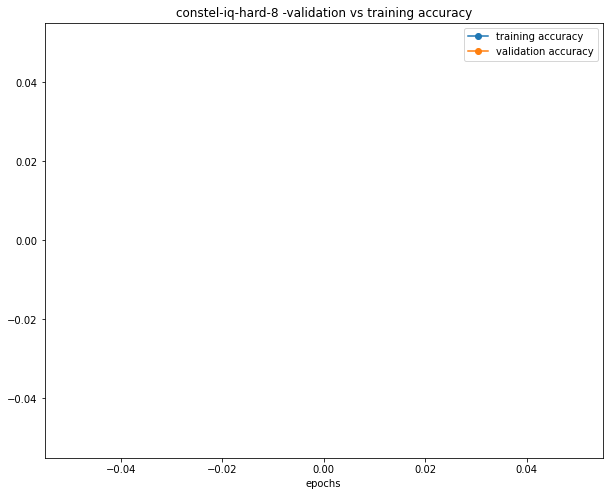

None

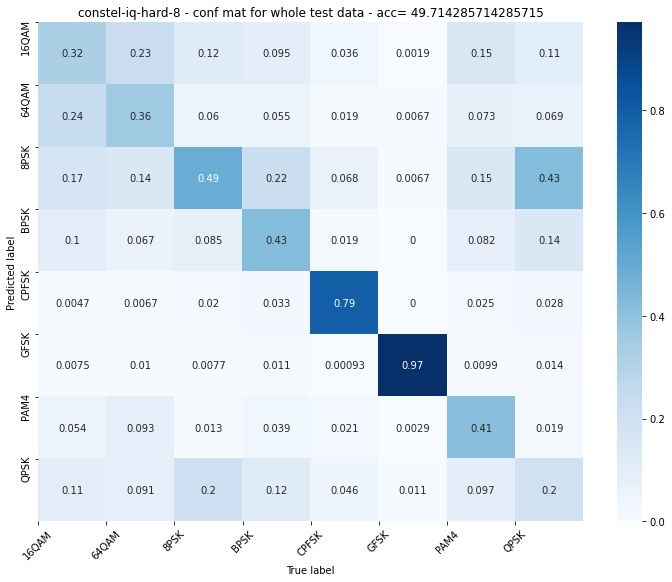

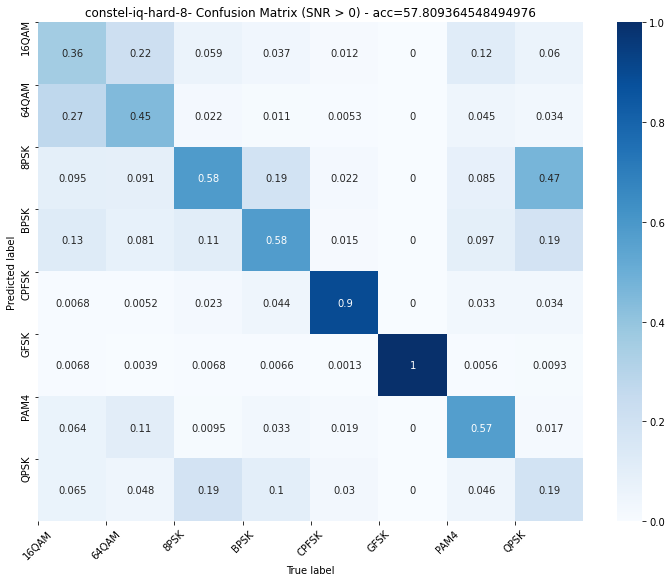

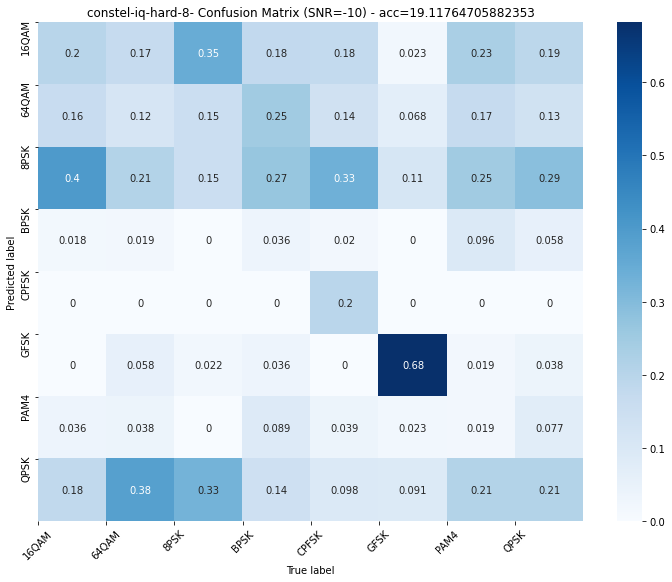

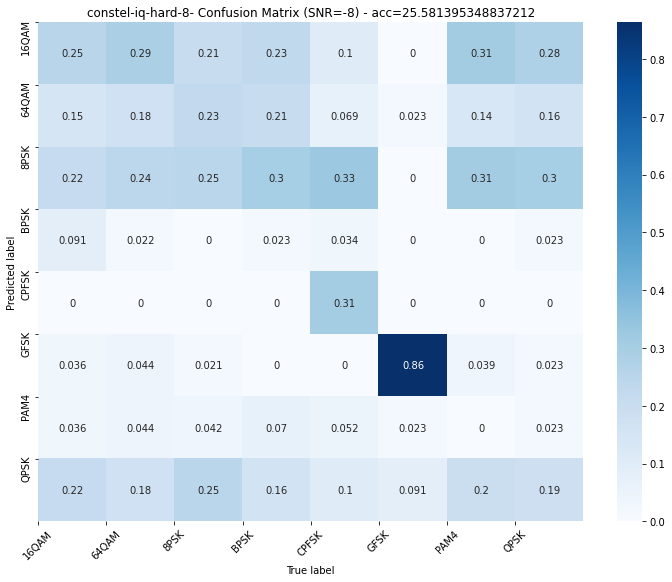

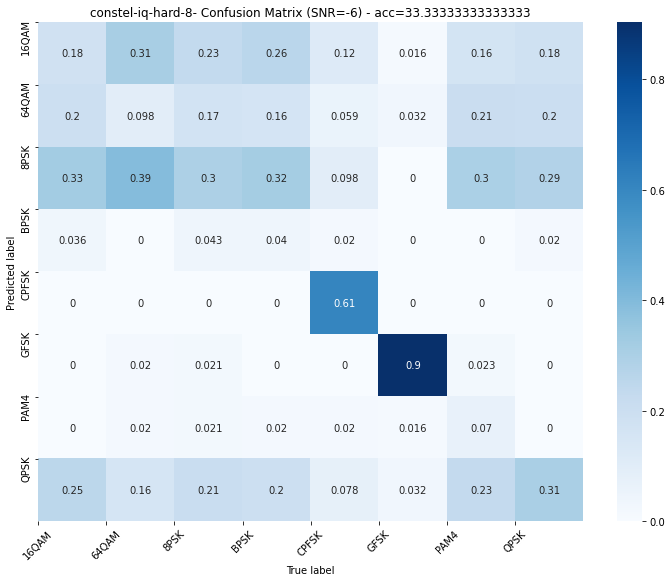

...

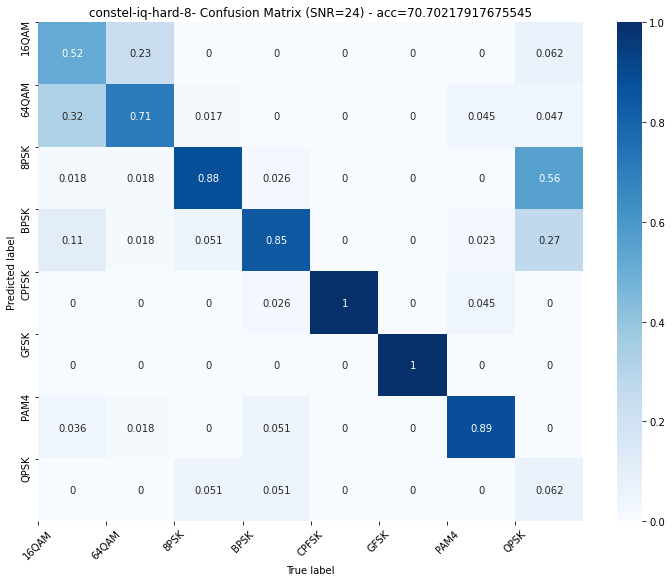

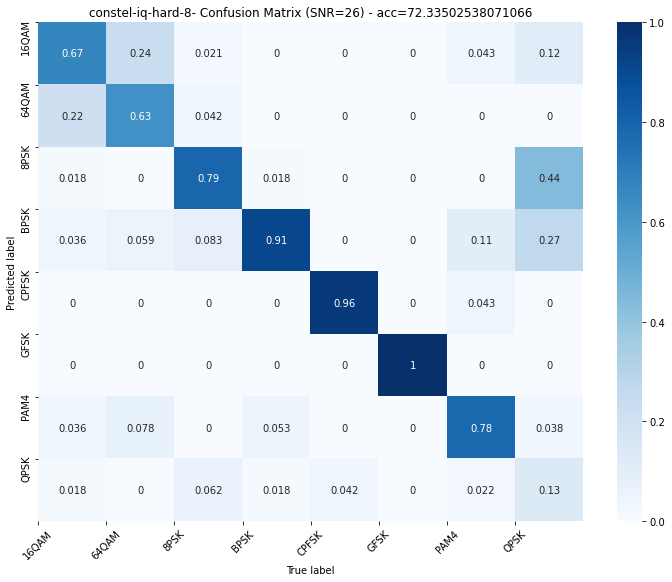

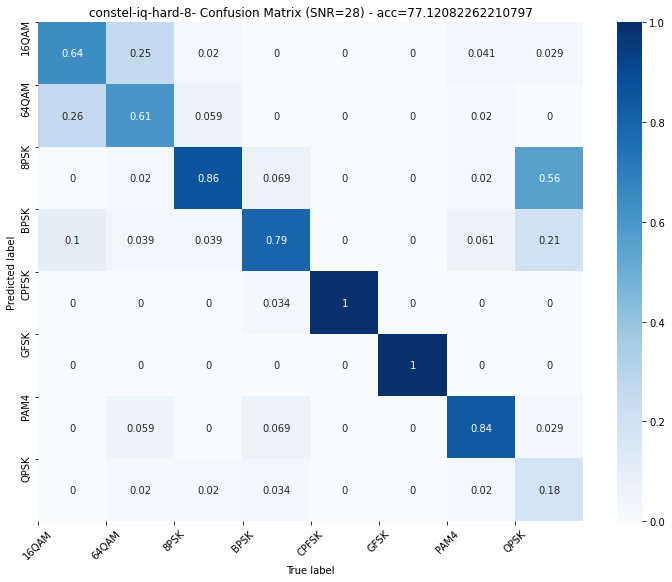

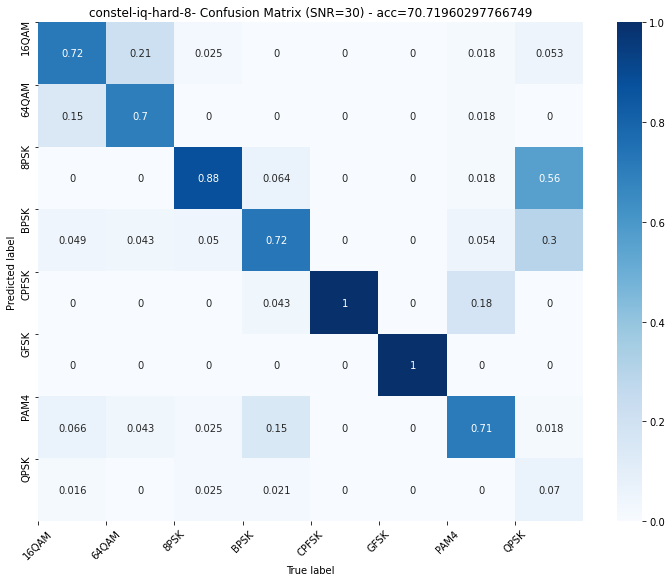

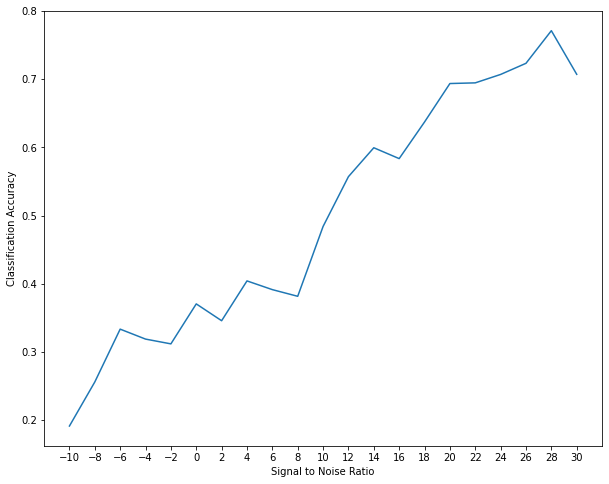

In [ ]:
hard_imgtime_model = build_imgtime_net(X_med_img_test.shape[-2], X_med_test.shape[-2], X_med_test.shape[-1])
hard_imgtime_model.load_weights(root_path + 'constel-iq-hard-8-weights-15.hdf5')
hard_imgtime_model_evaluater = ModelEvaluater(hard_imgtime_model, [X_med_img_test, X_med_test], y_med_test, [X_med_img_test, X_med_test], y_med_test, labels_med_test, labels_med, BATCH_SIZE, 'constel-iq-hard-8', feature_type=2)
hard_imgtime_model_evaluater.print_summary()

At high SNRs, hard-trained model works quite well on medium dataset.

#### Test hard-trained model on easy dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_201 (Conv1D)             (None, 1024, 40)     120         input_18[0][0]                   
__________________________________________________________________________________________________
activation_201 (Activation)     (None, 1024, 40)     0           conv1d_201[0][0]                 
__________________________________________________________________________________________________
conv1d_202 (Conv1D)             (None, 1024, 40)     4840        activation_201[0][0]             
____________________________________________________________________________________________

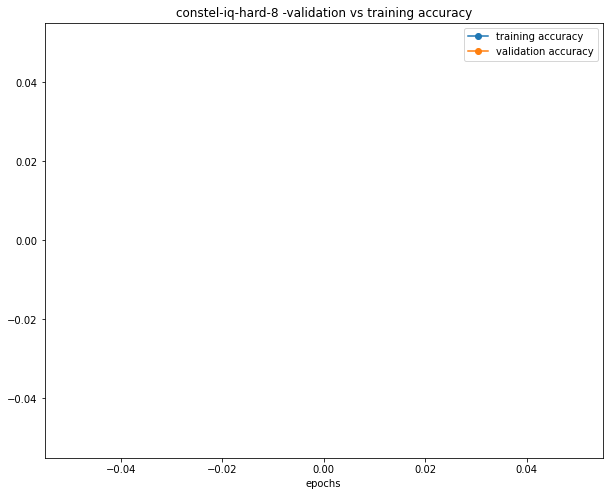

None

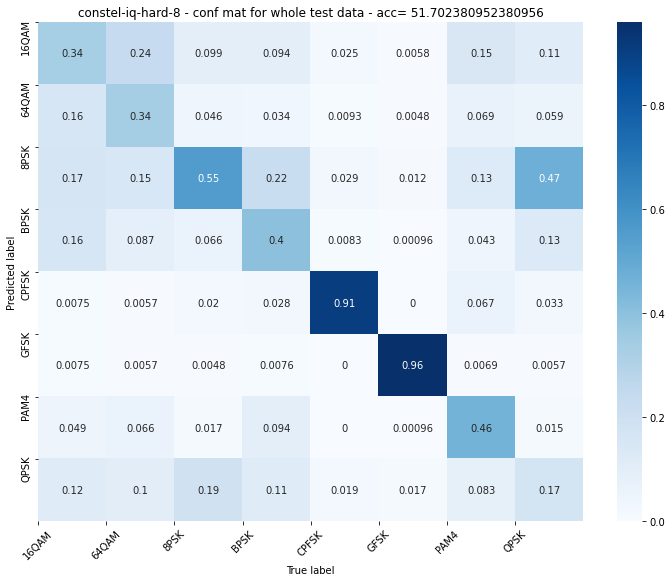

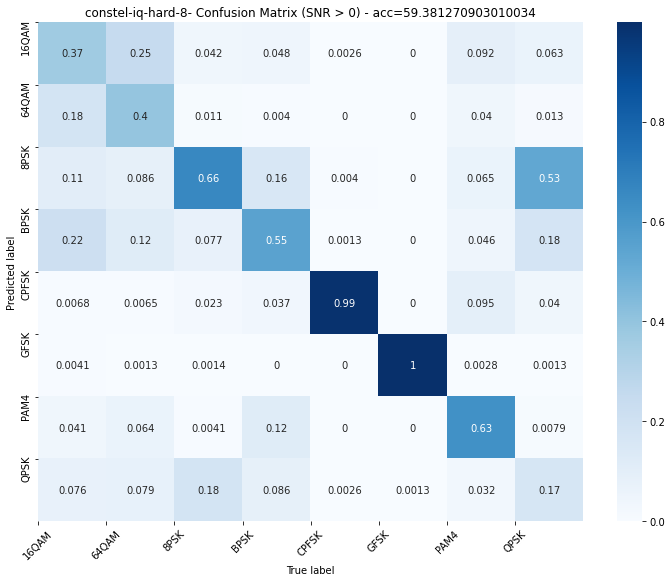

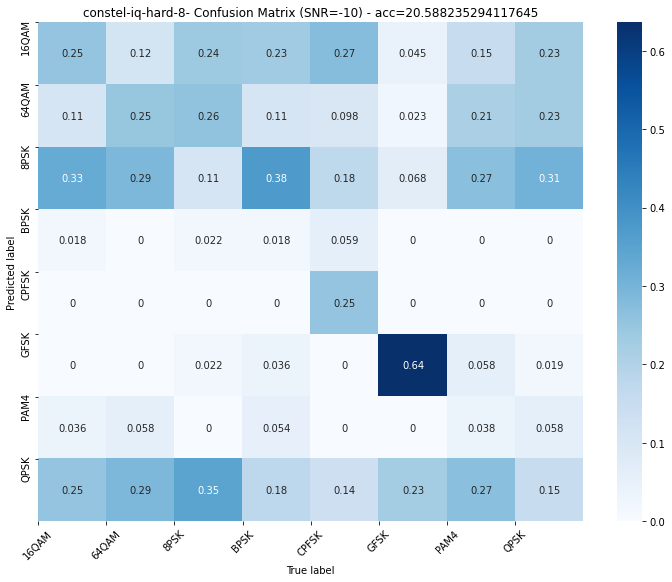

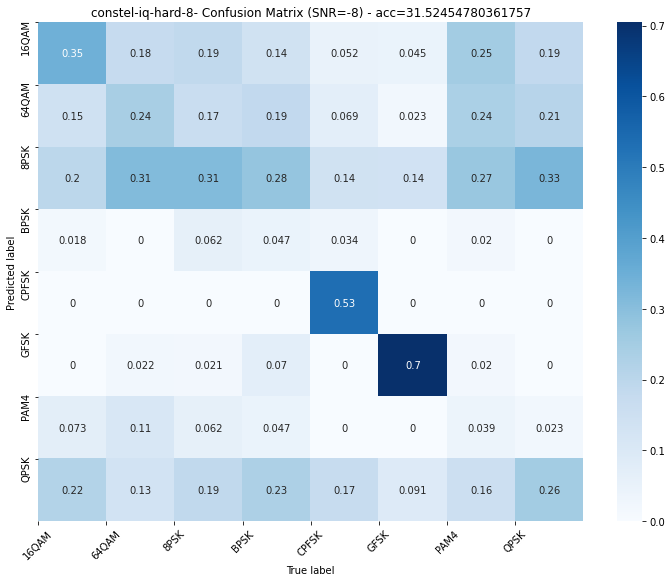

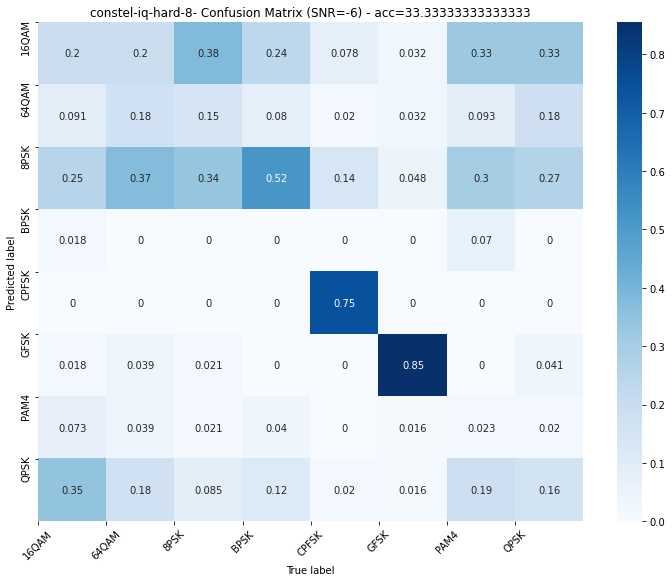

...

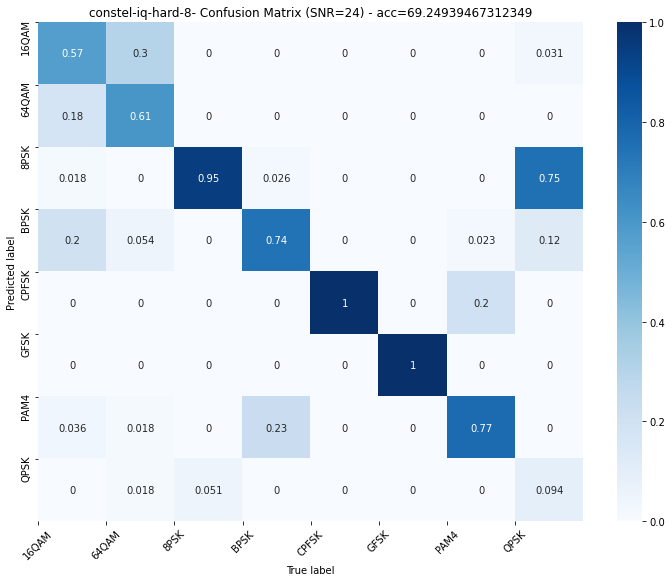

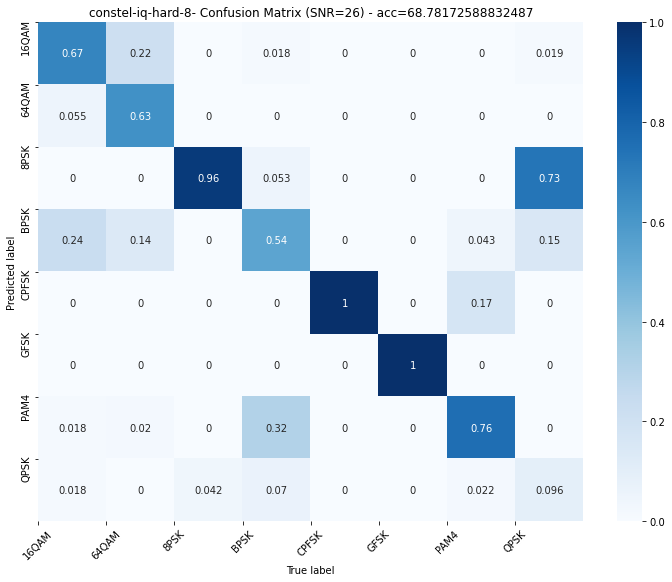

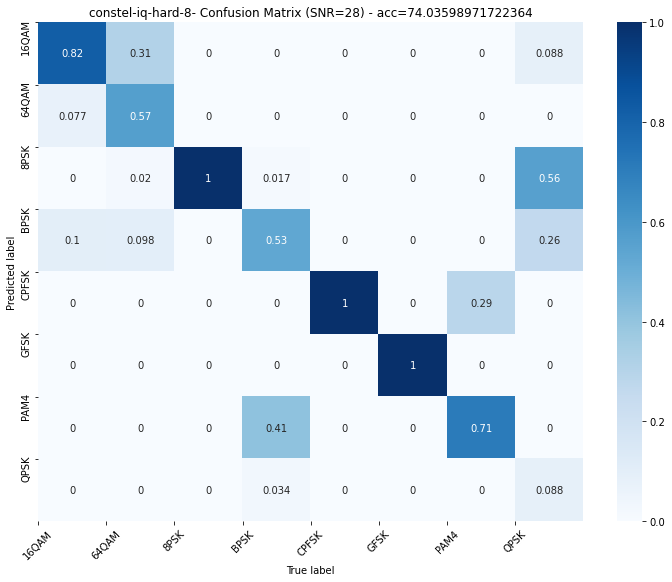

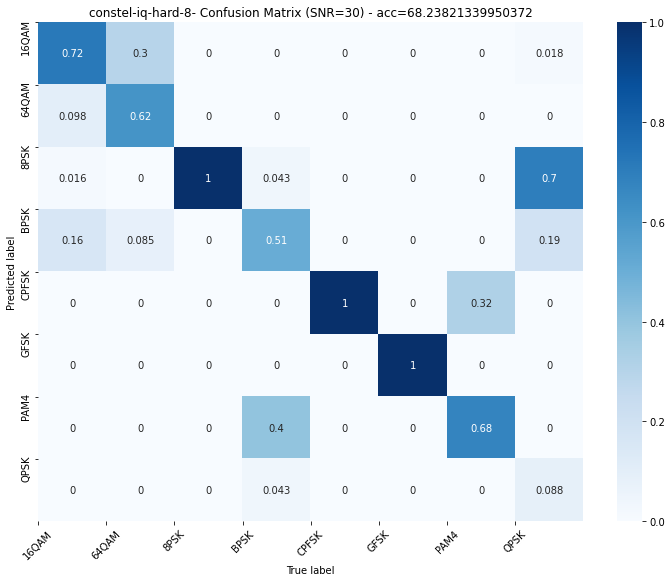

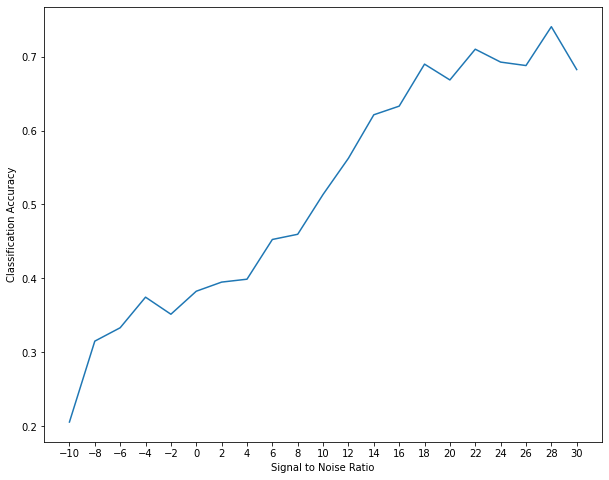

In [ ]:
hard_imgtime_model = build_imgtime_net(X_easy_img_test.shape[-2], X_easy_test.shape[-2], X_easy_test.shape[-1])
hard_imgtime_model.load_weights(root_path + 'constel-iq-hard-8-weights-15.hdf5')
hard_imgtime_model_evaluater = ModelEvaluater(hard_imgtime_model, [X_easy_img_test, X_easy_test], y_easy_test, [X_easy_img_test, X_easy_test], y_easy_test, labels_easy_test, labels_easy, BATCH_SIZE, 'constel-iq-hard-8', feature_type=2)
hard_imgtime_model_evaluater.print_summary()

Hard trained model worked pretty well on easy dataset too. So quite clear we can't train on easier one then work well on the hard one. Quite natural cos the easy dataset had no exposure to doppler and heavy distortions.

### Train combined img-time model on medium dataset

In [ ]:
data_med = joblib.load(root_path + 'data/matlab_dict_medium.hdf5')

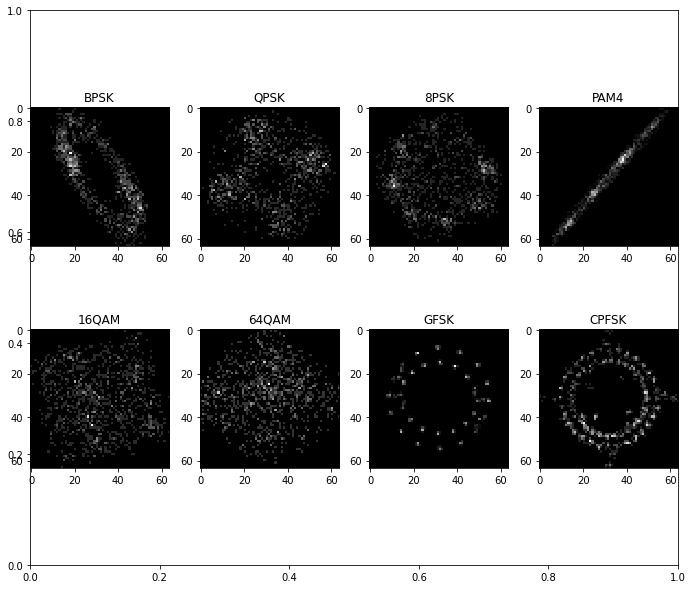

In [ ]:
_snr = 30
modtypes = ['BPSK', 'QPSK', '8PSK', 'PAM4', '16QAM', '64QAM', 'GFSK', 'CPFSK']
samp = 10

fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(2,4,i+1)
    counts, xedges, yedges = np.histogram2d(data_med[(mod, _snr)][samp][0], data_med[(mod, _snr)][samp][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
    ax.imshow(counts)
    ax.set_title(mod)
    plt.tight_layout()
plt.show()

Medium dataset has Rician Fading and light local oscillator offset, but no Doppler effect. It looks much more recognisable than the hard dataset.

In [ ]:
X_med = []
X_med_imgs = []
labels_med = [] # label each example by a pair (modulation type, snr)
total_examples = 0
nbins =64
for mod_type, snr in data_med.keys():
  #if mod_type not in [b'WBFM', b'AM-DSB', b'AM-SSB']:
  #if mod_type in ['QPSK', '8PSK', '16QAM', '64QAM']:
    current_matrix = data_med[(mod_type, snr)]
    total_examples += current_matrix.shape[0]
    for i in range(current_matrix.shape[0]):
      if (i<250):
        X_med.append(current_matrix[i])
        counts, xedges, yedges = np.histogram2d(current_matrix[i][0], current_matrix[i][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
        X_med_imgs.append(counts)
        labels_med.append((mod_type, snr)) # mod_type is of type byte
    
X_med = np.array(X_med).reshape(-1, 1024, 2)
X_med_imgs = np.array(X_med_imgs).reshape(-1, nbins,nbins, 1)
labels_med = np.array(labels_med) 
print('loaded %d signal vectors into X %s and their corresponding %d labels into labels %s' %(total_examples, X_med.shape, labels_med.shape[0], labels_med.shape))
print(X_med_imgs.shape)

loaded 168000 signal vectors into X (42000, 1024, 2) and their corresponding 42000 labels into labels (42000, 2)
(42000, 64, 64, 1)


In [ ]:
TEST_PERCENTAGE = 0.2
X_med_train, X_med_test, labels_med_train, labels_med_test, y_med_train, y_med_test = split_data(X_med,labels_med, TEST_PERCENTAGE)
X_med_img_train, X_med_img_test, labels_med_img_train, labels_med_img_test, y_med_img_train, y_med_img_test = split_data(X_med_imgs,labels_med, TEST_PERCENTAGE)

print('shapes after train test split:\n X_train %s, \n X_test %s, \n labels_train %s, \n labels_test %s, \n y_train %s, \n y_test %s' %(X_med_train.shape, X_med_test.shape, labels_med_train.shape, labels_med_test.shape, y_med_train.shape, y_med_test.shape))
print(np.count_nonzero(y_med_train == y_med_img_train))

shapes after train test split:
 X_train (33600, 1024, 2), 
 X_test (8400, 1024, 2), 
 labels_train (33600, 2), 
 labels_test (8400, 2), 
 y_train (33600,), 
 y_test (8400,)
33600


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_76 (Conv1D)              (None, 1024, 40)     120         input_7[0][0]                    
__________________________________________________________________________________________________
activation_76 (Activation)      (None, 1024, 40)     0           conv1d_76[0][0]                  
__________________________________________________________________________________________________
conv1d_77 (Conv1D)              (None, 1024, 40)     4840        activation_76[0][0]              
____________________________________________________________________________________________

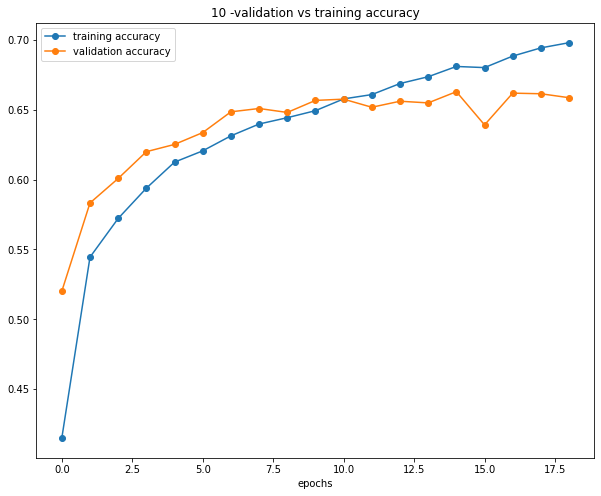

None

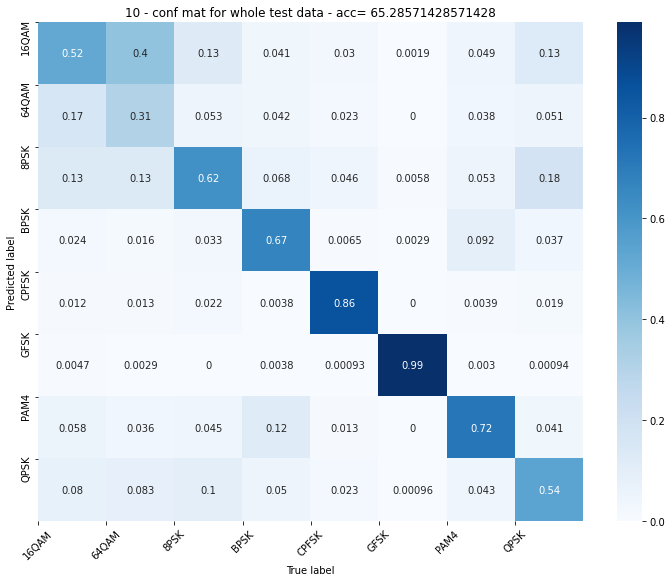

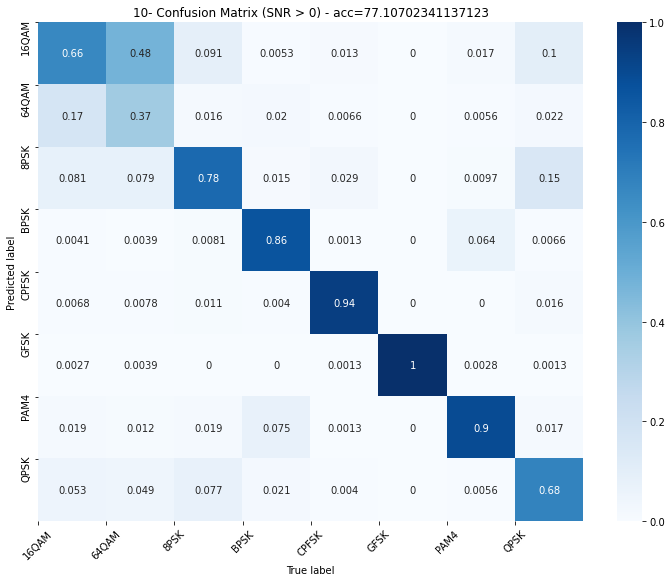

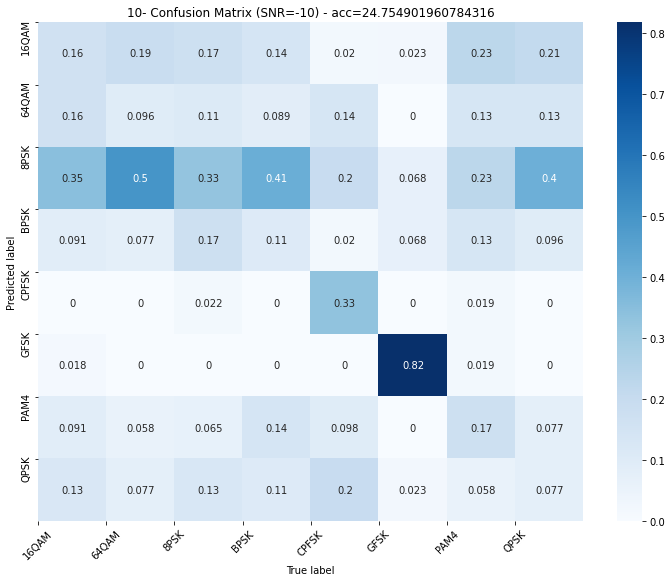

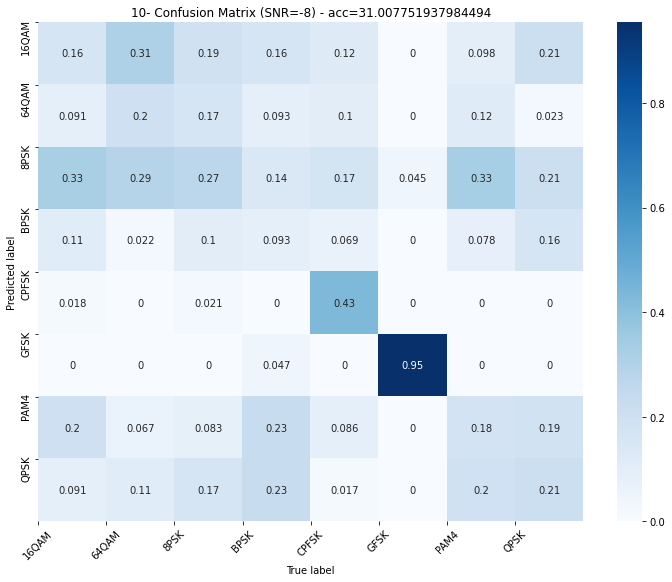

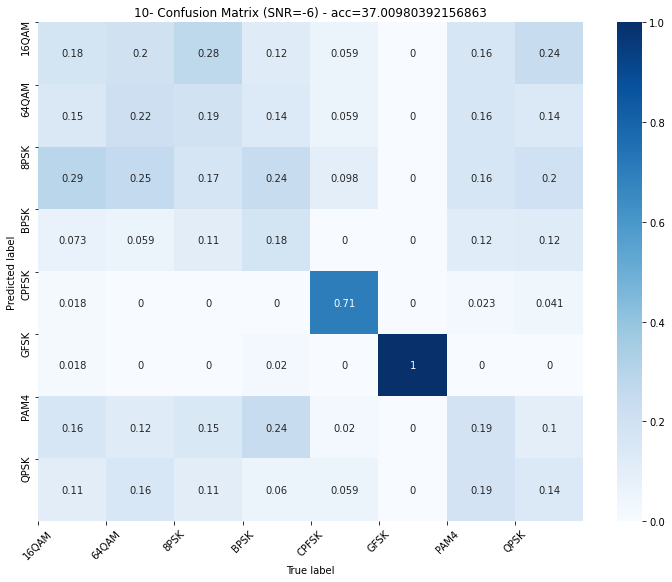

...

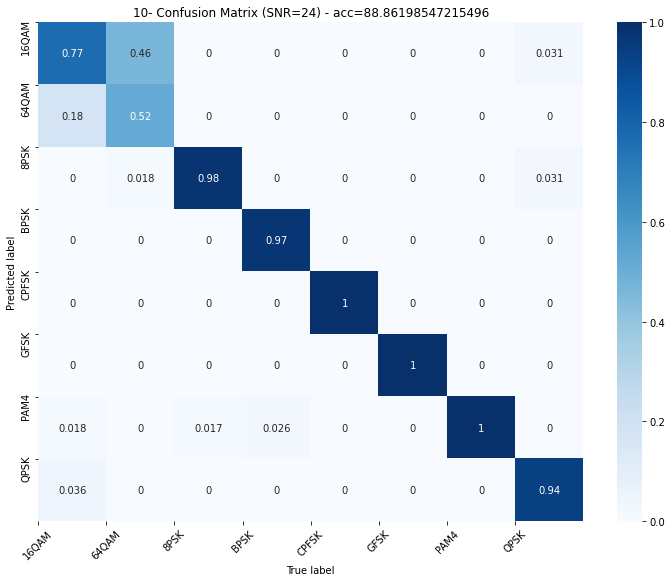

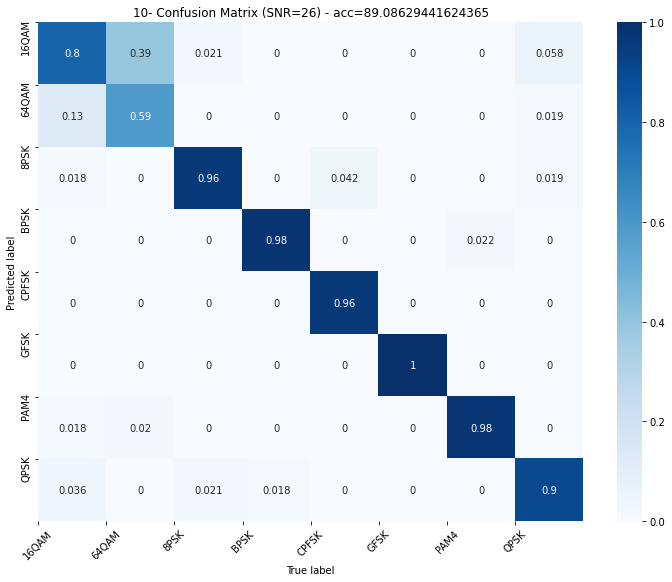

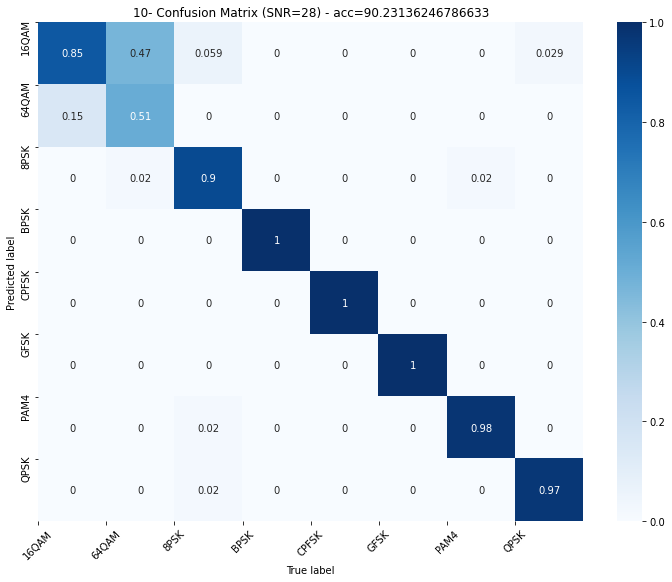

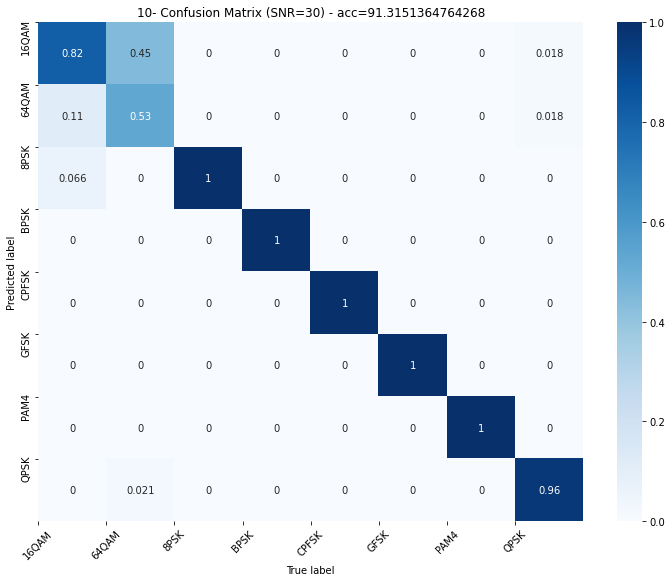

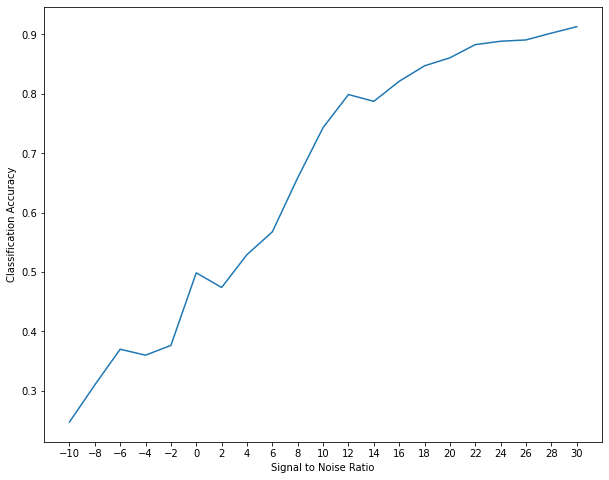

In [ ]:
NUM_CLASSES = 8
BATCH_SIZE=32 #Cannot be too big otherwise will exceed memory
med_imgtime_model = build_imgtime_net(X_med_img_train.shape[-2], X_med_train.shape[-2], X_med_train.shape[-1])
med_imgtime_model_evaluater = ModelEvaluater(med_imgtime_model, [X_med_img_train, X_med_train], y_med_train, [X_med_img_test, X_med_test], y_med_test, labels_med_test, labels_med, BATCH_SIZE, 'constel-iq-med-8', feature_type=2)
med_imgtime_model_evaluater.fit(EPOCHS,patience=6)
med_imgtime_model_evaluater.print_summary()

#### Test medium-trained model on hard dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_51 (Conv1D)              (None, 1024, 40)     120         input_6[0][0]                    
__________________________________________________________________________________________________
activation_51 (Activation)      (None, 1024, 40)     0           conv1d_51[0][0]                  
__________________________________________________________________________________________________
conv1d_52 (Conv1D)              (None, 1024, 40)     4840        activation_51[0][0]              
____________________________________________________________________________________________

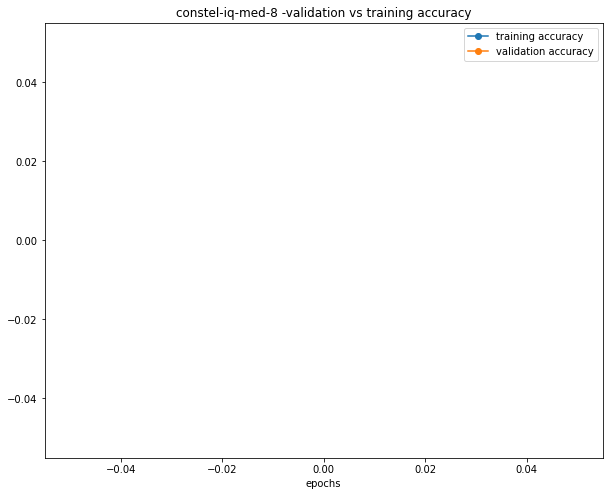

None

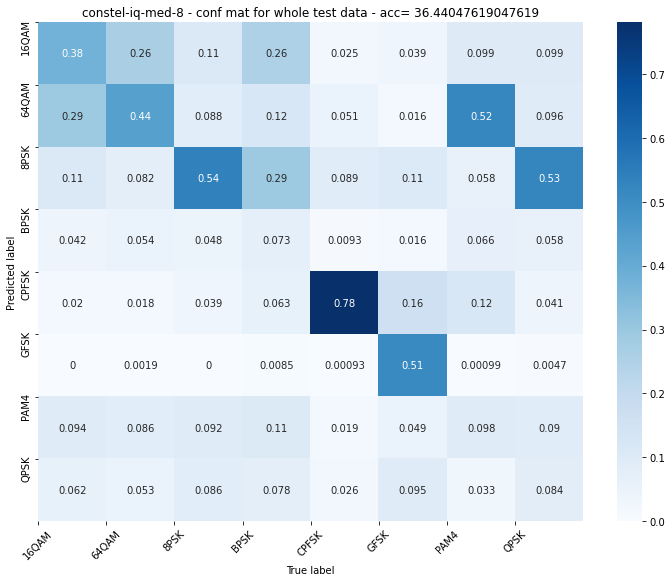

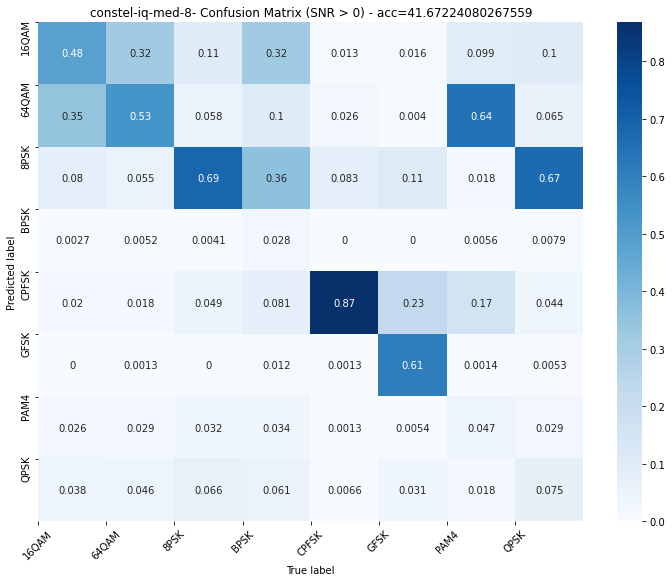

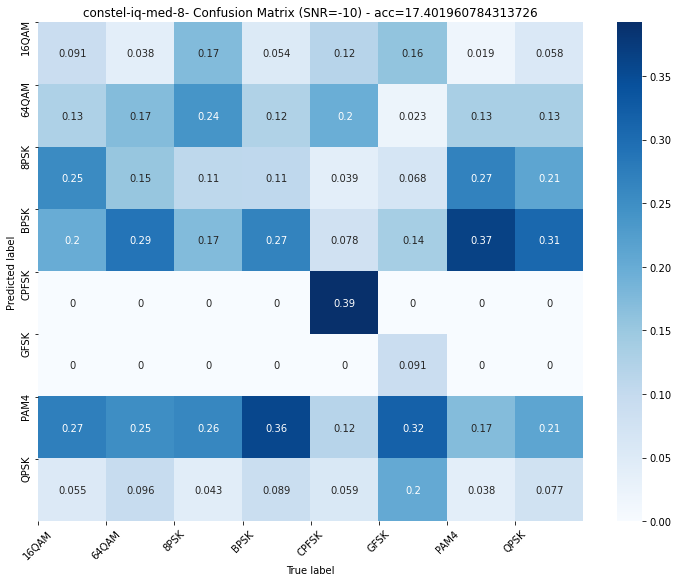

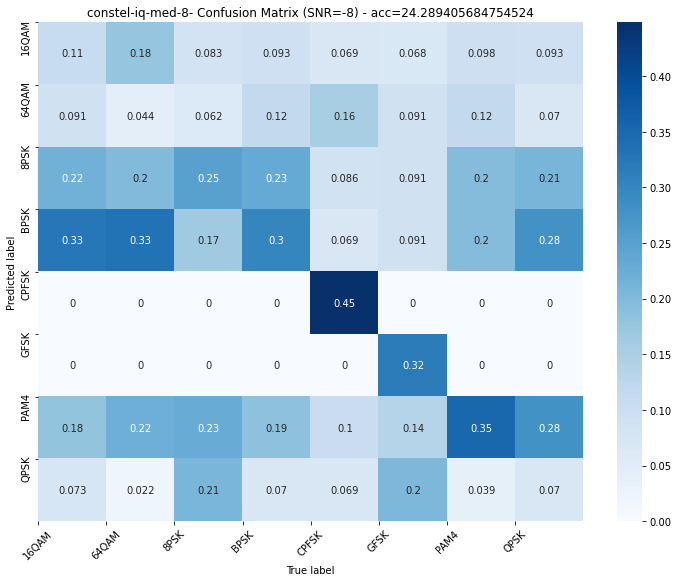

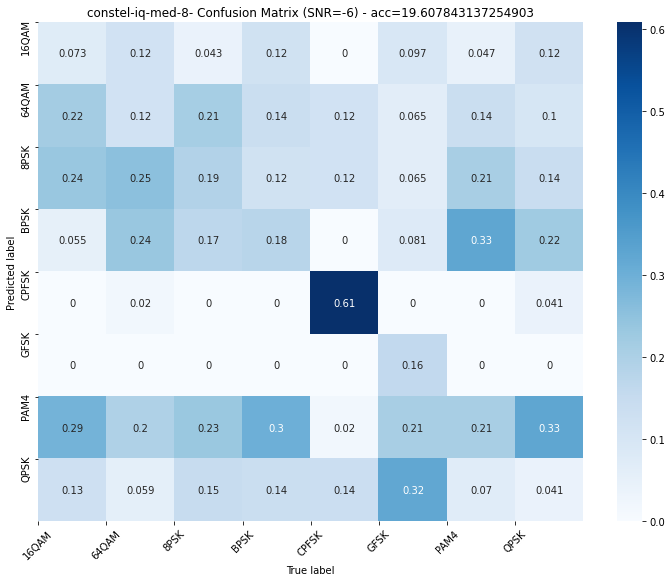

...

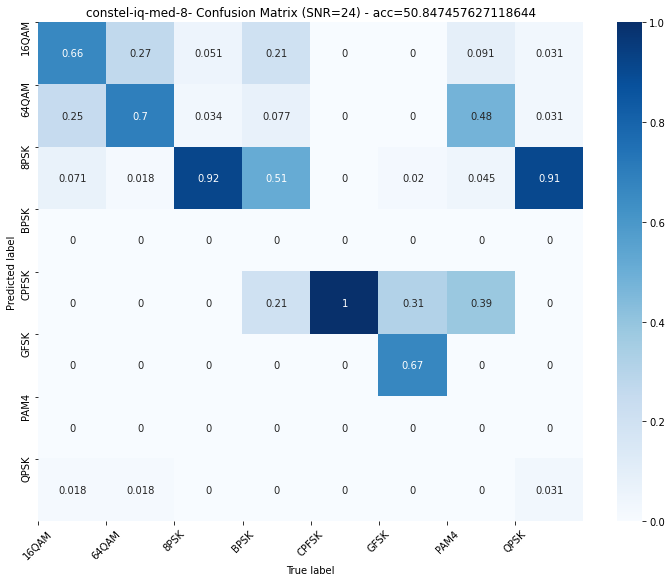

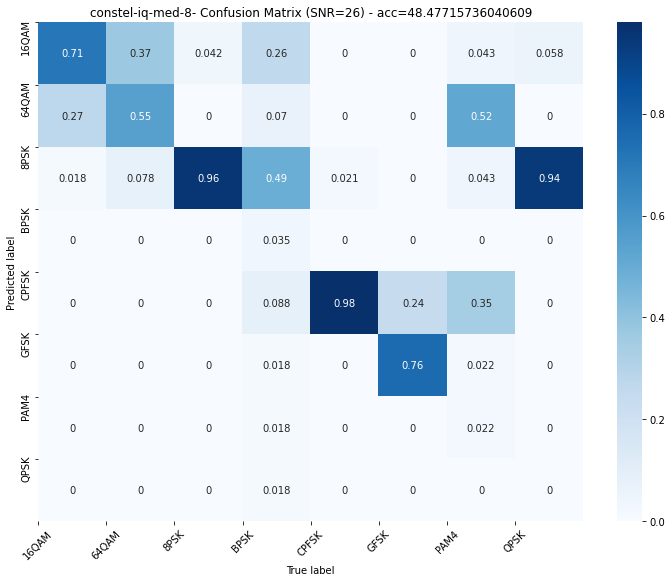

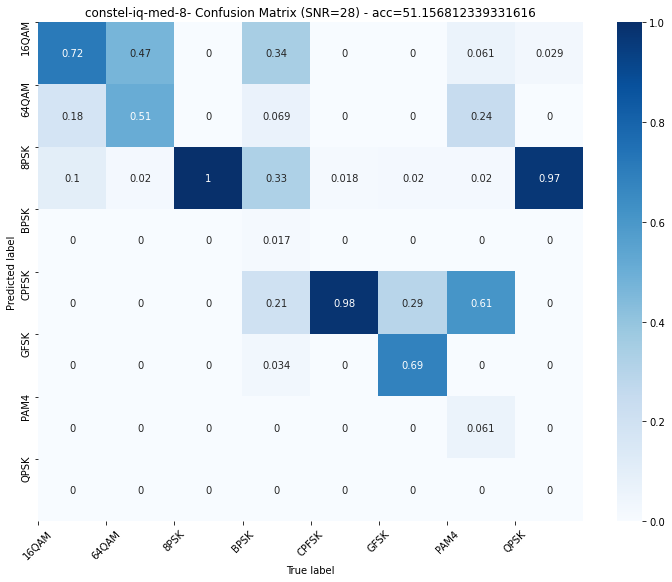

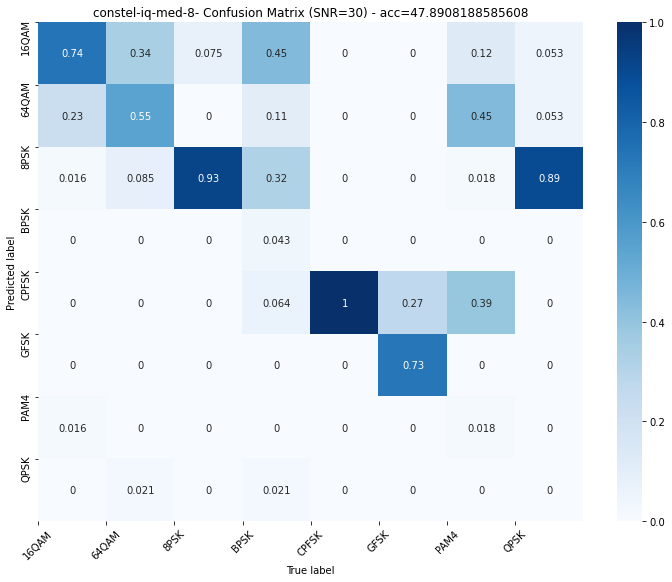

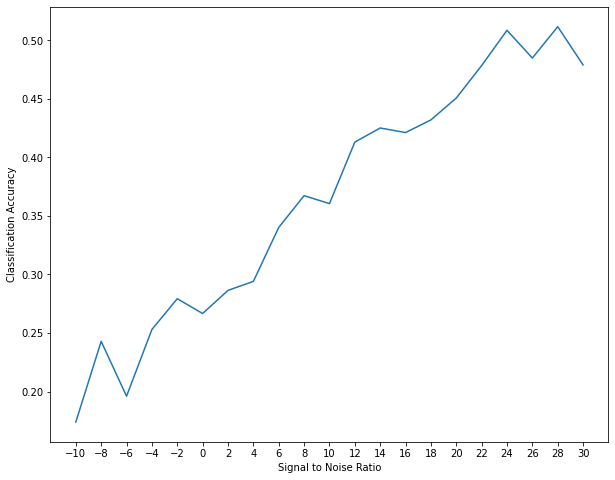

In [ ]:
med_imgtime_model = build_imgtime_net(X_med_img_test.shape[-2], X_med_test.shape[-2], X_med_test.shape[-1])
med_imgtime_model.load_weights(root_path + 'constel-iq-med-8-weights-13.hdf5')
med_imgtime_model_evaluater = ModelEvaluater(med_imgtime_model, [X_img_test, X_test], y_test, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 'constel-iq-med-8', feature_type=2)
med_imgtime_model_evaluater.print_summary()

Medium-trained model works badly on hard dataset.

#### Test medium-trained model on easy dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_176 (Conv1D)             (None, 1024, 40)     120         input_16[0][0]                   
__________________________________________________________________________________________________
activation_176 (Activation)     (None, 1024, 40)     0           conv1d_176[0][0]                 
__________________________________________________________________________________________________
conv1d_177 (Conv1D)             (None, 1024, 40)     4840        activation_176[0][0]             
____________________________________________________________________________________________

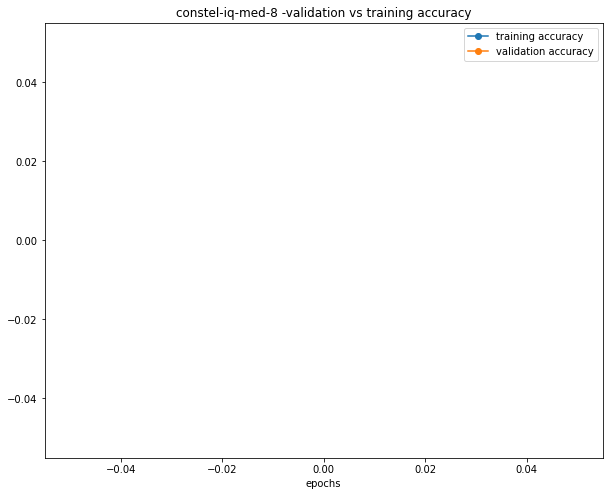

None

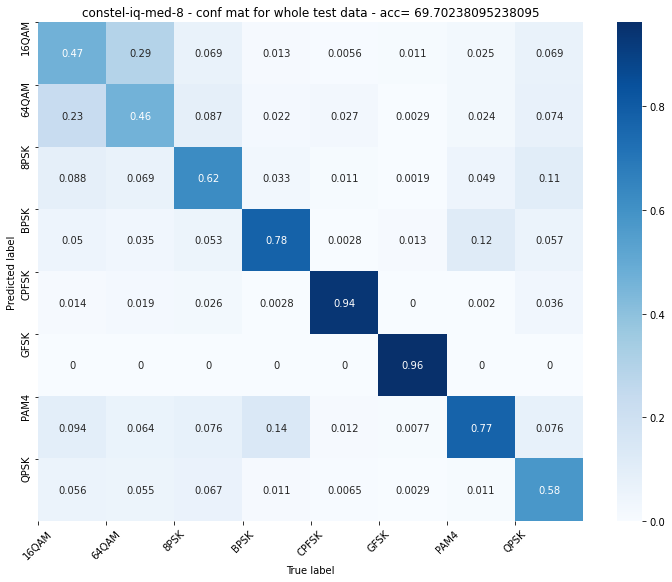

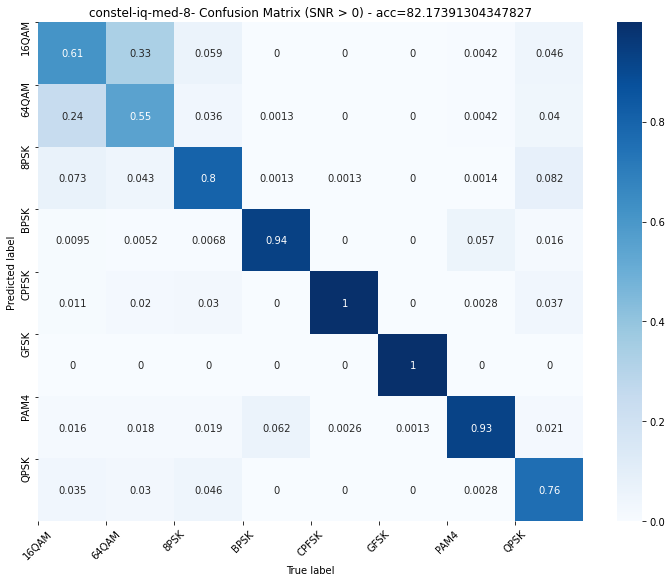

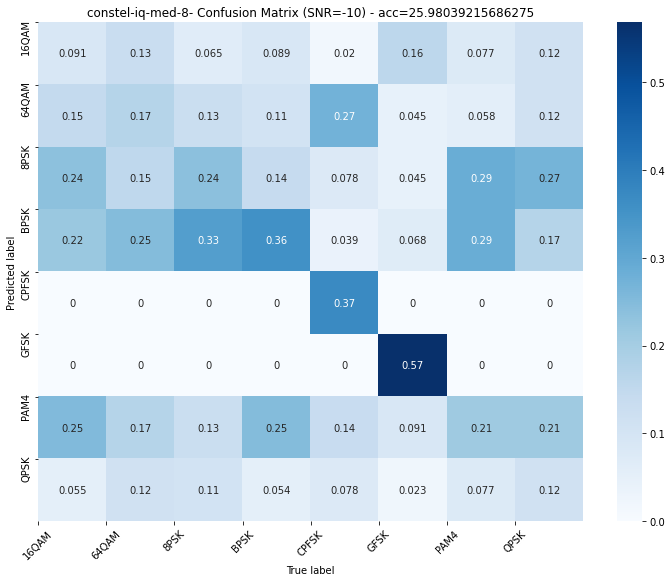

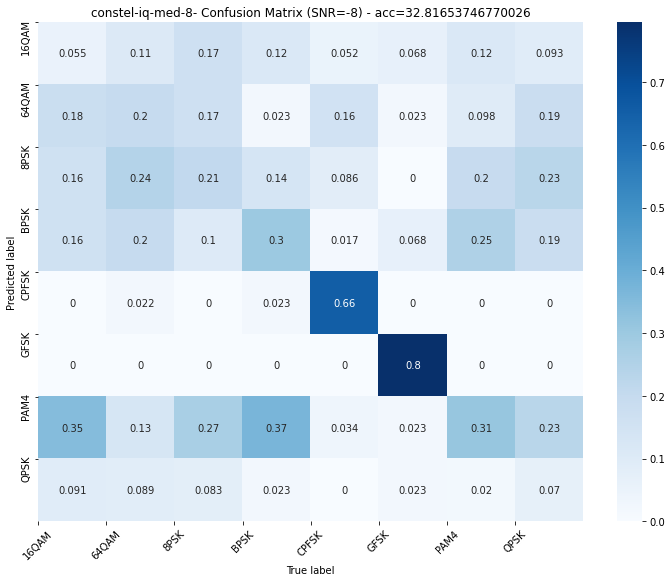

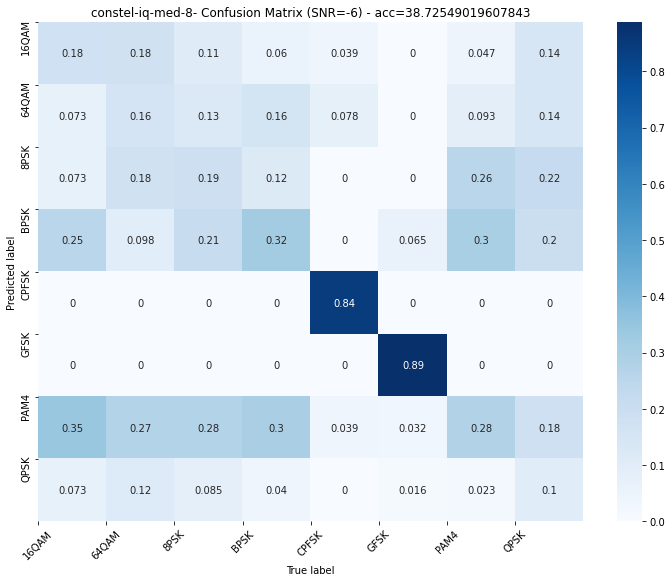

...

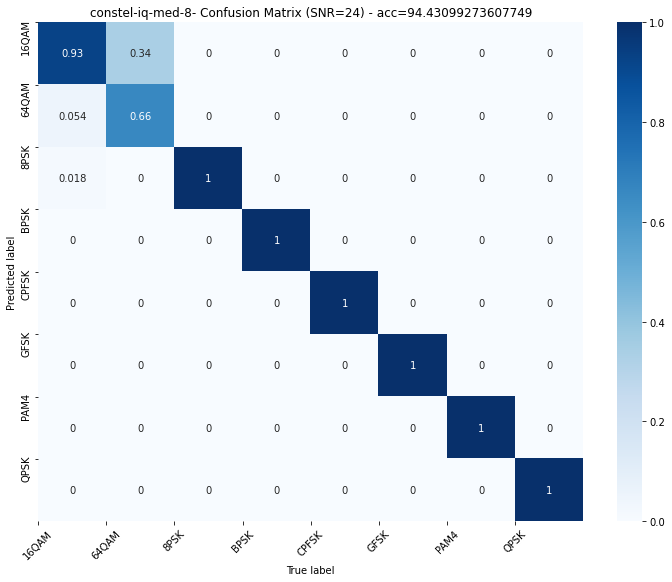

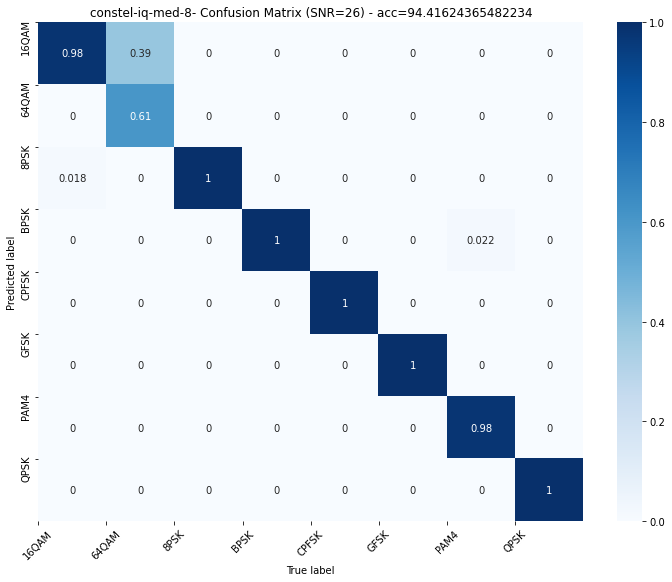

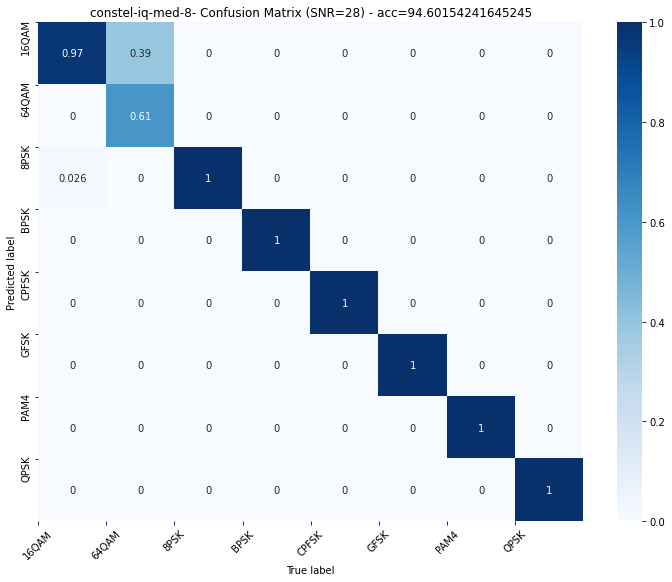

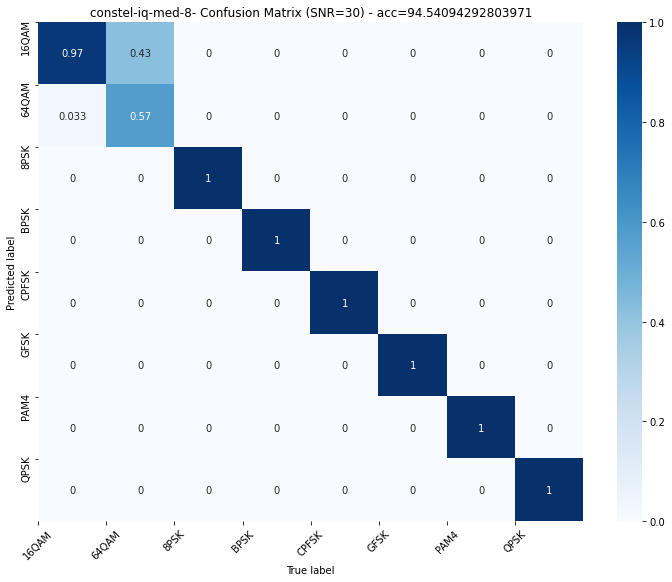

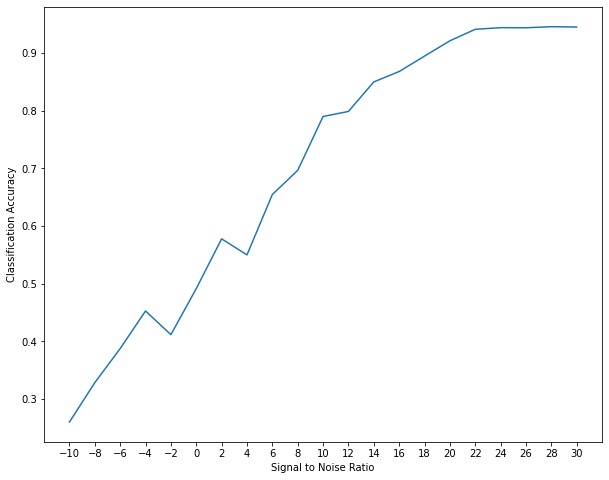

In [ ]:
med_imgtime_model = build_imgtime_net(X_med_img_test.shape[-2], X_med_test.shape[-2], X_med_test.shape[-1])
med_imgtime_model.load_weights(root_path + 'constel-iq-med-8-weights-13.hdf5')
med_imgtime_model_evaluater = ModelEvaluater(med_imgtime_model, [X_easy_img_test, X_easy_test], y_easy_test, [X_easy_img_test, X_easy_test], y_easy_test, labels_easy_test, labels_easy, BATCH_SIZE, 'constel-iq-med-8', feature_type=2)
med_imgtime_model_evaluater.print_summary()

Medium-trained adapts to easy dataset pretty well.

### Train combined img-time model on easy dataset

In [ ]:
data_easy = joblib.load(root_path + 'data/matlab_dict_easy.hdf5')

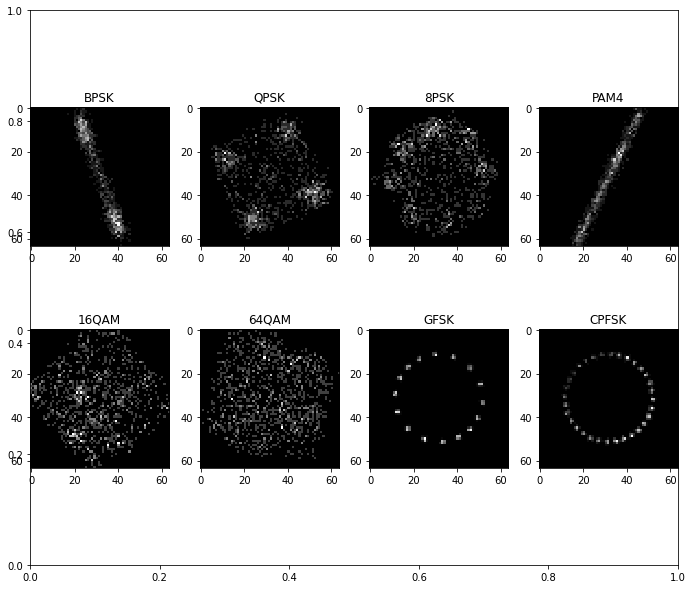

In [ ]:
_snr = 30
modtypes = ['BPSK', 'QPSK', '8PSK', 'PAM4', '16QAM', '64QAM', 'GFSK', 'CPFSK']
samp = 10

fig, ax = plt.subplots(figsize=(10,8)) 
for i, mod in enumerate(modtypes):
    ax = fig.add_subplot(2,4,i+1)
    counts, xedges, yedges = np.histogram2d(data_easy[(mod, _snr)][samp][0], data_easy[(mod, _snr)][samp][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
    ax.imshow(counts)
    ax.set_title(mod)
    plt.tight_layout()
plt.show()

Easy dataset has no distortion, only AWGN.

In [ ]:
X_easy = []
X_easy_imgs = []
labels_easy = [] # label each example by a pair (modulation type, snr)
total_examples = 0
nbins =64
for mod_type, snr in data_easy.keys():
  #if mod_type not in [b'WBFM', b'AM-DSB', b'AM-SSB']:
  #if mod_type in ['QPSK', '8PSK', '16QAM', '64QAM']:
    current_matrix = data_easy[(mod_type, snr)]
    total_examples += current_matrix.shape[0]
    for i in range(current_matrix.shape[0]):
      if (i<250):
        X_easy.append(current_matrix[i])
        counts, xedges, yedges = np.histogram2d(current_matrix[i][0], current_matrix[i][1], bins=nbins,range = [[-0.05, 0.05], [-0.05, 0.05]])
        X_easy_imgs.append(counts)
        labels_easy.append((mod_type, snr)) # mod_type is of type byte
    
X_easy = np.array(X_easy).reshape(-1, 1024, 2)
X_easy_imgs = np.array(X_easy_imgs).reshape(-1, nbins,nbins, 1)
labels_easy = np.array(labels_easy) 
print('loaded %d signal vectors into X %s and their corresponding %d labels into labels %s' %(total_examples, X_easy.shape, labels_easy.shape[0], labels_easy.shape))
print(X_easy_imgs.shape)

loaded 168000 signal vectors into X (42000, 1024, 2) and their corresponding 42000 labels into labels (42000, 2)
(42000, 64, 64, 1)


In [ ]:
del data_easy

In [ ]:
TEST_PERCENTAGE = 0.2
X_easy_train, X_easy_test, labels_easy_train, labels_easy_test, y_easy_train, y_easy_test = split_data(X_easy,labels_easy, TEST_PERCENTAGE)
X_easy_img_train, X_easy_img_test, labels_easy_img_train, labels_easy_img_test, y_easy_img_train, y_easy_img_test = split_data(X_easy_imgs,labels_easy, TEST_PERCENTAGE)

print('shapes after train test split:\n X_train %s, \n X_test %s, \n labels_train %s, \n labels_test %s, \n y_train %s, \n y_test %s' %(X_easy_train.shape, X_easy_test.shape, labels_easy_train.shape, labels_easy_test.shape, y_easy_train.shape, y_easy_test.shape))

shapes after train test split:
 X_train (33600, 1024, 2), 
 X_test (8400, 1024, 2), 
 labels_train (33600, 2), 
 labels_test (8400, 2), 
 y_train (33600,), 
 y_test (8400,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_76 (Conv1D)              (None, 1024, 40)     120         input_8[0][0]                    
__________________________________________________________________________________________________
activation_76 (Activation)      (None, 1024, 40)     0           conv1d_76[0][0]                  
__________________________________________________________________________________________________
conv1d_77 (Conv1D)              (None, 1024, 40)     4840        activation_76[0][0]              
____________________________________________________________________________________________

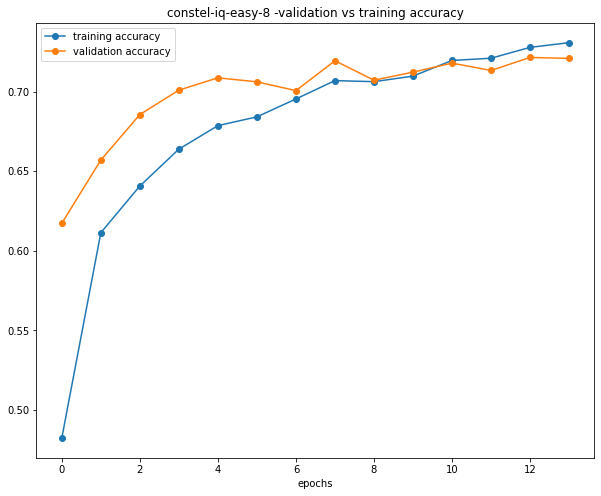

None

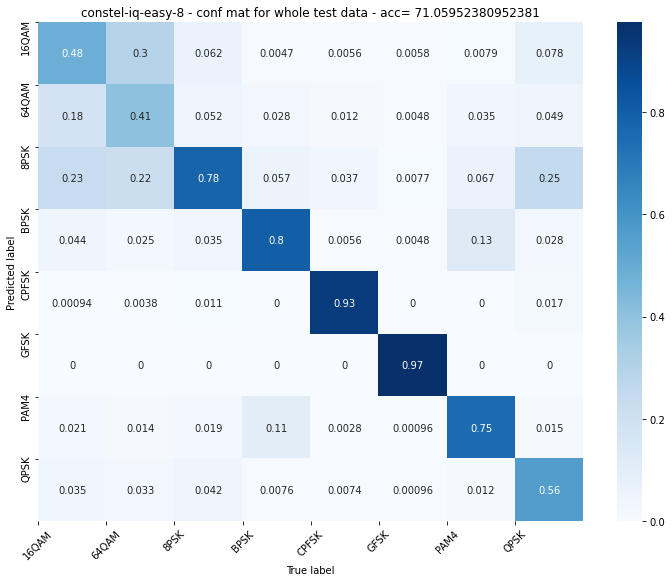

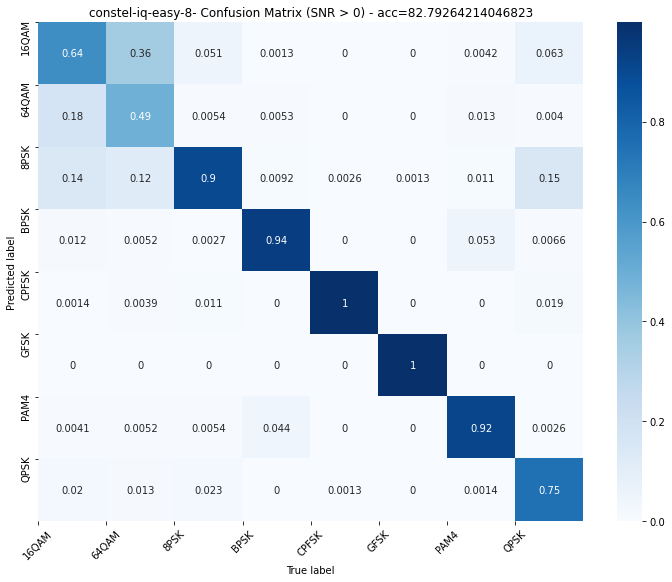

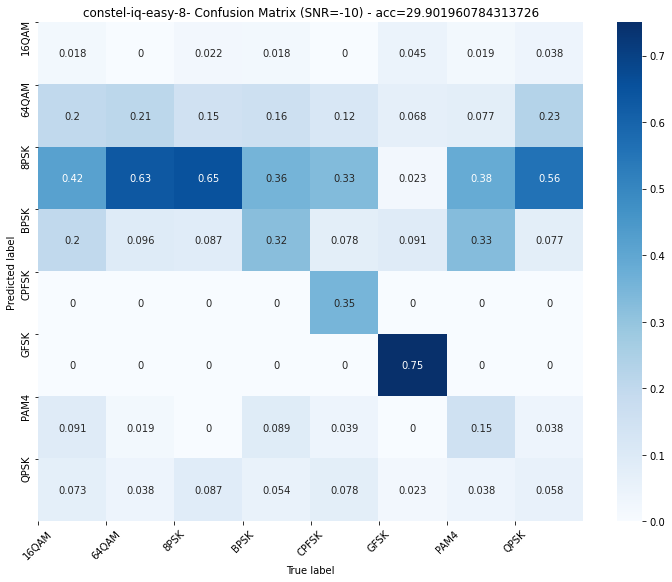

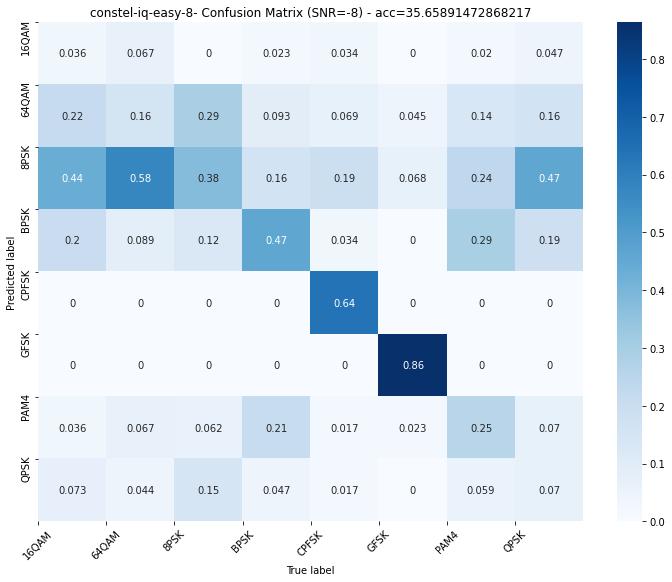

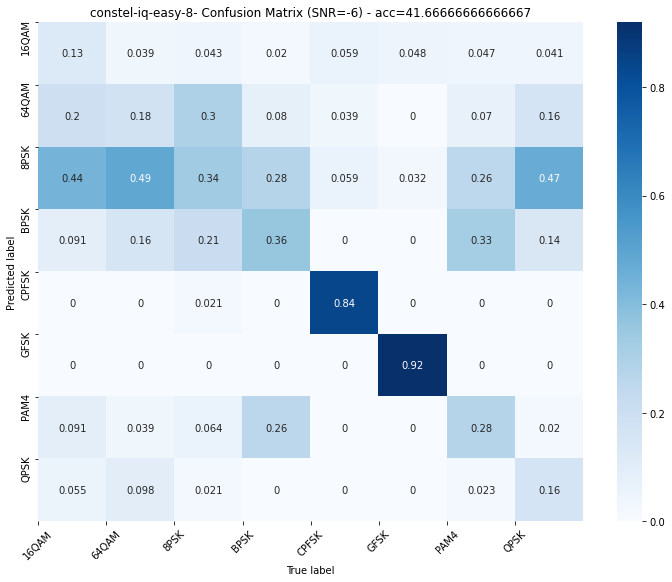

...

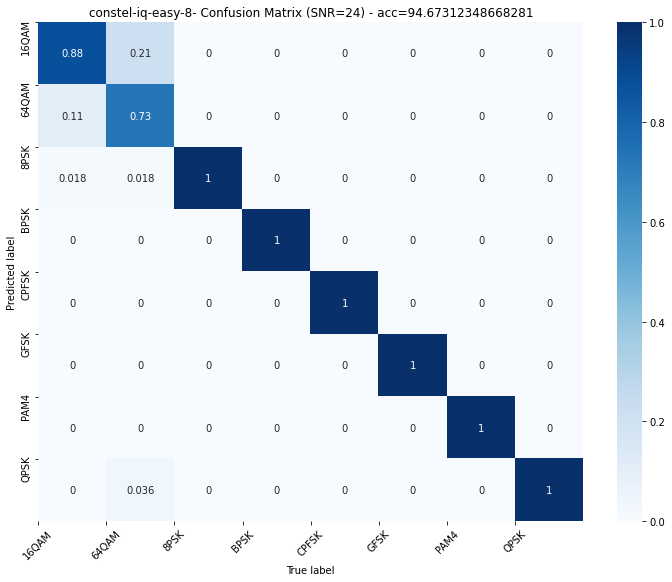

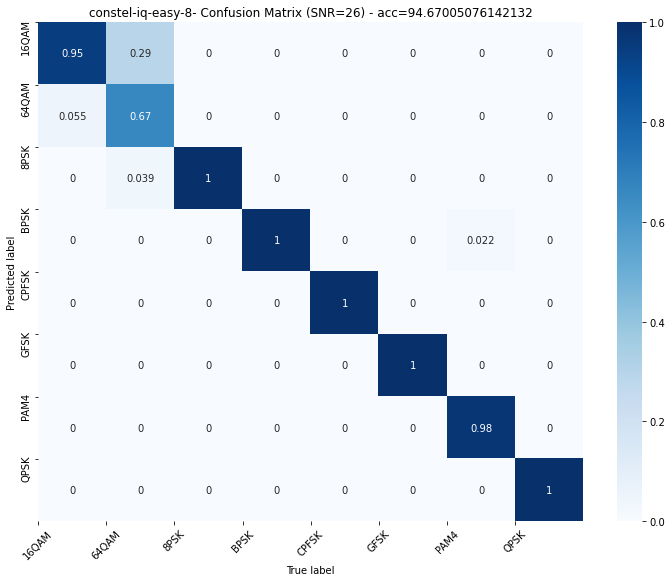

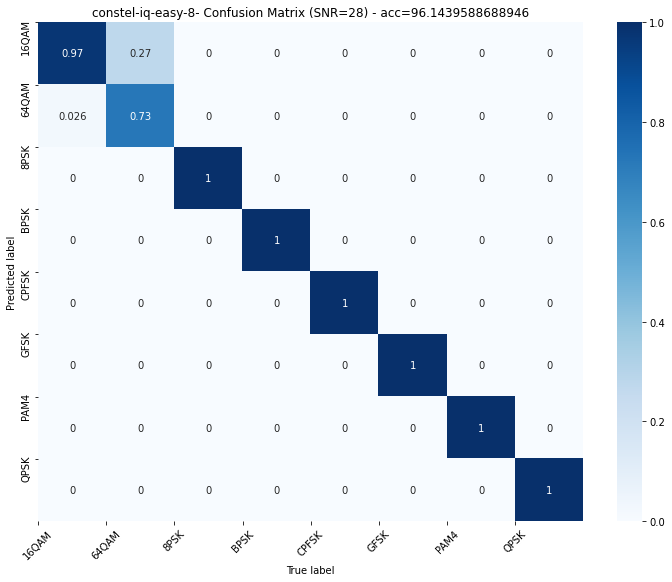

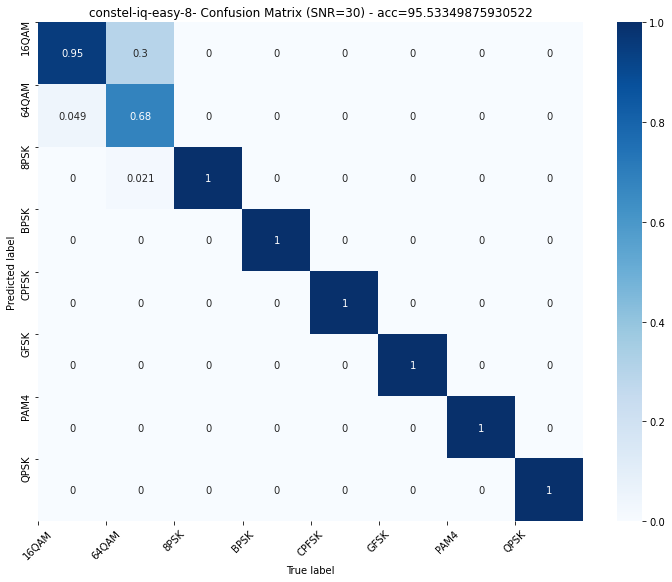

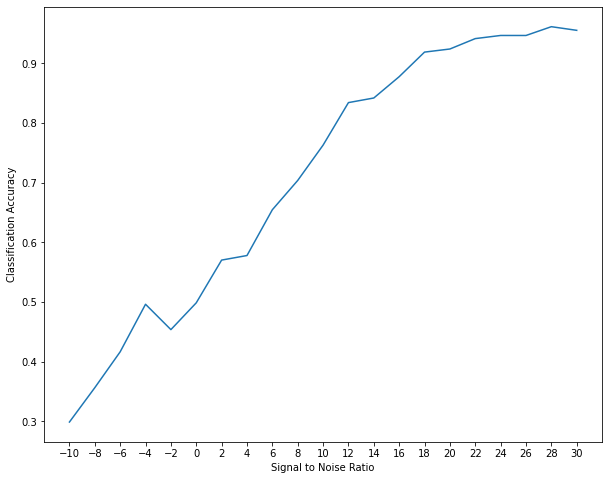

In [ ]:
NUM_CLASSES = 8
BATCH_SIZE=32 #Cannot be too big otherwise will exceed memory
easy_imgtime_model = build_imgtime_net(X_easy_img_train.shape[-2], X_easy_train.shape[-2], X_easy_train.shape[-1])
easy_imgtime_model_evaluater = ModelEvaluater(easy_imgtime_model, [X_easy_img_train, X_easy_train], y_easy_train, [X_easy_img_test, X_easy_test], y_easy_test, labels_easy_test, labels_easy, BATCH_SIZE, 'constel-iq-easy-8', feature_type=2)
easy_imgtime_model_evaluater.fit(EPOCHS,patience=6)
easy_imgtime_model_evaluater.print_summary()

High SNR performance not as perfect as pure constellation image, but this is a much more resistant to low SNR. Again problem comes in QAM.

#### Test easy-trained model on hard dataset

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_126 (Conv1D)             (None, 1024, 40)     120         input_12[0][0]                   
__________________________________________________________________________________________________
activation_126 (Activation)     (None, 1024, 40)     0           conv1d_126[0][0]                 
__________________________________________________________________________________________________
conv1d_127 (Conv1D)             (None, 1024, 40)     4840        activation_126[0][0]             
____________________________________________________________________________________________

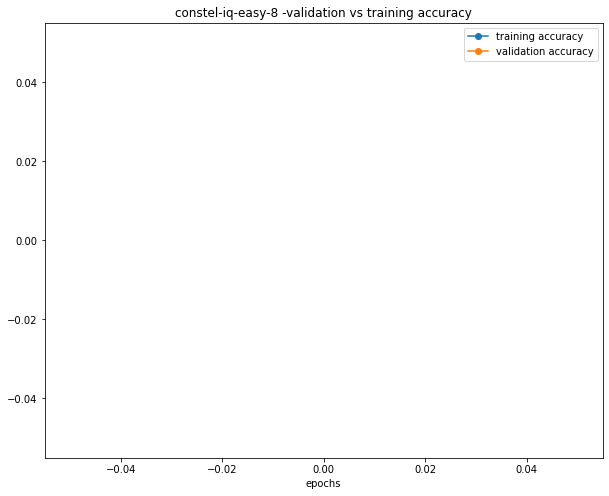

None

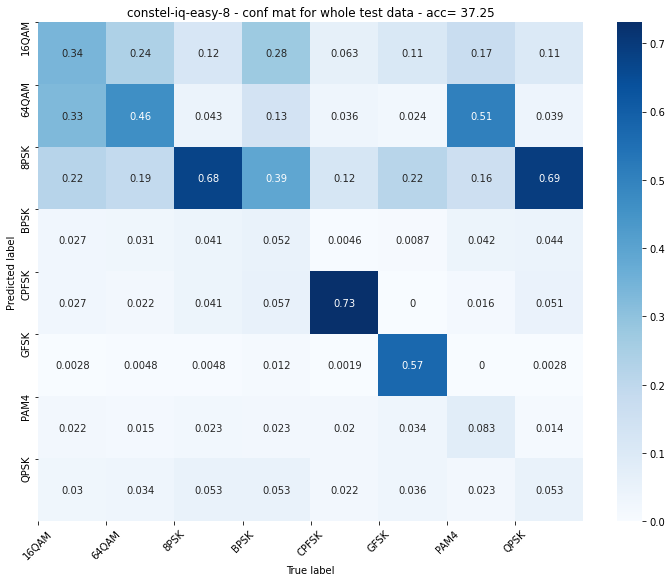

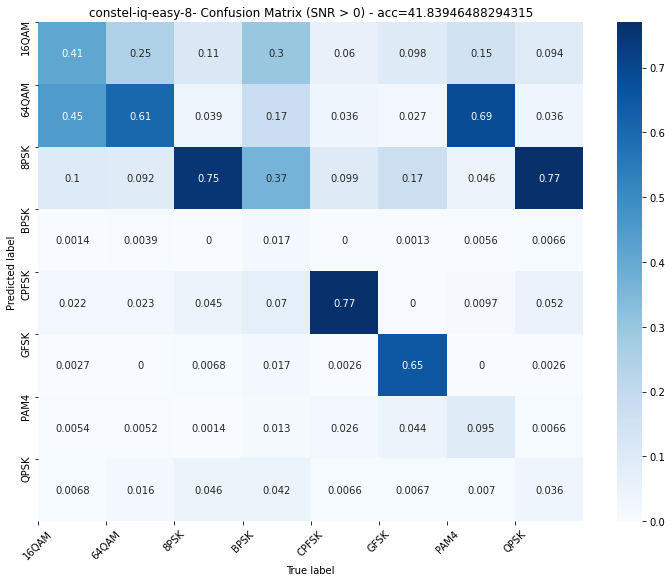

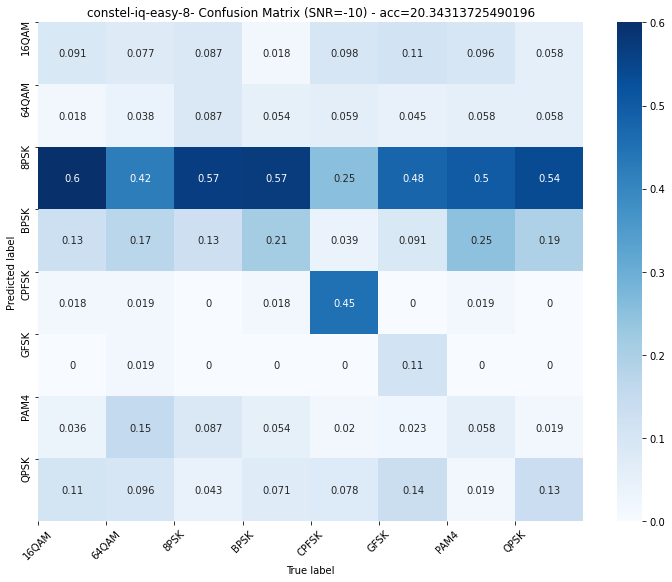

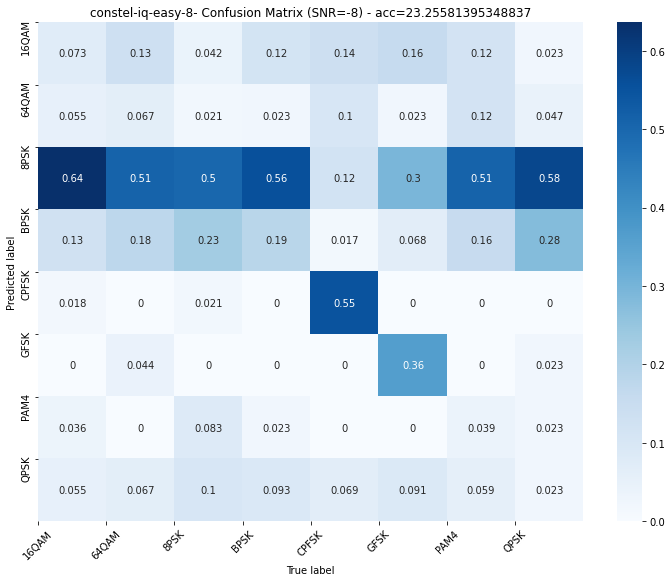

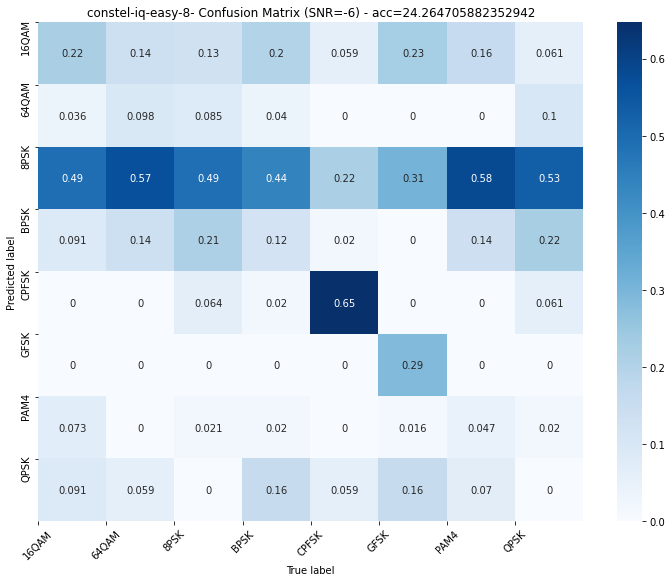

...

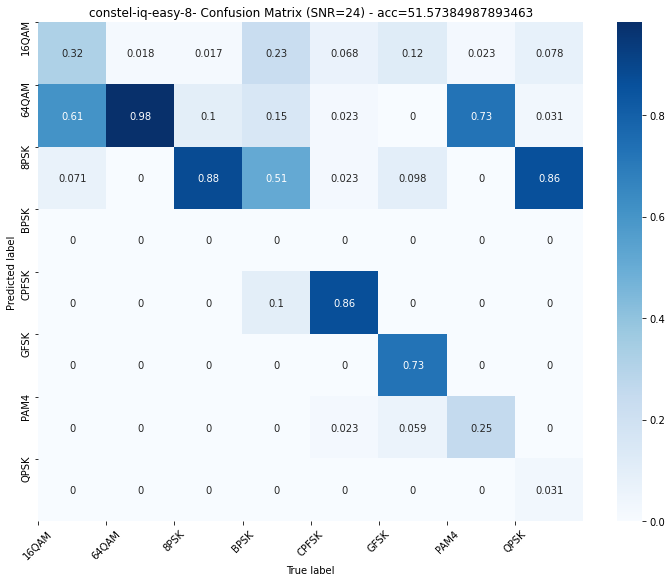

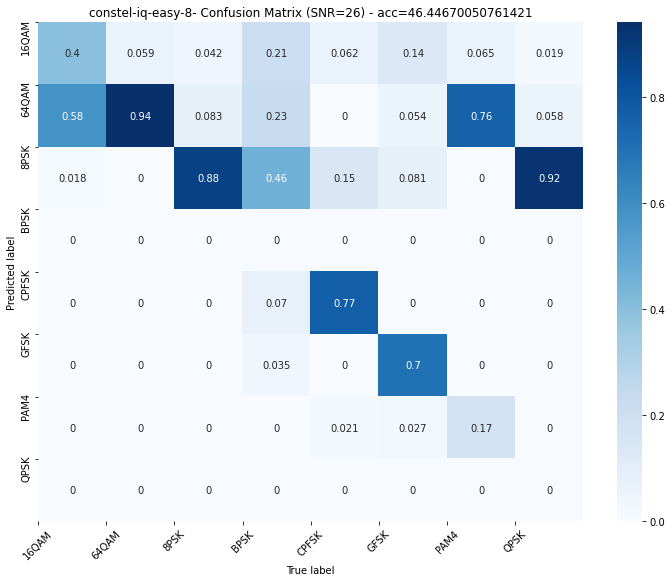

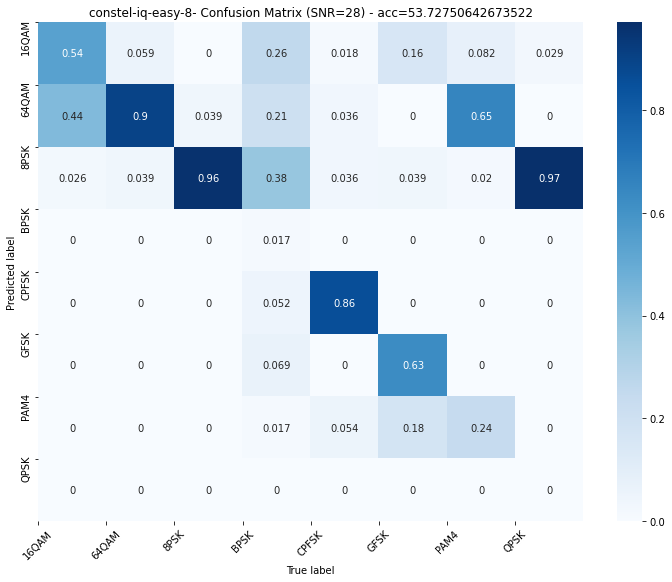

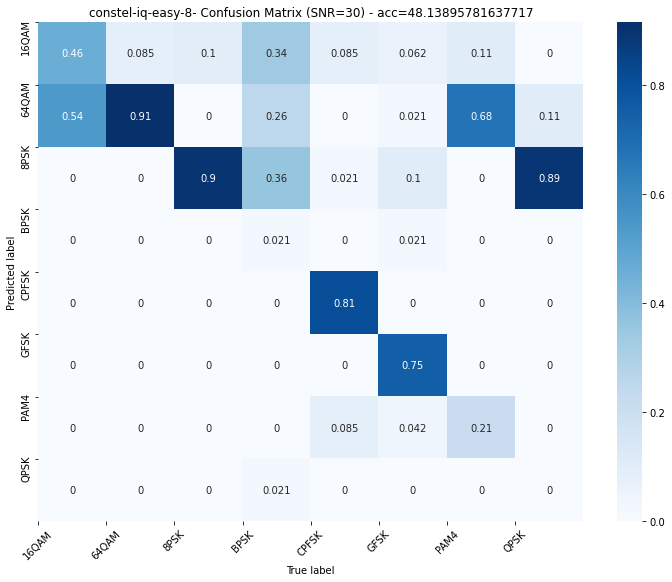

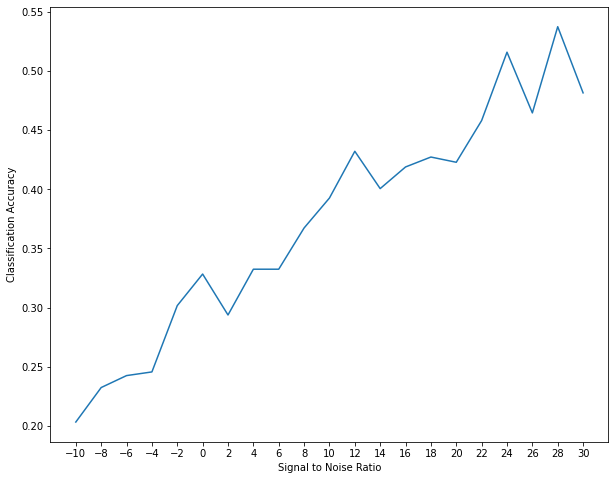

In [ ]:
NUM_CLASSES = 8
BATCH_SIZE=32 #Cannot be too big otherwise will exceed memory
easy_imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
easy_imgtime_model.load_weights(root_path + 'constel-iq-easy-8-weights-8.hdf5')
easy_imgtime_model_evaluater = ModelEvaluater(easy_imgtime_model, [X_img_test, X_test], y_test, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 'constel-iq-easy-8', feature_type=2)
easy_imgtime_model_evaluater.print_summary()

Surprisingly bad...

#### Test easy-trained model on medium dataset

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1024, 40)     120         input_2[0][0]                    
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 1024, 40)     0           conv1d_1[0][0]                   
__________________________________________________________________________________________________
conv1d_2 (Conv

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


y_train 8400
y_test 8400


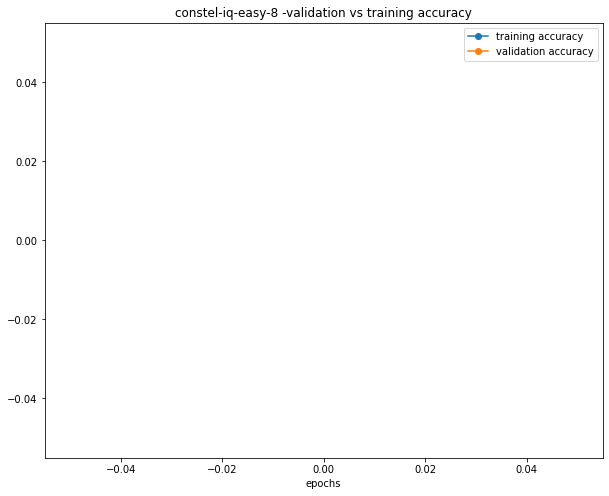

None

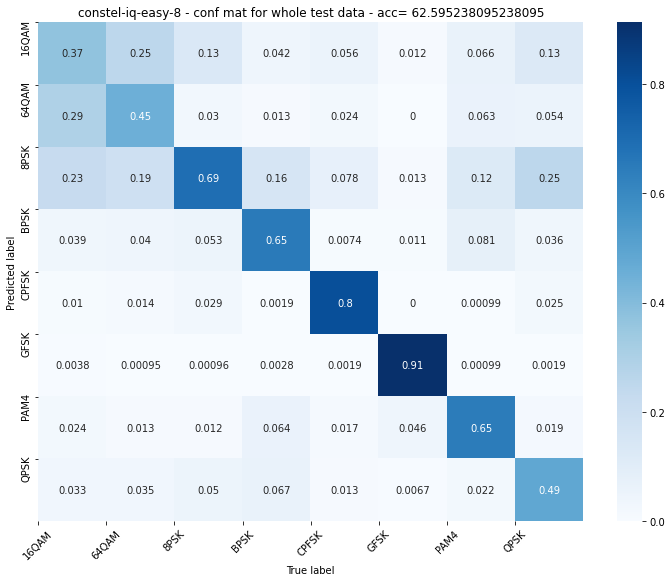

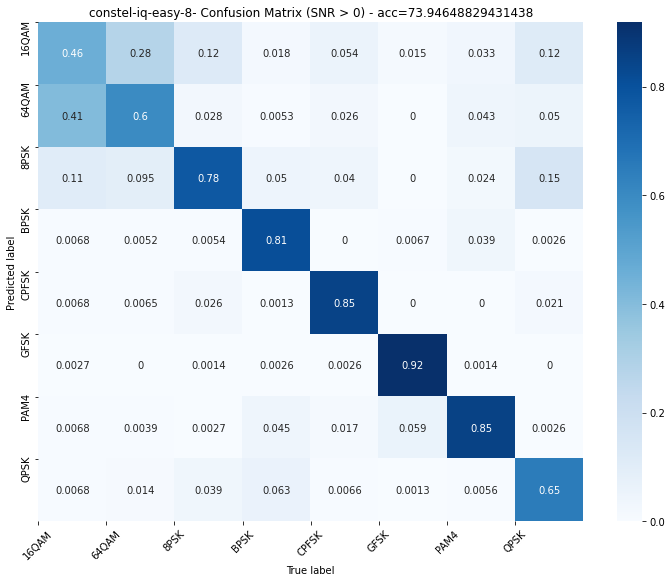

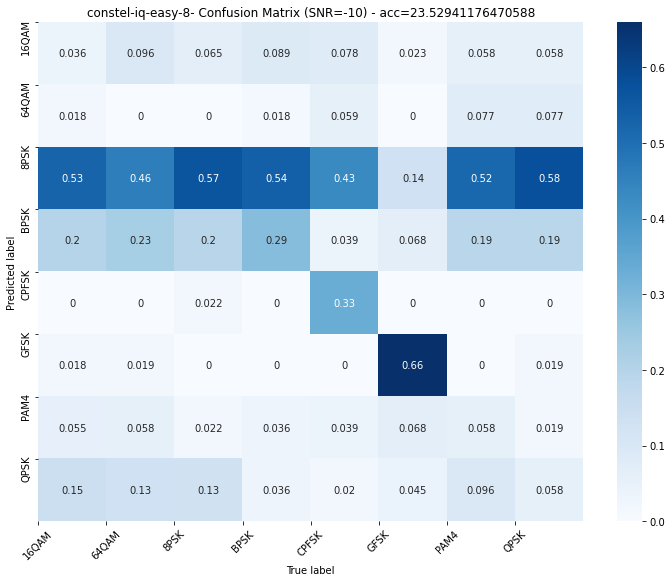

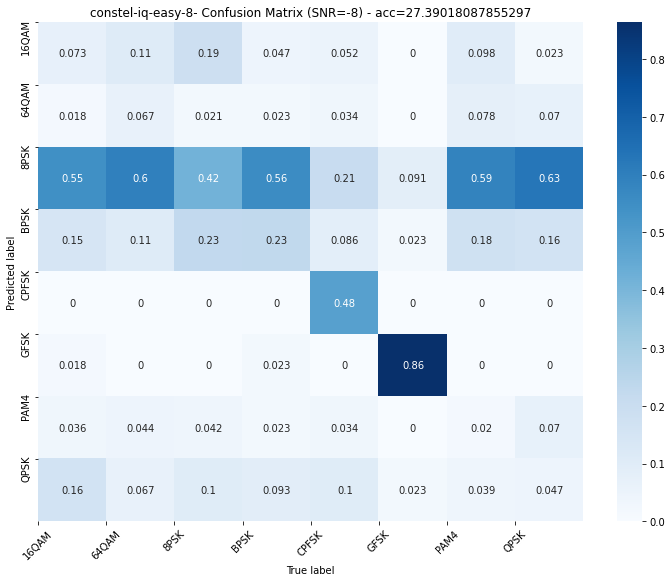

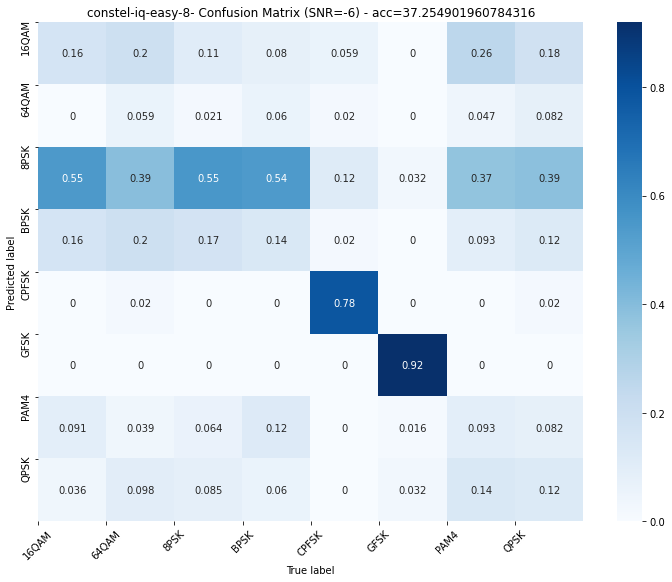

...

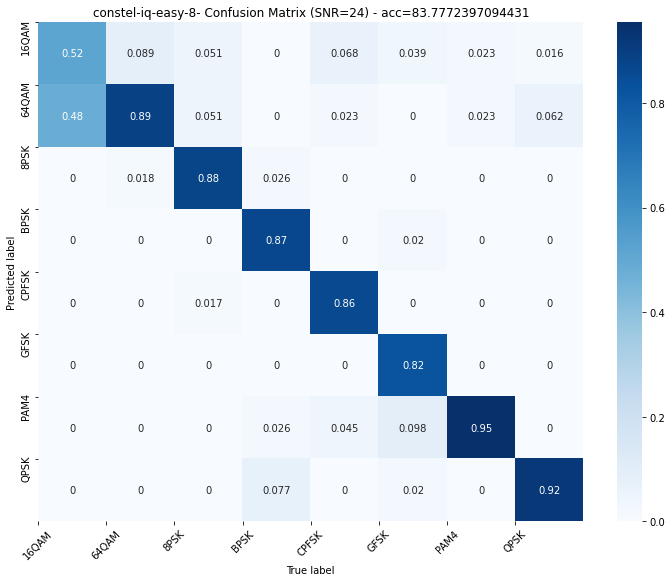

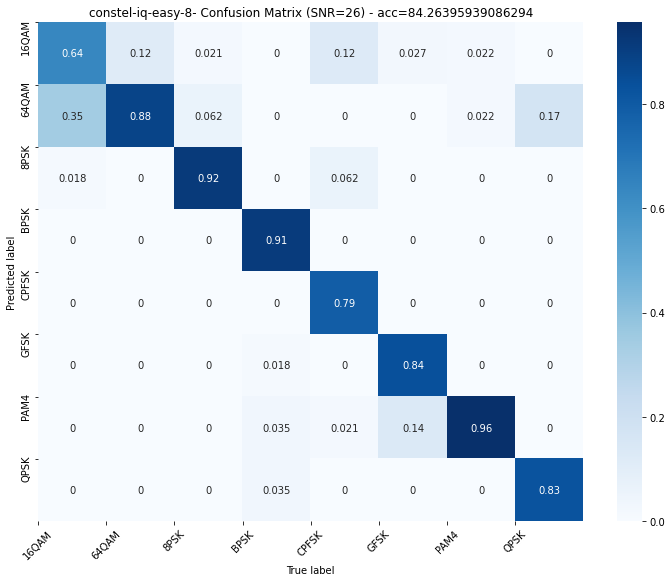

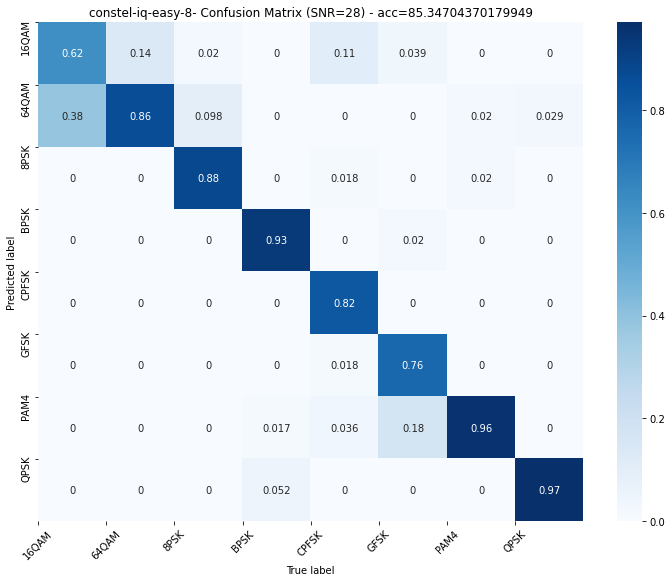

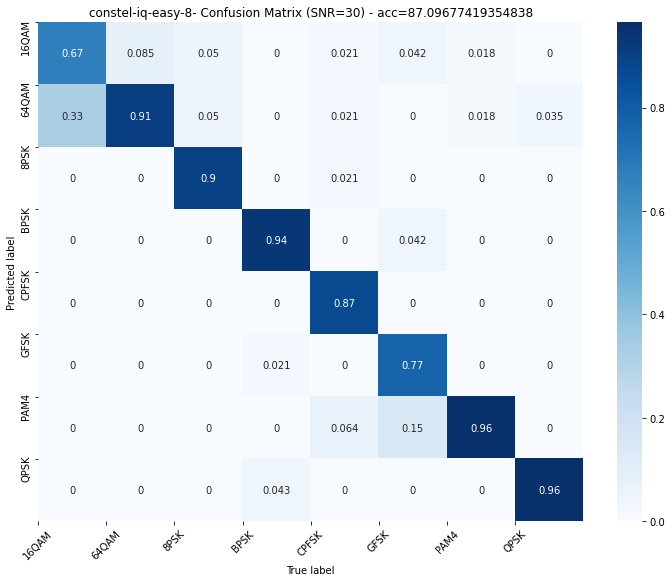

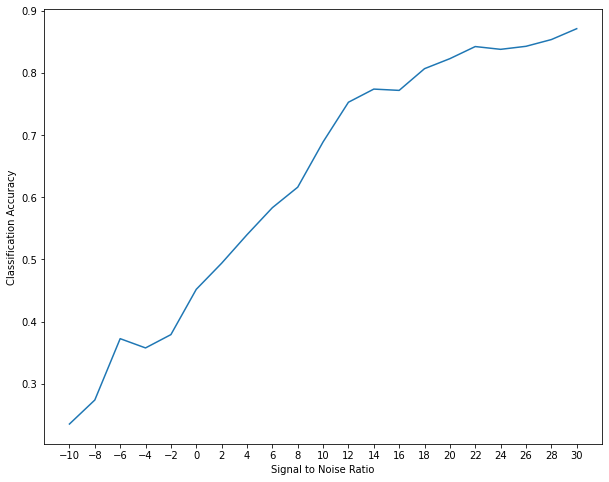

In [ ]:
NUM_CLASSES = 8
BATCH_SIZE=32 #Cannot be too big otherwise will exceed memory
easy_imgtime_model = build_imgtime_net(X_med_img_test.shape[-2], X_med_test.shape[-2], X_med_test.shape[-1])
easy_imgtime_model.load_weights(root_path + 'constel-iq-easy-8-weights-8.hdf5')
easy_imgtime_model_evaluater = ModelEvaluater(easy_imgtime_model, [X_med_img_test, X_med_test], y_med_test, [X_med_img_test, X_med_test], y_med_test, labels_med_test, labels_med, BATCH_SIZE, 'constel-iq-easy-8', feature_type=2)
easy_imgtime_model_evaluater.print_summary()

Bad.

### Performance comparison of img-time model across datasets

In [ ]:
#build and get accspersnr for each model
imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
imgtime_model.load_weights(root_path + 'constel-iq-hard-8-weights-15.hdf5')
imgtime_model_evaluater = ModelEvaluater(imgtime_model, [X_img_test, X_test], y_test, [X_img_test, X_test], y_test, labels_test, labels, BATCH_SIZE, 'constel-iq-hard-8', feature_type=2)
imgtime_accpersnr = imgtime_model_evaluater.accpersnr_model()

med_imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
med_imgtime_model.load_weights(root_path + 'constel-iq-med-8-weights-13.hdf5')
med_imgtime_model_evaluater = ModelEvaluater(med_imgtime_model, [X_img_test, X_test], y_test, [X_med_img_test, X_med_test], y_med_test, labels_med_test, labels_med, BATCH_SIZE, 'constel-iq-med-8', feature_type=2)
med_imgtime_accpersnr = med_imgtime_model_evaluater.accpersnr_model()

easy_imgtime_model = build_imgtime_net(X_img_test.shape[-2], X_test.shape[-2], X_test.shape[-1])
easy_imgtime_model.load_weights(root_path + 'constel-iq-easy-8-weights-8.hdf5')
easy_imgtime_model_evaluater = ModelEvaluater(easy_imgtime_model, [X_img_test, X_test], y_test, [X_easy_img_test, X_easy_test], y_easy_test, labels_easy_test, labels_easy, BATCH_SIZE, 'constel-iq-easy-8', feature_type=2)
easy_imgtime_accpersnr = easy_imgtime_model_evaluater.accpersnr_model()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_336 (Conv1D)             (None, 1024, 40)     120         input_26[0][0]                   
__________________________________________________________________________________________________
activation_336 (Activation)     (None, 1024, 40)     0           conv1d_336[0][0]                 
__________________________________________________________________________________________________
conv1d_337 (Conv1D)             (None, 1024, 40)     4840        activation_336[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_361 (Conv1D)             (None, 1024, 40)     120         input_28[0][0]                   
__________________________________________________________________________________________________
activation_361 (Activation)     (None, 1024, 40)     0           conv1d_361[0][0]                 
__________________________________________________________________________________________________
conv1d_362 (Conv1D)             (None, 1024, 40)     4840        activation_361[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:75: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(8, activation="softmax", kernel_initializer="he_normal")`


Model: "model_16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           (None, 1024, 2)      0                                            
__________________________________________________________________________________________________
conv1d_386 (Conv1D)             (None, 1024, 40)     120         input_30[0][0]                   
__________________________________________________________________________________________________
activation_386 (Activation)     (None, 1024, 40)     0           conv1d_386[0][0]                 
__________________________________________________________________________________________________
conv1d_387 (Conv1D)             (None, 1024, 40)     4840        activation_386[0][0]             
___________________________________________________________________________________________

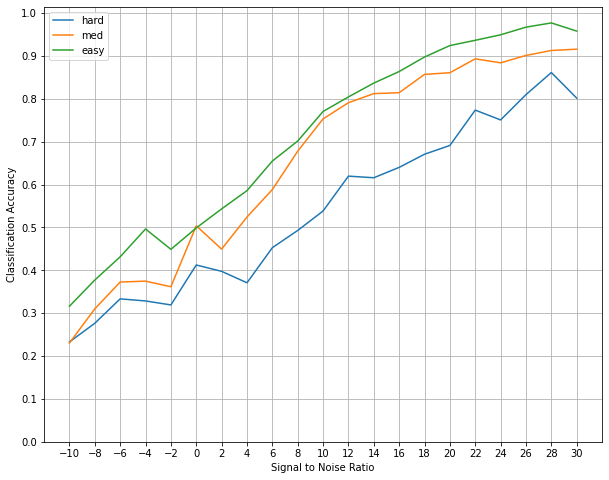

In [ ]:
# plot acc-vs-snr graphs for different models
hard,  = plt.plot(list(imgtime_accpersnr.keys()),list(imgtime_accpersnr.values()), label='hard')
med,  = plt.plot(list(med_imgtime_accpersnr.keys()),list(med_imgtime_accpersnr.values()), label='med')
easy,  = plt.plot(list(easy_imgtime_accpersnr.keys()),list(easy_imgtime_accpersnr.values()), label='easy')

plt.xlabel("Signal to Noise Ratio")
plt.ylabel("Classification Accuracy")
plt.xticks(list(imgtime_accpersnr.keys()))
plt.legend(handles = [hard, med, easy])
plt.yticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.grid(True)
plt.show()